# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

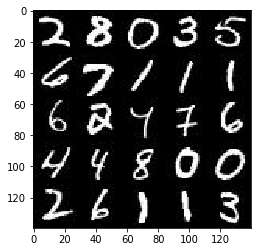

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

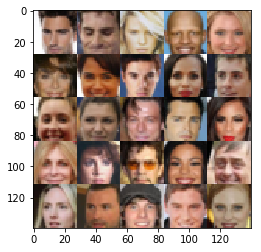

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [7]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.8.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [8]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_images = tf.placeholder(tf.float32, (None, *(image_width, image_height, image_channels)), name='input_real')
    z_data = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')

    return real_images, z_data, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [9]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    keep_probability = 0.8
    alpha = 0.2
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # 1st layer
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.nn.dropout(x1, keep_probability)
        leaky_relu1 = tf.maximum(alpha * x1, x1)
        
        # 2nd layer
        x2 = tf.layers.conv2d(leaky_relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.nn.dropout(x2, keep_probability)
        batch_norm2 = tf.layers.batch_normalization(x2, training=True)
        leaky_relu2 = tf.maximum(alpha * batch_norm2, batch_norm2)
        
        # 3rd layer
        x3 = tf.layers.conv2d(leaky_relu2, 512, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.nn.dropout(x3, keep_probability)
        batch_norm3 = tf.layers.batch_normalization(x3, training=True)
        leaky_relu3 = tf.maximum(alpha * batch_norm3, batch_norm3)


        # 4th layer
        flat = tf.reshape(leaky_relu3, (-1, 4*4*512))
        logits = tf.layers.dense(flat, 1, kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        logits = tf.nn.dropout(logits, keep_probability)
        out = tf.sigmoid(logits)
    
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [10]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    keep_probability = 0.9 
    alpha = 0.2
    
    with tf.variable_scope('generator', reuse=not is_train):
        
        # 1st layer
        x1 = tf.layers.dense(z, 7*7*512, kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        batch_norm1 = tf.layers.batch_normalization(x1, training=is_train)
        leaky_relu1 = tf.maximum(alpha * batch_norm1, batch_norm1)
        
        # 2nd layer
        x2 = tf.layers.conv2d_transpose(leaky_relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        batch_norm2 = tf.layers.batch_normalization(x2, training=is_train)
        leaky_relu2 = tf.maximum(alpha * batch_norm2, batch_norm2)
        
        # 3rd layer
        x3 = tf.layers.conv2d_transpose(leaky_relu2, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        batch_norm3 = tf.layers.batch_normalization(x3, training=is_train)
        leaky_relu3 = tf.maximum(alpha * batch_norm3, batch_norm3)
        
        # 4th layer
        logits = tf.layers.conv2d_transpose(leaky_relu3, out_channel_dim, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.tanh(logits)
    
    return out



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [11]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [14]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [15]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    if (data_image_mode == "L"):
        out_channel_dim=1
    else:
        out_channel_dim=3
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    lr = learning_rate
    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    print_every=10
    show_every=100
    samples, losses = [], []
    steps=0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                steps += 1
            
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                
                if steps % print_every == 0:
                    
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f} ...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 9, input_z, data_shape[3], data_image_mode)
            
            show_generator_output(sess, 9, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/8... Discriminator Loss: 0.2496 ... Generator Loss: 6.8563
Epoch 1/8... Discriminator Loss: 0.3466 ... Generator Loss: 9.1524
Epoch 1/8... Discriminator Loss: 0.2606 ... Generator Loss: 7.8776
Epoch 1/8... Discriminator Loss: 0.2384 ... Generator Loss: 8.0710
Epoch 1/8... Discriminator Loss: 0.2713 ... Generator Loss: 8.2445
Epoch 1/8... Discriminator Loss: 0.3359 ... Generator Loss: 8.5655
Epoch 1/8... Discriminator Loss: 0.2443 ... Generator Loss: 7.6271
Epoch 1/8... Discriminator Loss: 1.6052 ... Generator Loss: 13.9077
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 21.9911
Epoch 1/8... Discriminator Loss: 0.2058 ... Generator Loss: 22.1396


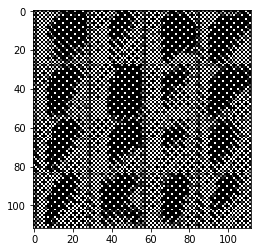

Epoch 1/8... Discriminator Loss: 0.2329 ... Generator Loss: 17.9997
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 14.6703
Epoch 1/8... Discriminator Loss: 0.3412 ... Generator Loss: 12.6992
Epoch 1/8... Discriminator Loss: 0.3200 ... Generator Loss: 12.0399
Epoch 1/8... Discriminator Loss: 0.2220 ... Generator Loss: 11.4674
Epoch 1/8... Discriminator Loss: 0.2870 ... Generator Loss: 11.2994
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 11.1643
Epoch 1/8... Discriminator Loss: 0.3088 ... Generator Loss: 11.1860
Epoch 1/8... Discriminator Loss: 0.3143 ... Generator Loss: 11.8829
Epoch 1/8... Discriminator Loss: 0.2329 ... Generator Loss: 11.5375


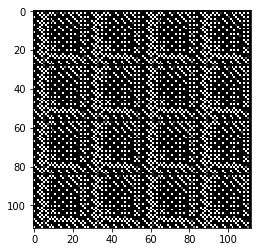

Epoch 1/8... Discriminator Loss: 0.2654 ... Generator Loss: 12.1743
Epoch 1/8... Discriminator Loss: 0.4007 ... Generator Loss: 12.1215
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 9.8792
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 11.4240
Epoch 1/8... Discriminator Loss: 0.2545 ... Generator Loss: 11.4337
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 12.1363
Epoch 1/8... Discriminator Loss: 0.2329 ... Generator Loss: 11.3360
Epoch 1/8... Discriminator Loss: 0.2492 ... Generator Loss: 12.6971
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 12.8242
Epoch 1/8... Discriminator Loss: 0.3195 ... Generator Loss: 11.9355


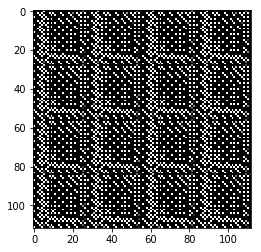

Epoch 1/8... Discriminator Loss: 0.3412 ... Generator Loss: 10.8232
Epoch 1/8... Discriminator Loss: 0.2166 ... Generator Loss: 12.7702
Epoch 1/8... Discriminator Loss: 0.2708 ... Generator Loss: 11.4427
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.2293
Epoch 1/8... Discriminator Loss: 0.1841 ... Generator Loss: 12.7369
Epoch 1/8... Discriminator Loss: 0.2383 ... Generator Loss: 12.0739
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 12.5455
Epoch 1/8... Discriminator Loss: 0.2599 ... Generator Loss: 11.9583
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 11.9725
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 10.7512


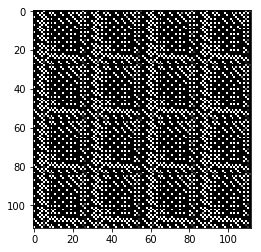

Epoch 1/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.1103
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 12.7221
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.3567
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.8111
Epoch 1/8... Discriminator Loss: 0.2653 ... Generator Loss: 12.8259
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 12.8810
Epoch 1/8... Discriminator Loss: 0.2708 ... Generator Loss: 13.0019
Epoch 1/8... Discriminator Loss: 0.2223 ... Generator Loss: 13.0785
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 12.6852
Epoch 1/8... Discriminator Loss: 0.2383 ... Generator Loss: 12.3130


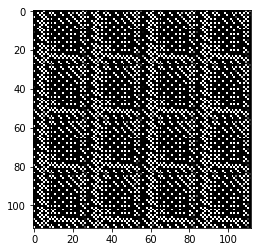

Epoch 1/8... Discriminator Loss: 0.3303 ... Generator Loss: 12.9160
Epoch 1/8... Discriminator Loss: 0.3141 ... Generator Loss: 13.0597
Epoch 1/8... Discriminator Loss: 0.3412 ... Generator Loss: 11.5499
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.2750
Epoch 1/8... Discriminator Loss: 0.3466 ... Generator Loss: 12.3678
Epoch 1/8... Discriminator Loss: 0.3628 ... Generator Loss: 13.4083
Epoch 1/8... Discriminator Loss: 0.2762 ... Generator Loss: 12.2913
Epoch 1/8... Discriminator Loss: 0.2816 ... Generator Loss: 12.0370
Epoch 1/8... Discriminator Loss: 0.2545 ... Generator Loss: 13.0925
Epoch 1/8... Discriminator Loss: 0.3141 ... Generator Loss: 11.7063


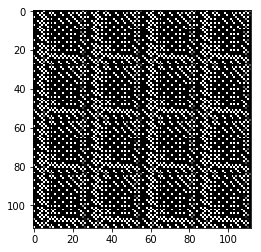

Epoch 1/8... Discriminator Loss: 0.2329 ... Generator Loss: 12.4467
Epoch 1/8... Discriminator Loss: 0.1625 ... Generator Loss: 12.0467
Epoch 1/8... Discriminator Loss: 0.2816 ... Generator Loss: 11.6978
Epoch 1/8... Discriminator Loss: 0.3141 ... Generator Loss: 12.0931
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 14.4177
Epoch 1/8... Discriminator Loss: 0.3737 ... Generator Loss: 13.0621
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.8957
Epoch 1/8... Discriminator Loss: 0.3249 ... Generator Loss: 11.9035
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 11.9362
Epoch 1/8... Discriminator Loss: 0.2762 ... Generator Loss: 12.4599


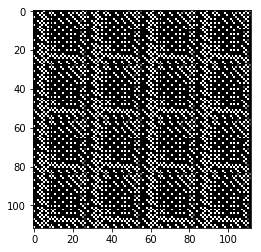

Epoch 1/8... Discriminator Loss: 0.2708 ... Generator Loss: 13.0735
Epoch 1/8... Discriminator Loss: 0.3087 ... Generator Loss: 13.4103
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 12.9214
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 12.7361
Epoch 1/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.1956
Epoch 1/8... Discriminator Loss: 0.3737 ... Generator Loss: 13.9249
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 12.3278
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 13.9225
Epoch 1/8... Discriminator Loss: 0.3249 ... Generator Loss: 13.2123
Epoch 1/8... Discriminator Loss: 0.2112 ... Generator Loss: 12.6107


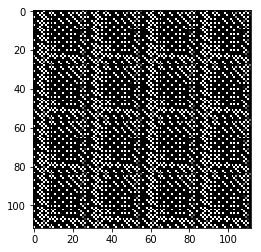

Epoch 1/8... Discriminator Loss: 0.3357 ... Generator Loss: 12.9812
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 13.5350
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.5049
Epoch 1/8... Discriminator Loss: 0.2816 ... Generator Loss: 13.8729
Epoch 1/8... Discriminator Loss: 0.2816 ... Generator Loss: 13.7045
Epoch 1/8... Discriminator Loss: 0.2653 ... Generator Loss: 13.5882
Epoch 1/8... Discriminator Loss: 0.2599 ... Generator Loss: 13.1367
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 12.8605
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 12.4543
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 13.2232


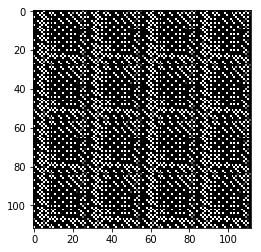

Epoch 1/8... Discriminator Loss: 0.3303 ... Generator Loss: 12.9762
Epoch 1/8... Discriminator Loss: 0.2653 ... Generator Loss: 13.1288
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.5723


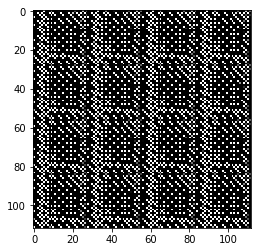

Epoch 2/8... Discriminator Loss: 0.1950 ... Generator Loss: 13.1999
Epoch 2/8... Discriminator Loss: 0.2112 ... Generator Loss: 13.5867
Epoch 2/8... Discriminator Loss: 0.2924 ... Generator Loss: 13.3990
Epoch 2/8... Discriminator Loss: 0.2545 ... Generator Loss: 13.3989
Epoch 2/8... Discriminator Loss: 0.2924 ... Generator Loss: 13.0058
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.9969
Epoch 2/8... Discriminator Loss: 0.3628 ... Generator Loss: 12.9057


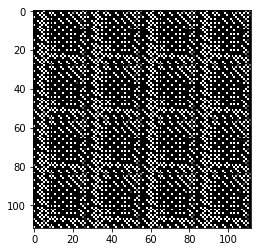

Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 13.7231
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 12.5337
Epoch 2/8... Discriminator Loss: 0.2545 ... Generator Loss: 14.1785
Epoch 2/8... Discriminator Loss: 0.3357 ... Generator Loss: 13.7706
Epoch 2/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.1261
Epoch 2/8... Discriminator Loss: 0.3195 ... Generator Loss: 13.2657
Epoch 2/8... Discriminator Loss: 0.3195 ... Generator Loss: 13.2139
Epoch 2/8... Discriminator Loss: 0.2437 ... Generator Loss: 13.3745
Epoch 2/8... Discriminator Loss: 0.2599 ... Generator Loss: 13.9469
Epoch 2/8... Discriminator Loss: 0.2329 ... Generator Loss: 13.4025


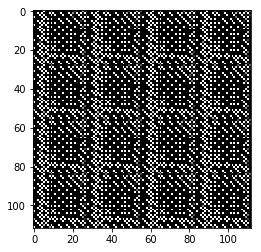

Epoch 2/8... Discriminator Loss: 0.2924 ... Generator Loss: 11.5414
Epoch 2/8... Discriminator Loss: 0.2383 ... Generator Loss: 12.6139
Epoch 2/8... Discriminator Loss: 0.2112 ... Generator Loss: 13.4107
Epoch 2/8... Discriminator Loss: 0.3195 ... Generator Loss: 13.9209
Epoch 2/8... Discriminator Loss: 0.2220 ... Generator Loss: 13.3807
Epoch 2/8... Discriminator Loss: 0.1950 ... Generator Loss: 13.8393
Epoch 2/8... Discriminator Loss: 0.2762 ... Generator Loss: 14.1228
Epoch 2/8... Discriminator Loss: 0.3087 ... Generator Loss: 13.2463
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.4829
Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 13.6476


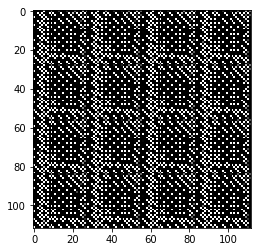

Epoch 2/8... Discriminator Loss: 0.2979 ... Generator Loss: 13.7966
Epoch 2/8... Discriminator Loss: 0.2816 ... Generator Loss: 13.8846
Epoch 2/8... Discriminator Loss: 0.3899 ... Generator Loss: 13.4248
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.5845
Epoch 2/8... Discriminator Loss: 0.3466 ... Generator Loss: 13.3228
Epoch 2/8... Discriminator Loss: 0.2653 ... Generator Loss: 13.3092
Epoch 2/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.9441
Epoch 2/8... Discriminator Loss: 0.2329 ... Generator Loss: 13.9205
Epoch 2/8... Discriminator Loss: 0.2816 ... Generator Loss: 14.1736
Epoch 2/8... Discriminator Loss: 0.3953 ... Generator Loss: 14.5912


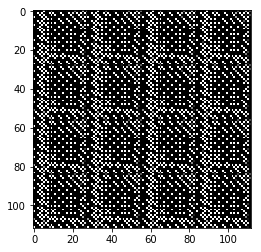

Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.4148
Epoch 2/8... Discriminator Loss: 0.3628 ... Generator Loss: 13.6614
Epoch 2/8... Discriminator Loss: 0.3087 ... Generator Loss: 14.4838
Epoch 2/8... Discriminator Loss: 0.2653 ... Generator Loss: 14.1898
Epoch 2/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.9814
Epoch 2/8... Discriminator Loss: 0.2762 ... Generator Loss: 13.9692
Epoch 2/8... Discriminator Loss: 0.3087 ... Generator Loss: 15.1589
Epoch 2/8... Discriminator Loss: 0.2329 ... Generator Loss: 14.3872
Epoch 2/8... Discriminator Loss: 0.3520 ... Generator Loss: 13.8466
Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 14.1391


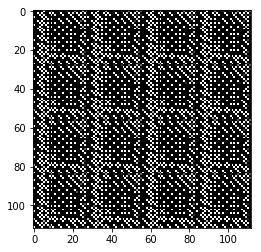

Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 15.3479
Epoch 2/8... Discriminator Loss: 0.2491 ... Generator Loss: 14.2603
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.8705
Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 14.2501
Epoch 2/8... Discriminator Loss: 0.8437 ... Generator Loss: 8.9909
Epoch 2/8... Discriminator Loss: 6.7180 ... Generator Loss: 4.8022
Epoch 2/8... Discriminator Loss: 1.6522 ... Generator Loss: 3.4777
Epoch 2/8... Discriminator Loss: 3.0685 ... Generator Loss: 8.0399
Epoch 2/8... Discriminator Loss: 1.1653 ... Generator Loss: 6.7333
Epoch 2/8... Discriminator Loss: 4.9251 ... Generator Loss: 0.1600


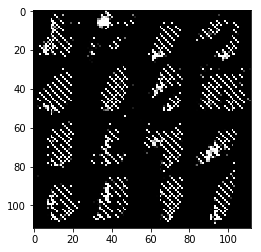

Epoch 2/8... Discriminator Loss: 4.3289 ... Generator Loss: 0.3246
Epoch 2/8... Discriminator Loss: 2.7181 ... Generator Loss: 0.4903
Epoch 2/8... Discriminator Loss: 0.8537 ... Generator Loss: 2.0164
Epoch 2/8... Discriminator Loss: 2.3483 ... Generator Loss: 0.7902
Epoch 2/8... Discriminator Loss: 1.5699 ... Generator Loss: 2.7455
Epoch 2/8... Discriminator Loss: 1.0479 ... Generator Loss: 2.3510
Epoch 2/8... Discriminator Loss: 1.1465 ... Generator Loss: 1.5072
Epoch 2/8... Discriminator Loss: 1.9529 ... Generator Loss: 2.7006
Epoch 2/8... Discriminator Loss: 1.5745 ... Generator Loss: 2.1448
Epoch 2/8... Discriminator Loss: 1.4338 ... Generator Loss: 2.5656


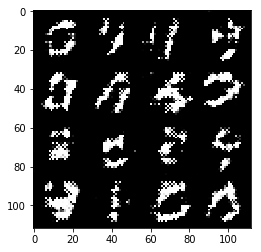

Epoch 2/8... Discriminator Loss: 1.3557 ... Generator Loss: 0.6377
Epoch 2/8... Discriminator Loss: 2.0476 ... Generator Loss: 0.2926
Epoch 2/8... Discriminator Loss: 1.1923 ... Generator Loss: 3.2373
Epoch 2/8... Discriminator Loss: 1.2859 ... Generator Loss: 2.3991
Epoch 2/8... Discriminator Loss: 0.8092 ... Generator Loss: 2.2033
Epoch 2/8... Discriminator Loss: 0.9596 ... Generator Loss: 0.9964
Epoch 2/8... Discriminator Loss: 1.5404 ... Generator Loss: 3.2458
Epoch 2/8... Discriminator Loss: 0.9862 ... Generator Loss: 0.7039
Epoch 2/8... Discriminator Loss: 1.0269 ... Generator Loss: 3.0147
Epoch 2/8... Discriminator Loss: 0.6754 ... Generator Loss: 1.6456


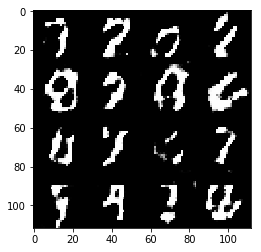

Epoch 2/8... Discriminator Loss: 0.6432 ... Generator Loss: 2.0462
Epoch 2/8... Discriminator Loss: 0.8126 ... Generator Loss: 1.5656
Epoch 2/8... Discriminator Loss: 1.0514 ... Generator Loss: 2.1291
Epoch 2/8... Discriminator Loss: 1.8639 ... Generator Loss: 0.3519
Epoch 2/8... Discriminator Loss: 1.1556 ... Generator Loss: 0.7275
Epoch 2/8... Discriminator Loss: 1.0439 ... Generator Loss: 0.8080
Epoch 2/8... Discriminator Loss: 0.8541 ... Generator Loss: 1.2552
Epoch 2/8... Discriminator Loss: 0.8307 ... Generator Loss: 2.0217
Epoch 2/8... Discriminator Loss: 2.6424 ... Generator Loss: 5.7774
Epoch 2/8... Discriminator Loss: 0.9961 ... Generator Loss: 2.9433


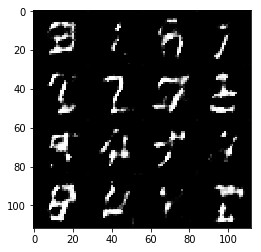

Epoch 2/8... Discriminator Loss: 1.6119 ... Generator Loss: 0.3830
Epoch 2/8... Discriminator Loss: 1.0548 ... Generator Loss: 1.1235
Epoch 2/8... Discriminator Loss: 1.3877 ... Generator Loss: 0.7242
Epoch 2/8... Discriminator Loss: 1.4698 ... Generator Loss: 1.2524
Epoch 2/8... Discriminator Loss: 1.9909 ... Generator Loss: 3.3520
Epoch 2/8... Discriminator Loss: 1.1826 ... Generator Loss: 1.1427
Epoch 2/8... Discriminator Loss: 1.8862 ... Generator Loss: 0.3482


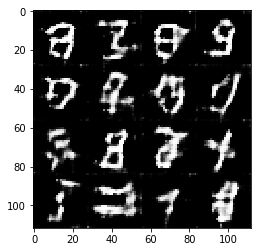

Epoch 3/8... Discriminator Loss: 1.2638 ... Generator Loss: 0.5828
Epoch 3/8... Discriminator Loss: 1.0309 ... Generator Loss: 1.1827
Epoch 3/8... Discriminator Loss: 1.0893 ... Generator Loss: 0.7385


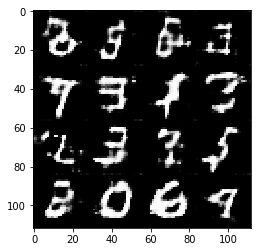

Epoch 3/8... Discriminator Loss: 1.3623 ... Generator Loss: 0.6632
Epoch 3/8... Discriminator Loss: 1.3332 ... Generator Loss: 2.2498
Epoch 3/8... Discriminator Loss: 1.2169 ... Generator Loss: 1.0028
Epoch 3/8... Discriminator Loss: 0.8800 ... Generator Loss: 1.4935
Epoch 3/8... Discriminator Loss: 1.7953 ... Generator Loss: 0.2698
Epoch 3/8... Discriminator Loss: 1.1366 ... Generator Loss: 2.1972
Epoch 3/8... Discriminator Loss: 1.3834 ... Generator Loss: 1.0950
Epoch 3/8... Discriminator Loss: 1.1728 ... Generator Loss: 1.9867
Epoch 3/8... Discriminator Loss: 1.4132 ... Generator Loss: 0.5865
Epoch 3/8... Discriminator Loss: 1.0960 ... Generator Loss: 0.9347


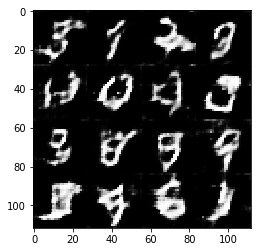

Epoch 3/8... Discriminator Loss: 1.2711 ... Generator Loss: 0.7018
Epoch 3/8... Discriminator Loss: 1.4968 ... Generator Loss: 0.4492
Epoch 3/8... Discriminator Loss: 0.9875 ... Generator Loss: 0.8992
Epoch 3/8... Discriminator Loss: 1.4193 ... Generator Loss: 0.6299
Epoch 3/8... Discriminator Loss: 0.9932 ... Generator Loss: 1.4505
Epoch 3/8... Discriminator Loss: 1.6083 ... Generator Loss: 2.5270
Epoch 3/8... Discriminator Loss: 1.3926 ... Generator Loss: 1.3211
Epoch 3/8... Discriminator Loss: 1.2242 ... Generator Loss: 1.1251
Epoch 3/8... Discriminator Loss: 1.4401 ... Generator Loss: 1.4510
Epoch 3/8... Discriminator Loss: 1.3217 ... Generator Loss: 1.3401


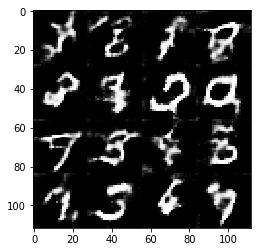

Epoch 3/8... Discriminator Loss: 1.1221 ... Generator Loss: 1.0619
Epoch 3/8... Discriminator Loss: 1.5637 ... Generator Loss: 2.1123
Epoch 3/8... Discriminator Loss: 1.0615 ... Generator Loss: 1.3937
Epoch 3/8... Discriminator Loss: 1.2022 ... Generator Loss: 1.0962
Epoch 3/8... Discriminator Loss: 1.6193 ... Generator Loss: 0.4225
Epoch 3/8... Discriminator Loss: 1.2607 ... Generator Loss: 0.6493
Epoch 3/8... Discriminator Loss: 1.4720 ... Generator Loss: 0.4407
Epoch 3/8... Discriminator Loss: 1.6067 ... Generator Loss: 0.4186
Epoch 3/8... Discriminator Loss: 1.2429 ... Generator Loss: 0.6830
Epoch 3/8... Discriminator Loss: 1.3641 ... Generator Loss: 1.2117


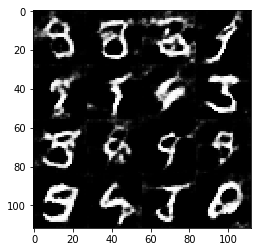

Epoch 3/8... Discriminator Loss: 1.1968 ... Generator Loss: 0.9451
Epoch 3/8... Discriminator Loss: 1.2031 ... Generator Loss: 0.8072
Epoch 3/8... Discriminator Loss: 1.2094 ... Generator Loss: 0.6535
Epoch 3/8... Discriminator Loss: 1.4318 ... Generator Loss: 0.4728
Epoch 3/8... Discriminator Loss: 1.5002 ... Generator Loss: 0.4996
Epoch 3/8... Discriminator Loss: 1.1992 ... Generator Loss: 0.7689
Epoch 3/8... Discriminator Loss: 1.2023 ... Generator Loss: 0.6674
Epoch 3/8... Discriminator Loss: 1.0767 ... Generator Loss: 0.7800
Epoch 3/8... Discriminator Loss: 1.2629 ... Generator Loss: 0.5621
Epoch 3/8... Discriminator Loss: 1.2941 ... Generator Loss: 0.5534


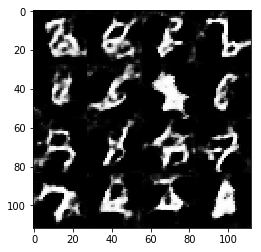

Epoch 3/8... Discriminator Loss: 1.2037 ... Generator Loss: 0.7420
Epoch 3/8... Discriminator Loss: 1.7432 ... Generator Loss: 1.6308
Epoch 3/8... Discriminator Loss: 1.1688 ... Generator Loss: 1.0832
Epoch 3/8... Discriminator Loss: 1.3772 ... Generator Loss: 1.3329
Epoch 3/8... Discriminator Loss: 1.2572 ... Generator Loss: 1.1298
Epoch 3/8... Discriminator Loss: 1.3350 ... Generator Loss: 1.1756
Epoch 3/8... Discriminator Loss: 1.5600 ... Generator Loss: 0.4948
Epoch 3/8... Discriminator Loss: 1.4868 ... Generator Loss: 0.4264
Epoch 3/8... Discriminator Loss: 1.2200 ... Generator Loss: 1.1828
Epoch 3/8... Discriminator Loss: 1.4983 ... Generator Loss: 1.6398


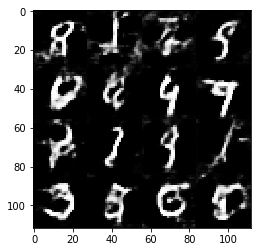

Epoch 3/8... Discriminator Loss: 1.2262 ... Generator Loss: 0.6312
Epoch 3/8... Discriminator Loss: 1.3871 ... Generator Loss: 0.6353
Epoch 3/8... Discriminator Loss: 1.3686 ... Generator Loss: 0.7660
Epoch 3/8... Discriminator Loss: 1.5965 ... Generator Loss: 0.4384
Epoch 3/8... Discriminator Loss: 1.1415 ... Generator Loss: 0.6406
Epoch 3/8... Discriminator Loss: 1.2297 ... Generator Loss: 1.3986
Epoch 3/8... Discriminator Loss: 1.2303 ... Generator Loss: 0.8492
Epoch 3/8... Discriminator Loss: 1.4626 ... Generator Loss: 1.4197
Epoch 3/8... Discriminator Loss: 1.1549 ... Generator Loss: 1.0583
Epoch 3/8... Discriminator Loss: 1.4435 ... Generator Loss: 0.5436


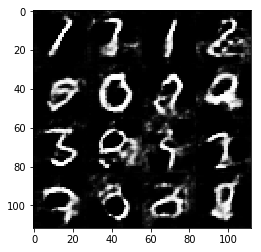

Epoch 3/8... Discriminator Loss: 1.0490 ... Generator Loss: 0.8835
Epoch 3/8... Discriminator Loss: 1.6726 ... Generator Loss: 0.4219
Epoch 3/8... Discriminator Loss: 1.1332 ... Generator Loss: 0.8968
Epoch 3/8... Discriminator Loss: 1.0853 ... Generator Loss: 0.9581
Epoch 3/8... Discriminator Loss: 1.4288 ... Generator Loss: 1.4531
Epoch 3/8... Discriminator Loss: 1.1781 ... Generator Loss: 0.7800
Epoch 3/8... Discriminator Loss: 1.4823 ... Generator Loss: 0.5365
Epoch 3/8... Discriminator Loss: 1.2636 ... Generator Loss: 0.6752
Epoch 3/8... Discriminator Loss: 1.4050 ... Generator Loss: 0.4746
Epoch 3/8... Discriminator Loss: 1.2524 ... Generator Loss: 0.7320


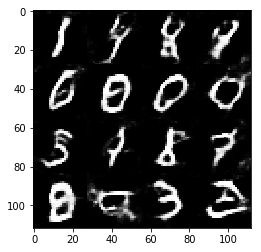

Epoch 3/8... Discriminator Loss: 1.1485 ... Generator Loss: 1.2375
Epoch 3/8... Discriminator Loss: 1.2498 ... Generator Loss: 0.7904
Epoch 3/8... Discriminator Loss: 1.3962 ... Generator Loss: 1.3850
Epoch 3/8... Discriminator Loss: 1.2044 ... Generator Loss: 1.3357
Epoch 3/8... Discriminator Loss: 1.1890 ... Generator Loss: 0.8649
Epoch 3/8... Discriminator Loss: 1.2089 ... Generator Loss: 1.2949
Epoch 3/8... Discriminator Loss: 1.2627 ... Generator Loss: 1.3628
Epoch 3/8... Discriminator Loss: 1.3689 ... Generator Loss: 1.3305
Epoch 3/8... Discriminator Loss: 1.4270 ... Generator Loss: 1.1670
Epoch 3/8... Discriminator Loss: 1.3768 ... Generator Loss: 1.4842


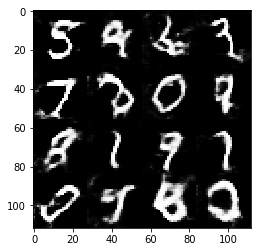

Epoch 3/8... Discriminator Loss: 1.4154 ... Generator Loss: 0.5475
Epoch 3/8... Discriminator Loss: 1.2023 ... Generator Loss: 0.9994
Epoch 3/8... Discriminator Loss: 1.3118 ... Generator Loss: 0.9460
Epoch 3/8... Discriminator Loss: 1.5460 ... Generator Loss: 0.4687
Epoch 3/8... Discriminator Loss: 1.3549 ... Generator Loss: 0.5939
Epoch 3/8... Discriminator Loss: 1.4410 ... Generator Loss: 0.5030
Epoch 3/8... Discriminator Loss: 1.2817 ... Generator Loss: 0.6252
Epoch 3/8... Discriminator Loss: 1.3011 ... Generator Loss: 0.6183
Epoch 3/8... Discriminator Loss: 1.2899 ... Generator Loss: 1.0178
Epoch 3/8... Discriminator Loss: 1.2730 ... Generator Loss: 1.1734


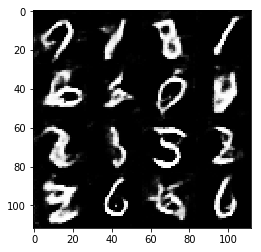

Epoch 3/8... Discriminator Loss: 1.3119 ... Generator Loss: 1.4820


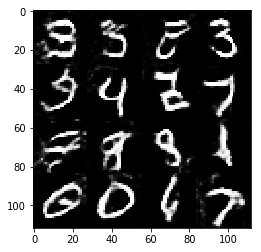

Epoch 4/8... Discriminator Loss: 1.1502 ... Generator Loss: 1.1412
Epoch 4/8... Discriminator Loss: 1.6890 ... Generator Loss: 1.7135
Epoch 4/8... Discriminator Loss: 1.1722 ... Generator Loss: 0.8038
Epoch 4/8... Discriminator Loss: 1.1398 ... Generator Loss: 0.8527
Epoch 4/8... Discriminator Loss: 1.0424 ... Generator Loss: 1.4969
Epoch 4/8... Discriminator Loss: 1.3395 ... Generator Loss: 1.5973
Epoch 4/8... Discriminator Loss: 1.1601 ... Generator Loss: 1.1112
Epoch 4/8... Discriminator Loss: 1.1726 ... Generator Loss: 0.9189
Epoch 4/8... Discriminator Loss: 1.2678 ... Generator Loss: 1.3075


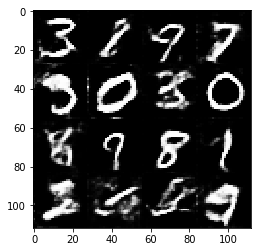

Epoch 4/8... Discriminator Loss: 1.2589 ... Generator Loss: 1.2765
Epoch 4/8... Discriminator Loss: 1.3131 ... Generator Loss: 1.2409
Epoch 4/8... Discriminator Loss: 1.2779 ... Generator Loss: 1.1343
Epoch 4/8... Discriminator Loss: 1.1784 ... Generator Loss: 0.8966
Epoch 4/8... Discriminator Loss: 1.5442 ... Generator Loss: 0.3894
Epoch 4/8... Discriminator Loss: 1.2190 ... Generator Loss: 0.7859
Epoch 4/8... Discriminator Loss: 1.1258 ... Generator Loss: 1.1811
Epoch 4/8... Discriminator Loss: 1.1186 ... Generator Loss: 1.1446
Epoch 4/8... Discriminator Loss: 1.2267 ... Generator Loss: 0.9627
Epoch 4/8... Discriminator Loss: 1.2186 ... Generator Loss: 1.0568


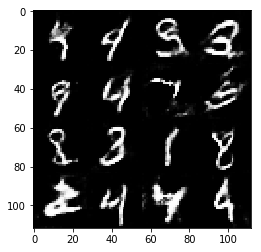

Epoch 4/8... Discriminator Loss: 1.3553 ... Generator Loss: 1.2469
Epoch 4/8... Discriminator Loss: 1.5264 ... Generator Loss: 0.4285
Epoch 4/8... Discriminator Loss: 1.2801 ... Generator Loss: 0.5876
Epoch 4/8... Discriminator Loss: 1.2404 ... Generator Loss: 0.6293
Epoch 4/8... Discriminator Loss: 1.4480 ... Generator Loss: 0.4891
Epoch 4/8... Discriminator Loss: 1.2152 ... Generator Loss: 0.7155
Epoch 4/8... Discriminator Loss: 1.8117 ... Generator Loss: 1.5099
Epoch 4/8... Discriminator Loss: 1.1986 ... Generator Loss: 1.0275
Epoch 4/8... Discriminator Loss: 1.1745 ... Generator Loss: 0.8079
Epoch 4/8... Discriminator Loss: 1.2518 ... Generator Loss: 0.7951


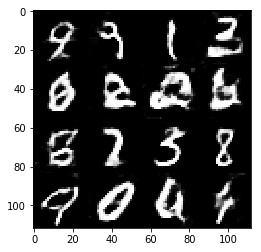

Epoch 4/8... Discriminator Loss: 1.2296 ... Generator Loss: 0.9791
Epoch 4/8... Discriminator Loss: 1.2033 ... Generator Loss: 0.9078
Epoch 4/8... Discriminator Loss: 1.5682 ... Generator Loss: 0.4124
Epoch 4/8... Discriminator Loss: 1.3757 ... Generator Loss: 0.6761
Epoch 4/8... Discriminator Loss: 1.1630 ... Generator Loss: 0.7704
Epoch 4/8... Discriminator Loss: 1.0764 ... Generator Loss: 0.9174
Epoch 4/8... Discriminator Loss: 1.2560 ... Generator Loss: 1.2118
Epoch 4/8... Discriminator Loss: 1.2388 ... Generator Loss: 1.2725
Epoch 4/8... Discriminator Loss: 1.5281 ... Generator Loss: 0.4831
Epoch 4/8... Discriminator Loss: 1.3716 ... Generator Loss: 0.5047


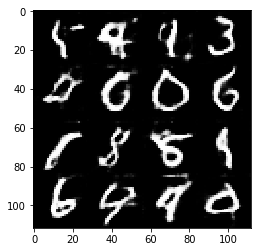

Epoch 4/8... Discriminator Loss: 1.1169 ... Generator Loss: 0.8271
Epoch 4/8... Discriminator Loss: 1.7122 ... Generator Loss: 0.4142
Epoch 4/8... Discriminator Loss: 1.2890 ... Generator Loss: 0.6289
Epoch 4/8... Discriminator Loss: 1.5166 ... Generator Loss: 0.4414
Epoch 4/8... Discriminator Loss: 1.1425 ... Generator Loss: 1.0012
Epoch 4/8... Discriminator Loss: 1.6302 ... Generator Loss: 1.3485
Epoch 4/8... Discriminator Loss: 1.3433 ... Generator Loss: 0.7122
Epoch 4/8... Discriminator Loss: 1.2530 ... Generator Loss: 1.1140
Epoch 4/8... Discriminator Loss: 1.2117 ... Generator Loss: 0.6581
Epoch 4/8... Discriminator Loss: 1.4003 ... Generator Loss: 0.4799


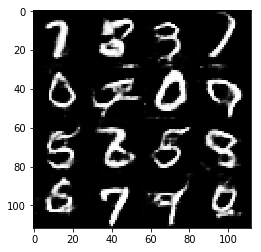

Epoch 4/8... Discriminator Loss: 1.1804 ... Generator Loss: 0.6651
Epoch 4/8... Discriminator Loss: 1.3925 ... Generator Loss: 0.5433
Epoch 4/8... Discriminator Loss: 1.4609 ... Generator Loss: 0.4164
Epoch 4/8... Discriminator Loss: 1.3875 ... Generator Loss: 0.4968
Epoch 4/8... Discriminator Loss: 1.2224 ... Generator Loss: 0.6143
Epoch 4/8... Discriminator Loss: 1.4877 ... Generator Loss: 0.4960
Epoch 4/8... Discriminator Loss: 1.2227 ... Generator Loss: 0.6328
Epoch 4/8... Discriminator Loss: 1.4117 ... Generator Loss: 1.2345
Epoch 4/8... Discriminator Loss: 1.0970 ... Generator Loss: 1.1017
Epoch 4/8... Discriminator Loss: 1.1263 ... Generator Loss: 1.0583


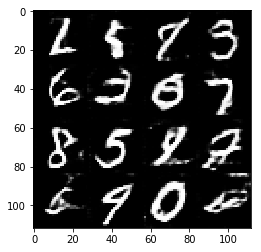

Epoch 4/8... Discriminator Loss: 1.5484 ... Generator Loss: 1.5369
Epoch 4/8... Discriminator Loss: 1.3559 ... Generator Loss: 0.7279
Epoch 4/8... Discriminator Loss: 1.1714 ... Generator Loss: 0.7394
Epoch 4/8... Discriminator Loss: 0.9523 ... Generator Loss: 0.9240
Epoch 4/8... Discriminator Loss: 1.2280 ... Generator Loss: 1.3203
Epoch 4/8... Discriminator Loss: 1.1233 ... Generator Loss: 0.9409
Epoch 4/8... Discriminator Loss: 1.5920 ... Generator Loss: 1.5399
Epoch 4/8... Discriminator Loss: 1.1495 ... Generator Loss: 0.8709
Epoch 4/8... Discriminator Loss: 1.2367 ... Generator Loss: 0.8197
Epoch 4/8... Discriminator Loss: 1.3387 ... Generator Loss: 1.1755


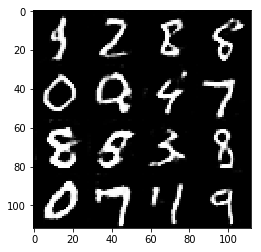

Epoch 4/8... Discriminator Loss: 1.2399 ... Generator Loss: 0.8395
Epoch 4/8... Discriminator Loss: 1.2374 ... Generator Loss: 0.9357
Epoch 4/8... Discriminator Loss: 1.2024 ... Generator Loss: 1.0024
Epoch 4/8... Discriminator Loss: 1.1651 ... Generator Loss: 1.0052
Epoch 4/8... Discriminator Loss: 1.6015 ... Generator Loss: 0.4553
Epoch 4/8... Discriminator Loss: 0.9540 ... Generator Loss: 0.9616
Epoch 4/8... Discriminator Loss: 1.2749 ... Generator Loss: 0.7018
Epoch 4/8... Discriminator Loss: 1.0656 ... Generator Loss: 1.1917
Epoch 4/8... Discriminator Loss: 1.4707 ... Generator Loss: 1.3228
Epoch 4/8... Discriminator Loss: 1.3645 ... Generator Loss: 0.7056


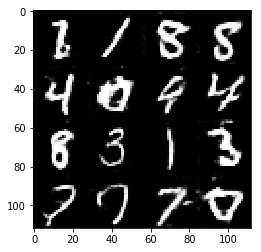

Epoch 4/8... Discriminator Loss: 1.4833 ... Generator Loss: 1.3923
Epoch 4/8... Discriminator Loss: 1.3026 ... Generator Loss: 1.0715
Epoch 4/8... Discriminator Loss: 1.1922 ... Generator Loss: 1.0278
Epoch 4/8... Discriminator Loss: 1.2737 ... Generator Loss: 0.6425
Epoch 4/8... Discriminator Loss: 1.4995 ... Generator Loss: 1.3019
Epoch 4/8... Discriminator Loss: 1.2748 ... Generator Loss: 0.5541
Epoch 4/8... Discriminator Loss: 1.1583 ... Generator Loss: 0.7666
Epoch 4/8... Discriminator Loss: 1.3215 ... Generator Loss: 1.0187
Epoch 4/8... Discriminator Loss: 1.1048 ... Generator Loss: 1.5078
Epoch 4/8... Discriminator Loss: 1.2308 ... Generator Loss: 0.7051


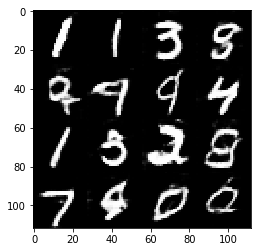

Epoch 4/8... Discriminator Loss: 1.2462 ... Generator Loss: 0.5815
Epoch 4/8... Discriminator Loss: 1.1238 ... Generator Loss: 0.8513
Epoch 4/8... Discriminator Loss: 1.2064 ... Generator Loss: 0.8281
Epoch 4/8... Discriminator Loss: 1.3806 ... Generator Loss: 0.4647


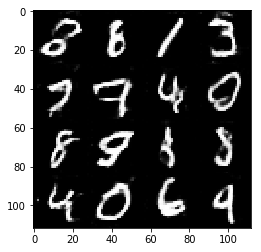

Epoch 5/8... Discriminator Loss: 1.4366 ... Generator Loss: 0.5231
Epoch 5/8... Discriminator Loss: 1.2712 ... Generator Loss: 0.5816
Epoch 5/8... Discriminator Loss: 1.2953 ... Generator Loss: 0.6747
Epoch 5/8... Discriminator Loss: 1.1751 ... Generator Loss: 0.7003
Epoch 5/8... Discriminator Loss: 1.2152 ... Generator Loss: 0.8204
Epoch 5/8... Discriminator Loss: 1.0484 ... Generator Loss: 1.1661


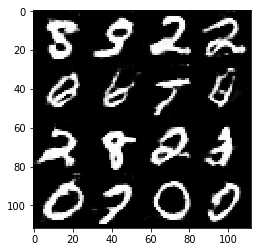

Epoch 5/8... Discriminator Loss: 1.2217 ... Generator Loss: 1.1179
Epoch 5/8... Discriminator Loss: 1.2621 ... Generator Loss: 1.0731
Epoch 5/8... Discriminator Loss: 1.1186 ... Generator Loss: 0.7041
Epoch 5/8... Discriminator Loss: 1.2781 ... Generator Loss: 1.0713
Epoch 5/8... Discriminator Loss: 1.2102 ... Generator Loss: 1.0608
Epoch 5/8... Discriminator Loss: 1.3048 ... Generator Loss: 1.0381
Epoch 5/8... Discriminator Loss: 1.3406 ... Generator Loss: 1.2594
Epoch 5/8... Discriminator Loss: 1.2010 ... Generator Loss: 0.8983
Epoch 5/8... Discriminator Loss: 1.3863 ... Generator Loss: 1.2871
Epoch 5/8... Discriminator Loss: 1.2460 ... Generator Loss: 0.6057


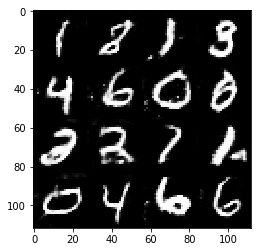

Epoch 5/8... Discriminator Loss: 1.6897 ... Generator Loss: 0.3959
Epoch 5/8... Discriminator Loss: 1.3444 ... Generator Loss: 0.5513
Epoch 5/8... Discriminator Loss: 1.1872 ... Generator Loss: 0.7573
Epoch 5/8... Discriminator Loss: 1.1697 ... Generator Loss: 1.0274
Epoch 5/8... Discriminator Loss: 1.1872 ... Generator Loss: 0.7207
Epoch 5/8... Discriminator Loss: 1.2666 ... Generator Loss: 0.7561
Epoch 5/8... Discriminator Loss: 1.2239 ... Generator Loss: 0.6633
Epoch 5/8... Discriminator Loss: 0.9432 ... Generator Loss: 1.0411
Epoch 5/8... Discriminator Loss: 1.1731 ... Generator Loss: 0.7605
Epoch 5/8... Discriminator Loss: 1.6116 ... Generator Loss: 0.4135


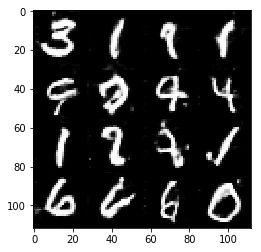

Epoch 5/8... Discriminator Loss: 1.1892 ... Generator Loss: 0.9080
Epoch 5/8... Discriminator Loss: 1.1965 ... Generator Loss: 1.1118
Epoch 5/8... Discriminator Loss: 1.2122 ... Generator Loss: 0.9004
Epoch 5/8... Discriminator Loss: 1.2014 ... Generator Loss: 1.2500
Epoch 5/8... Discriminator Loss: 1.3130 ... Generator Loss: 0.6711
Epoch 5/8... Discriminator Loss: 1.3780 ... Generator Loss: 0.5823
Epoch 5/8... Discriminator Loss: 1.5340 ... Generator Loss: 0.4460
Epoch 5/8... Discriminator Loss: 1.2795 ... Generator Loss: 0.5216
Epoch 5/8... Discriminator Loss: 1.1894 ... Generator Loss: 0.6220
Epoch 5/8... Discriminator Loss: 1.4406 ... Generator Loss: 0.6172


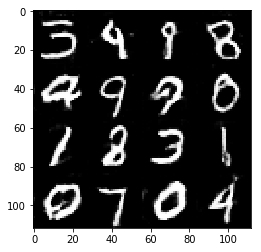

Epoch 5/8... Discriminator Loss: 0.9947 ... Generator Loss: 0.8451
Epoch 5/8... Discriminator Loss: 1.2082 ... Generator Loss: 0.6331
Epoch 5/8... Discriminator Loss: 1.1714 ... Generator Loss: 0.7217
Epoch 5/8... Discriminator Loss: 1.3236 ... Generator Loss: 0.5446
Epoch 5/8... Discriminator Loss: 1.4838 ... Generator Loss: 0.4700
Epoch 5/8... Discriminator Loss: 1.2756 ... Generator Loss: 0.7394
Epoch 5/8... Discriminator Loss: 1.2819 ... Generator Loss: 0.7691
Epoch 5/8... Discriminator Loss: 1.2363 ... Generator Loss: 0.5342
Epoch 5/8... Discriminator Loss: 1.3361 ... Generator Loss: 0.5604
Epoch 5/8... Discriminator Loss: 1.4377 ... Generator Loss: 0.5246


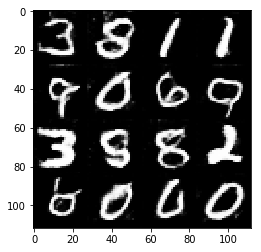

Epoch 5/8... Discriminator Loss: 1.2511 ... Generator Loss: 0.6819
Epoch 5/8... Discriminator Loss: 1.2564 ... Generator Loss: 0.8868
Epoch 5/8... Discriminator Loss: 1.2751 ... Generator Loss: 0.5477
Epoch 5/8... Discriminator Loss: 1.2159 ... Generator Loss: 0.6743
Epoch 5/8... Discriminator Loss: 1.1756 ... Generator Loss: 1.1426
Epoch 5/8... Discriminator Loss: 1.3544 ... Generator Loss: 0.9907
Epoch 5/8... Discriminator Loss: 1.3027 ... Generator Loss: 1.1051
Epoch 5/8... Discriminator Loss: 1.1042 ... Generator Loss: 0.9949
Epoch 5/8... Discriminator Loss: 1.2507 ... Generator Loss: 0.8332
Epoch 5/8... Discriminator Loss: 1.1941 ... Generator Loss: 0.6055


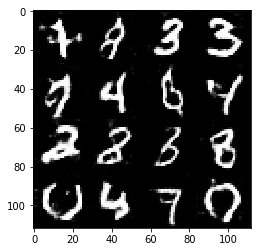

Epoch 5/8... Discriminator Loss: 1.3736 ... Generator Loss: 1.4771
Epoch 5/8... Discriminator Loss: 1.2615 ... Generator Loss: 0.8940
Epoch 5/8... Discriminator Loss: 1.3923 ... Generator Loss: 1.2816
Epoch 5/8... Discriminator Loss: 1.2797 ... Generator Loss: 0.9811
Epoch 5/8... Discriminator Loss: 1.2925 ... Generator Loss: 1.2546
Epoch 5/8... Discriminator Loss: 1.3814 ... Generator Loss: 1.1272
Epoch 5/8... Discriminator Loss: 1.0931 ... Generator Loss: 0.9525
Epoch 5/8... Discriminator Loss: 1.1834 ... Generator Loss: 0.6291
Epoch 5/8... Discriminator Loss: 1.0533 ... Generator Loss: 0.6691
Epoch 5/8... Discriminator Loss: 1.3634 ... Generator Loss: 0.7547


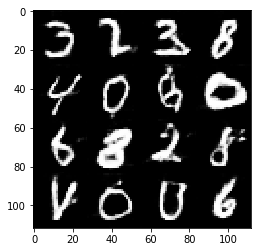

Epoch 5/8... Discriminator Loss: 1.2918 ... Generator Loss: 0.9005
Epoch 5/8... Discriminator Loss: 1.3764 ... Generator Loss: 1.0091
Epoch 5/8... Discriminator Loss: 1.1196 ... Generator Loss: 1.0220
Epoch 5/8... Discriminator Loss: 1.5902 ... Generator Loss: 0.4249
Epoch 5/8... Discriminator Loss: 1.4216 ... Generator Loss: 0.9160
Epoch 5/8... Discriminator Loss: 1.2168 ... Generator Loss: 0.8788
Epoch 5/8... Discriminator Loss: 1.1536 ... Generator Loss: 0.9077
Epoch 5/8... Discriminator Loss: 1.1502 ... Generator Loss: 0.9279
Epoch 5/8... Discriminator Loss: 1.2179 ... Generator Loss: 0.6822
Epoch 5/8... Discriminator Loss: 1.7150 ... Generator Loss: 0.3771


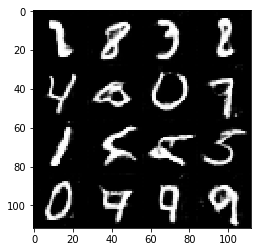

Epoch 5/8... Discriminator Loss: 1.4029 ... Generator Loss: 0.5623
Epoch 5/8... Discriminator Loss: 1.2607 ... Generator Loss: 1.1892
Epoch 5/8... Discriminator Loss: 1.3101 ... Generator Loss: 0.7929
Epoch 5/8... Discriminator Loss: 1.5726 ... Generator Loss: 0.4310
Epoch 5/8... Discriminator Loss: 1.4243 ... Generator Loss: 0.5282
Epoch 5/8... Discriminator Loss: 1.0969 ... Generator Loss: 0.7990
Epoch 5/8... Discriminator Loss: 1.5828 ... Generator Loss: 0.4334
Epoch 5/8... Discriminator Loss: 1.1897 ... Generator Loss: 0.9897
Epoch 5/8... Discriminator Loss: 1.1340 ... Generator Loss: 0.6872
Epoch 5/8... Discriminator Loss: 1.0558 ... Generator Loss: 0.7988


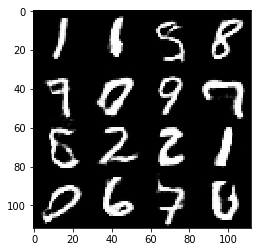

Epoch 5/8... Discriminator Loss: 1.2493 ... Generator Loss: 0.6968
Epoch 5/8... Discriminator Loss: 1.1565 ... Generator Loss: 0.6860
Epoch 5/8... Discriminator Loss: 1.4733 ... Generator Loss: 0.4512
Epoch 5/8... Discriminator Loss: 1.3229 ... Generator Loss: 0.6271
Epoch 5/8... Discriminator Loss: 1.2235 ... Generator Loss: 1.1783
Epoch 5/8... Discriminator Loss: 1.3280 ... Generator Loss: 1.2800
Epoch 5/8... Discriminator Loss: 1.2012 ... Generator Loss: 0.6470
Epoch 5/8... Discriminator Loss: 1.2005 ... Generator Loss: 0.6636


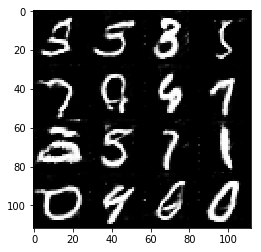

Epoch 6/8... Discriminator Loss: 1.2385 ... Generator Loss: 0.7124
Epoch 6/8... Discriminator Loss: 1.2681 ... Generator Loss: 1.0211


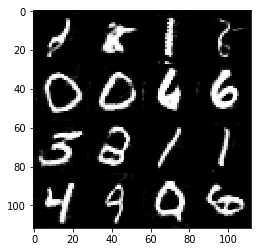

Epoch 6/8... Discriminator Loss: 1.1466 ... Generator Loss: 1.2886
Epoch 6/8... Discriminator Loss: 1.0143 ... Generator Loss: 0.9447
Epoch 6/8... Discriminator Loss: 1.3547 ... Generator Loss: 0.6447
Epoch 6/8... Discriminator Loss: 1.2368 ... Generator Loss: 0.5822
Epoch 6/8... Discriminator Loss: 1.6599 ... Generator Loss: 0.3537
Epoch 6/8... Discriminator Loss: 1.2975 ... Generator Loss: 0.6310
Epoch 6/8... Discriminator Loss: 1.3787 ... Generator Loss: 0.4811
Epoch 6/8... Discriminator Loss: 1.0802 ... Generator Loss: 0.9129
Epoch 6/8... Discriminator Loss: 0.9820 ... Generator Loss: 1.4230
Epoch 6/8... Discriminator Loss: 1.3880 ... Generator Loss: 0.4853


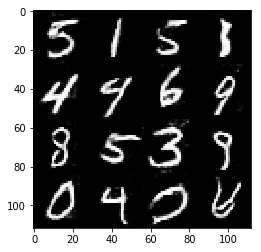

Epoch 6/8... Discriminator Loss: 1.2332 ... Generator Loss: 1.2184
Epoch 6/8... Discriminator Loss: 1.2247 ... Generator Loss: 1.1610
Epoch 6/8... Discriminator Loss: 1.1277 ... Generator Loss: 0.6920
Epoch 6/8... Discriminator Loss: 1.6131 ... Generator Loss: 0.4301
Epoch 6/8... Discriminator Loss: 1.2641 ... Generator Loss: 0.8126
Epoch 6/8... Discriminator Loss: 1.1697 ... Generator Loss: 0.8524
Epoch 6/8... Discriminator Loss: 1.0872 ... Generator Loss: 0.8573
Epoch 6/8... Discriminator Loss: 1.0318 ... Generator Loss: 0.9069
Epoch 6/8... Discriminator Loss: 1.5205 ... Generator Loss: 0.4045
Epoch 6/8... Discriminator Loss: 1.1377 ... Generator Loss: 0.7174


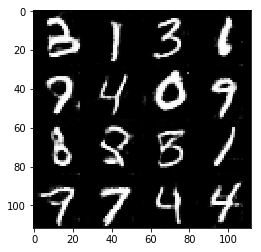

Epoch 6/8... Discriminator Loss: 1.1165 ... Generator Loss: 0.9112
Epoch 6/8... Discriminator Loss: 1.3986 ... Generator Loss: 1.3395
Epoch 6/8... Discriminator Loss: 1.4551 ... Generator Loss: 0.5093
Epoch 6/8... Discriminator Loss: 1.3105 ... Generator Loss: 0.7403
Epoch 6/8... Discriminator Loss: 1.1877 ... Generator Loss: 0.6586
Epoch 6/8... Discriminator Loss: 1.1912 ... Generator Loss: 0.6460
Epoch 6/8... Discriminator Loss: 1.0860 ... Generator Loss: 0.9499
Epoch 6/8... Discriminator Loss: 1.3384 ... Generator Loss: 1.3845
Epoch 6/8... Discriminator Loss: 1.1494 ... Generator Loss: 0.6701
Epoch 6/8... Discriminator Loss: 1.2713 ... Generator Loss: 0.5612


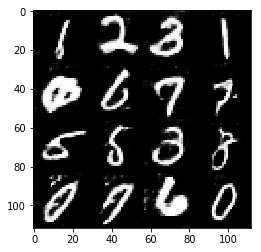

Epoch 6/8... Discriminator Loss: 1.3979 ... Generator Loss: 0.4712
Epoch 6/8... Discriminator Loss: 1.2881 ... Generator Loss: 0.5889
Epoch 6/8... Discriminator Loss: 1.3862 ... Generator Loss: 0.4854
Epoch 6/8... Discriminator Loss: 1.2788 ... Generator Loss: 1.0097
Epoch 6/8... Discriminator Loss: 1.2712 ... Generator Loss: 0.9141
Epoch 6/8... Discriminator Loss: 1.3351 ... Generator Loss: 0.8896
Epoch 6/8... Discriminator Loss: 1.5734 ... Generator Loss: 0.4396
Epoch 6/8... Discriminator Loss: 1.3127 ... Generator Loss: 0.5468
Epoch 6/8... Discriminator Loss: 1.1003 ... Generator Loss: 0.9407
Epoch 6/8... Discriminator Loss: 1.2067 ... Generator Loss: 0.9235


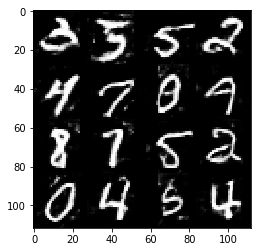

Epoch 6/8... Discriminator Loss: 1.2483 ... Generator Loss: 1.1859
Epoch 6/8... Discriminator Loss: 1.0879 ... Generator Loss: 0.8970
Epoch 6/8... Discriminator Loss: 1.3648 ... Generator Loss: 1.4159
Epoch 6/8... Discriminator Loss: 1.1268 ... Generator Loss: 1.2666
Epoch 6/8... Discriminator Loss: 1.2986 ... Generator Loss: 0.6423
Epoch 6/8... Discriminator Loss: 1.3408 ... Generator Loss: 1.2596
Epoch 6/8... Discriminator Loss: 1.3637 ... Generator Loss: 1.6649
Epoch 6/8... Discriminator Loss: 1.4277 ... Generator Loss: 1.0750
Epoch 6/8... Discriminator Loss: 1.2165 ... Generator Loss: 0.8084
Epoch 6/8... Discriminator Loss: 1.3813 ... Generator Loss: 1.2474


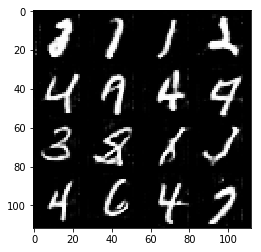

Epoch 6/8... Discriminator Loss: 1.2197 ... Generator Loss: 0.8890
Epoch 6/8... Discriminator Loss: 1.4204 ... Generator Loss: 1.2994
Epoch 6/8... Discriminator Loss: 1.3216 ... Generator Loss: 1.2150
Epoch 6/8... Discriminator Loss: 1.1818 ... Generator Loss: 0.7501
Epoch 6/8... Discriminator Loss: 1.3448 ... Generator Loss: 0.5555
Epoch 6/8... Discriminator Loss: 1.2754 ... Generator Loss: 0.8050
Epoch 6/8... Discriminator Loss: 1.3325 ... Generator Loss: 0.5680
Epoch 6/8... Discriminator Loss: 1.9495 ... Generator Loss: 0.2851
Epoch 6/8... Discriminator Loss: 1.2754 ... Generator Loss: 0.6191
Epoch 6/8... Discriminator Loss: 1.1936 ... Generator Loss: 0.8550


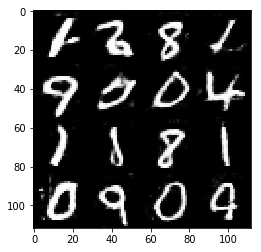

Epoch 6/8... Discriminator Loss: 1.2569 ... Generator Loss: 0.6349
Epoch 6/8... Discriminator Loss: 1.2094 ... Generator Loss: 1.0126
Epoch 6/8... Discriminator Loss: 1.2775 ... Generator Loss: 1.1297
Epoch 6/8... Discriminator Loss: 1.2564 ... Generator Loss: 0.5533
Epoch 6/8... Discriminator Loss: 1.2036 ... Generator Loss: 0.7822
Epoch 6/8... Discriminator Loss: 1.1014 ... Generator Loss: 1.2145
Epoch 6/8... Discriminator Loss: 1.5955 ... Generator Loss: 1.2472
Epoch 6/8... Discriminator Loss: 1.2400 ... Generator Loss: 0.8691
Epoch 6/8... Discriminator Loss: 1.1632 ... Generator Loss: 0.6548
Epoch 6/8... Discriminator Loss: 1.3281 ... Generator Loss: 0.5325


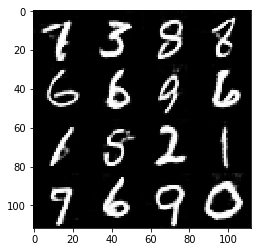

Epoch 6/8... Discriminator Loss: 1.3097 ... Generator Loss: 0.6630
Epoch 6/8... Discriminator Loss: 1.1493 ... Generator Loss: 1.0443
Epoch 6/8... Discriminator Loss: 1.1144 ... Generator Loss: 1.1234
Epoch 6/8... Discriminator Loss: 1.2112 ... Generator Loss: 1.1268
Epoch 6/8... Discriminator Loss: 1.5007 ... Generator Loss: 0.4330
Epoch 6/8... Discriminator Loss: 1.3934 ... Generator Loss: 0.5469
Epoch 6/8... Discriminator Loss: 1.2805 ... Generator Loss: 0.8942
Epoch 6/8... Discriminator Loss: 1.3769 ... Generator Loss: 1.1771
Epoch 6/8... Discriminator Loss: 1.3433 ... Generator Loss: 0.4827
Epoch 6/8... Discriminator Loss: 1.4165 ... Generator Loss: 0.5378


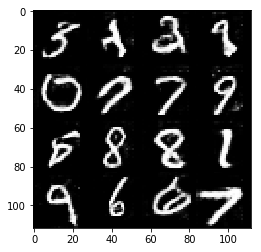

Epoch 6/8... Discriminator Loss: 1.2104 ... Generator Loss: 0.8821
Epoch 6/8... Discriminator Loss: 1.2350 ... Generator Loss: 1.3144
Epoch 6/8... Discriminator Loss: 1.1399 ... Generator Loss: 0.6883
Epoch 6/8... Discriminator Loss: 1.1569 ... Generator Loss: 0.7619
Epoch 6/8... Discriminator Loss: 1.3433 ... Generator Loss: 0.5189
Epoch 6/8... Discriminator Loss: 1.2659 ... Generator Loss: 1.0617
Epoch 6/8... Discriminator Loss: 1.2478 ... Generator Loss: 0.7870
Epoch 6/8... Discriminator Loss: 1.1850 ... Generator Loss: 0.8219
Epoch 6/8... Discriminator Loss: 1.3592 ... Generator Loss: 1.1762
Epoch 6/8... Discriminator Loss: 1.2831 ... Generator Loss: 0.8837


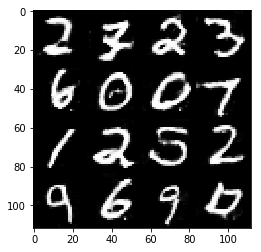

Epoch 6/8... Discriminator Loss: 1.2919 ... Generator Loss: 1.0438
Epoch 6/8... Discriminator Loss: 1.3836 ... Generator Loss: 1.0911
Epoch 7/8... Discriminator Loss: 1.5135 ... Generator Loss: 0.4711
Epoch 7/8... Discriminator Loss: 1.1179 ... Generator Loss: 0.6737
Epoch 7/8... Discriminator Loss: 1.2632 ... Generator Loss: 0.5567
Epoch 7/8... Discriminator Loss: 0.9958 ... Generator Loss: 0.7726
Epoch 7/8... Discriminator Loss: 1.2118 ... Generator Loss: 0.7489
Epoch 7/8... Discriminator Loss: 1.1225 ... Generator Loss: 0.8707
Epoch 7/8... Discriminator Loss: 1.2833 ... Generator Loss: 0.5354
Epoch 7/8... Discriminator Loss: 1.1081 ... Generator Loss: 0.9850
Epoch 7/8... Discriminator Loss: 1.2801 ... Generator Loss: 0.8073
Epoch 7/8... Discriminator Loss: 1.0584 ... Generator Loss: 0.9671


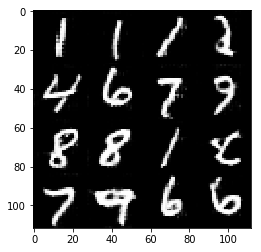

Epoch 7/8... Discriminator Loss: 1.1950 ... Generator Loss: 0.7634
Epoch 7/8... Discriminator Loss: 1.1435 ... Generator Loss: 0.7177
Epoch 7/8... Discriminator Loss: 1.5791 ... Generator Loss: 0.4264
Epoch 7/8... Discriminator Loss: 1.1862 ... Generator Loss: 0.6700
Epoch 7/8... Discriminator Loss: 1.4369 ... Generator Loss: 0.4622
Epoch 7/8... Discriminator Loss: 1.3871 ... Generator Loss: 0.5291
Epoch 7/8... Discriminator Loss: 1.3381 ... Generator Loss: 1.0477
Epoch 7/8... Discriminator Loss: 1.2956 ... Generator Loss: 1.2093
Epoch 7/8... Discriminator Loss: 1.2667 ... Generator Loss: 0.5700
Epoch 7/8... Discriminator Loss: 1.2194 ... Generator Loss: 1.2077


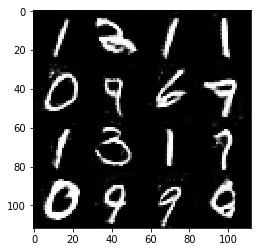

Epoch 7/8... Discriminator Loss: 1.3701 ... Generator Loss: 1.3535
Epoch 7/8... Discriminator Loss: 1.2990 ... Generator Loss: 0.5266
Epoch 7/8... Discriminator Loss: 1.5612 ... Generator Loss: 0.4481
Epoch 7/8... Discriminator Loss: 1.4527 ... Generator Loss: 0.4956
Epoch 7/8... Discriminator Loss: 1.0957 ... Generator Loss: 1.0887
Epoch 7/8... Discriminator Loss: 1.3987 ... Generator Loss: 0.4678
Epoch 7/8... Discriminator Loss: 1.1542 ... Generator Loss: 0.7355
Epoch 7/8... Discriminator Loss: 1.2418 ... Generator Loss: 0.6173
Epoch 7/8... Discriminator Loss: 2.0352 ... Generator Loss: 0.3200
Epoch 7/8... Discriminator Loss: 1.2472 ... Generator Loss: 0.6465


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.05


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 8

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/8... Discriminator Loss: 0.2743 ... Generator Loss: 3.6422
Epoch 1/8... Discriminator Loss: 0.3551 ... Generator Loss: 6.7380
Epoch 1/8... Discriminator Loss: 0.3220 ... Generator Loss: 9.8115
Epoch 1/8... Discriminator Loss: 0.9116 ... Generator Loss: 2.1331
Epoch 1/8... Discriminator Loss: 1.4694 ... Generator Loss: 1.3638
Epoch 1/8... Discriminator Loss: 1.2831 ... Generator Loss: 1.1690
Epoch 1/8... Discriminator Loss: 0.7044 ... Generator Loss: 2.7869
Epoch 1/8... Discriminator Loss: 0.7072 ... Generator Loss: 4.1196
Epoch 1/8... Discriminator Loss: 0.7149 ... Generator Loss: 3.3679
Epoch 1/8... Discriminator Loss: 2.7974 ... Generator Loss: 0.2220


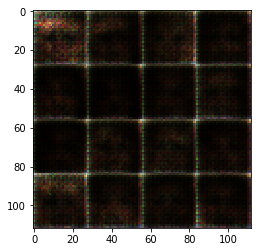

Epoch 1/8... Discriminator Loss: 0.3756 ... Generator Loss: 4.2030
Epoch 1/8... Discriminator Loss: 4.9967 ... Generator Loss: 11.0621
Epoch 1/8... Discriminator Loss: 0.3758 ... Generator Loss: 2.8961
Epoch 1/8... Discriminator Loss: 0.5434 ... Generator Loss: 2.0077
Epoch 1/8... Discriminator Loss: 3.0254 ... Generator Loss: 0.2444
Epoch 1/8... Discriminator Loss: 0.3919 ... Generator Loss: 2.4132
Epoch 1/8... Discriminator Loss: 0.7375 ... Generator Loss: 1.4598
Epoch 1/8... Discriminator Loss: 0.9732 ... Generator Loss: 0.8577
Epoch 1/8... Discriminator Loss: 0.3284 ... Generator Loss: 3.2801
Epoch 1/8... Discriminator Loss: 1.4966 ... Generator Loss: 0.6261


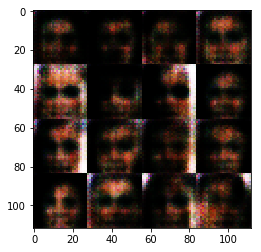

Epoch 1/8... Discriminator Loss: 1.8250 ... Generator Loss: 0.4080
Epoch 1/8... Discriminator Loss: 0.5460 ... Generator Loss: 1.5805
Epoch 1/8... Discriminator Loss: 0.9186 ... Generator Loss: 2.6336
Epoch 1/8... Discriminator Loss: 0.4992 ... Generator Loss: 3.6296
Epoch 1/8... Discriminator Loss: 1.1177 ... Generator Loss: 3.8102
Epoch 1/8... Discriminator Loss: 1.0236 ... Generator Loss: 0.8348
Epoch 1/8... Discriminator Loss: 0.8814 ... Generator Loss: 1.0303
Epoch 1/8... Discriminator Loss: 0.4918 ... Generator Loss: 2.4771
Epoch 1/8... Discriminator Loss: 0.3961 ... Generator Loss: 2.6418
Epoch 1/8... Discriminator Loss: 0.4743 ... Generator Loss: 2.9126


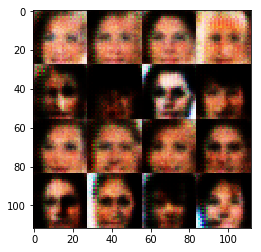

Epoch 1/8... Discriminator Loss: 1.4038 ... Generator Loss: 3.7283
Epoch 1/8... Discriminator Loss: 1.1801 ... Generator Loss: 0.6173
Epoch 1/8... Discriminator Loss: 1.3305 ... Generator Loss: 0.6506
Epoch 1/8... Discriminator Loss: 0.5173 ... Generator Loss: 2.0733
Epoch 1/8... Discriminator Loss: 0.7432 ... Generator Loss: 1.1608
Epoch 1/8... Discriminator Loss: 0.7512 ... Generator Loss: 1.1166
Epoch 1/8... Discriminator Loss: 0.3439 ... Generator Loss: 3.2095
Epoch 1/8... Discriminator Loss: 0.8115 ... Generator Loss: 1.2829
Epoch 1/8... Discriminator Loss: 1.2027 ... Generator Loss: 0.6745
Epoch 1/8... Discriminator Loss: 0.7336 ... Generator Loss: 1.2300


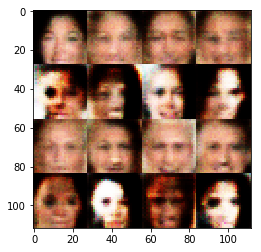

Epoch 1/8... Discriminator Loss: 1.0408 ... Generator Loss: 0.7768
Epoch 1/8... Discriminator Loss: 0.8895 ... Generator Loss: 1.0108
Epoch 1/8... Discriminator Loss: 1.1028 ... Generator Loss: 2.7897
Epoch 1/8... Discriminator Loss: 0.4712 ... Generator Loss: 3.6208
Epoch 1/8... Discriminator Loss: 1.8604 ... Generator Loss: 4.4839
Epoch 1/8... Discriminator Loss: 0.6964 ... Generator Loss: 2.9423
Epoch 1/8... Discriminator Loss: 1.1910 ... Generator Loss: 0.6371
Epoch 1/8... Discriminator Loss: 3.0368 ... Generator Loss: 0.2039
Epoch 1/8... Discriminator Loss: 1.5805 ... Generator Loss: 0.4444
Epoch 1/8... Discriminator Loss: 0.5244 ... Generator Loss: 1.6243


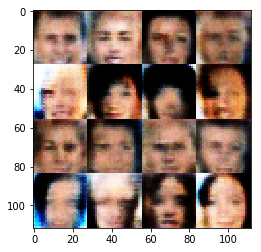

Epoch 1/8... Discriminator Loss: 0.8143 ... Generator Loss: 1.4445
Epoch 1/8... Discriminator Loss: 1.1733 ... Generator Loss: 2.5515
Epoch 1/8... Discriminator Loss: 0.4681 ... Generator Loss: 2.5539
Epoch 1/8... Discriminator Loss: 0.6887 ... Generator Loss: 2.0547
Epoch 1/8... Discriminator Loss: 2.1120 ... Generator Loss: 2.6444
Epoch 1/8... Discriminator Loss: 0.5332 ... Generator Loss: 2.1739
Epoch 1/8... Discriminator Loss: 0.9764 ... Generator Loss: 0.8216
Epoch 1/8... Discriminator Loss: 1.2841 ... Generator Loss: 0.5781
Epoch 1/8... Discriminator Loss: 1.0984 ... Generator Loss: 0.7281
Epoch 1/8... Discriminator Loss: 1.4865 ... Generator Loss: 0.4733


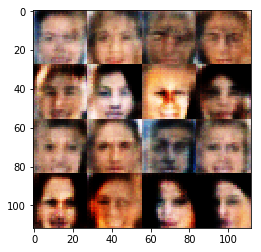

Epoch 1/8... Discriminator Loss: 1.1622 ... Generator Loss: 0.7249
Epoch 1/8... Discriminator Loss: 1.4391 ... Generator Loss: 0.5273
Epoch 1/8... Discriminator Loss: 1.2011 ... Generator Loss: 0.5861
Epoch 1/8... Discriminator Loss: 0.7880 ... Generator Loss: 1.0484
Epoch 1/8... Discriminator Loss: 1.1972 ... Generator Loss: 0.6355
Epoch 1/8... Discriminator Loss: 1.2900 ... Generator Loss: 0.5731
Epoch 1/8... Discriminator Loss: 3.3517 ... Generator Loss: 0.1834
Epoch 1/8... Discriminator Loss: 1.1633 ... Generator Loss: 1.6907
Epoch 1/8... Discriminator Loss: 0.5392 ... Generator Loss: 2.8175
Epoch 1/8... Discriminator Loss: 0.7402 ... Generator Loss: 1.0773


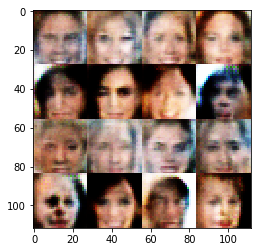

Epoch 1/8... Discriminator Loss: 2.0646 ... Generator Loss: 2.7298
Epoch 1/8... Discriminator Loss: 0.9077 ... Generator Loss: 2.4290
Epoch 1/8... Discriminator Loss: 0.9786 ... Generator Loss: 3.5309
Epoch 1/8... Discriminator Loss: 1.1999 ... Generator Loss: 0.5916
Epoch 1/8... Discriminator Loss: 0.8864 ... Generator Loss: 0.8304
Epoch 1/8... Discriminator Loss: 0.7395 ... Generator Loss: 1.4322
Epoch 1/8... Discriminator Loss: 1.2353 ... Generator Loss: 1.2817
Epoch 1/8... Discriminator Loss: 1.2094 ... Generator Loss: 0.5395
Epoch 1/8... Discriminator Loss: 1.1541 ... Generator Loss: 0.7487
Epoch 1/8... Discriminator Loss: 0.7693 ... Generator Loss: 1.0819


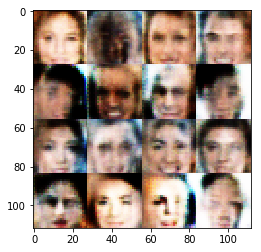

Epoch 1/8... Discriminator Loss: 0.8900 ... Generator Loss: 2.4677
Epoch 1/8... Discriminator Loss: 2.2570 ... Generator Loss: 0.2218
Epoch 1/8... Discriminator Loss: 0.9536 ... Generator Loss: 0.8363
Epoch 1/8... Discriminator Loss: 0.8548 ... Generator Loss: 1.0746
Epoch 1/8... Discriminator Loss: 0.4329 ... Generator Loss: 2.6876
Epoch 1/8... Discriminator Loss: 1.5089 ... Generator Loss: 0.6933
Epoch 1/8... Discriminator Loss: 1.2938 ... Generator Loss: 0.7618
Epoch 1/8... Discriminator Loss: 1.3237 ... Generator Loss: 0.5617
Epoch 1/8... Discriminator Loss: 1.8606 ... Generator Loss: 2.2537
Epoch 1/8... Discriminator Loss: 0.6870 ... Generator Loss: 1.2421


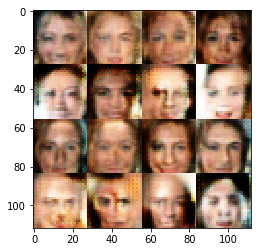

Epoch 1/8... Discriminator Loss: 0.6582 ... Generator Loss: 1.4100
Epoch 1/8... Discriminator Loss: 0.8691 ... Generator Loss: 0.7713
Epoch 1/8... Discriminator Loss: 0.9953 ... Generator Loss: 0.8094
Epoch 1/8... Discriminator Loss: 1.2252 ... Generator Loss: 0.8570
Epoch 1/8... Discriminator Loss: 1.0189 ... Generator Loss: 0.7303
Epoch 1/8... Discriminator Loss: 1.7522 ... Generator Loss: 0.3686
Epoch 1/8... Discriminator Loss: 1.0487 ... Generator Loss: 0.7632
Epoch 1/8... Discriminator Loss: 0.6362 ... Generator Loss: 2.0039
Epoch 1/8... Discriminator Loss: 1.1082 ... Generator Loss: 0.7483
Epoch 1/8... Discriminator Loss: 1.1020 ... Generator Loss: 2.9283


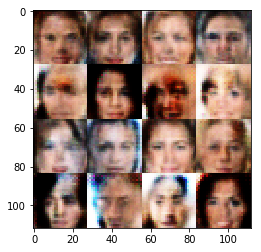

Epoch 1/8... Discriminator Loss: 1.5460 ... Generator Loss: 0.3648
Epoch 1/8... Discriminator Loss: 0.9452 ... Generator Loss: 2.1515
Epoch 1/8... Discriminator Loss: 0.8196 ... Generator Loss: 1.6740
Epoch 1/8... Discriminator Loss: 1.8539 ... Generator Loss: 1.9829
Epoch 1/8... Discriminator Loss: 0.9114 ... Generator Loss: 1.7895
Epoch 1/8... Discriminator Loss: 1.3313 ... Generator Loss: 0.4838
Epoch 1/8... Discriminator Loss: 1.1267 ... Generator Loss: 0.6431
Epoch 1/8... Discriminator Loss: 1.0730 ... Generator Loss: 2.7574
Epoch 1/8... Discriminator Loss: 0.5652 ... Generator Loss: 1.9002
Epoch 1/8... Discriminator Loss: 1.6231 ... Generator Loss: 2.2777


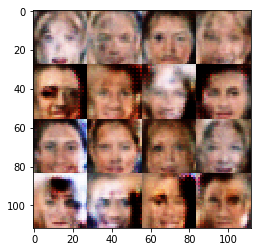

Epoch 1/8... Discriminator Loss: 0.9950 ... Generator Loss: 0.8411
Epoch 1/8... Discriminator Loss: 1.2224 ... Generator Loss: 0.8352
Epoch 1/8... Discriminator Loss: 1.6523 ... Generator Loss: 0.3973
Epoch 1/8... Discriminator Loss: 0.7176 ... Generator Loss: 1.1858
Epoch 1/8... Discriminator Loss: 1.0587 ... Generator Loss: 0.8074
Epoch 1/8... Discriminator Loss: 1.4069 ... Generator Loss: 2.0968
Epoch 1/8... Discriminator Loss: 0.9100 ... Generator Loss: 1.7565
Epoch 1/8... Discriminator Loss: 0.6058 ... Generator Loss: 1.6673
Epoch 1/8... Discriminator Loss: 0.8080 ... Generator Loss: 1.6700
Epoch 1/8... Discriminator Loss: 2.9520 ... Generator Loss: 2.5129


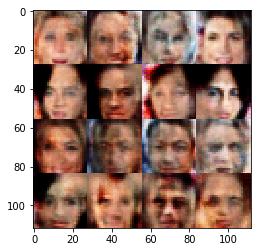

Epoch 1/8... Discriminator Loss: 1.4167 ... Generator Loss: 0.5356
Epoch 1/8... Discriminator Loss: 0.7896 ... Generator Loss: 1.3179
Epoch 1/8... Discriminator Loss: 0.8377 ... Generator Loss: 2.1165
Epoch 1/8... Discriminator Loss: 1.1295 ... Generator Loss: 0.7815
Epoch 1/8... Discriminator Loss: 1.7949 ... Generator Loss: 2.0043
Epoch 1/8... Discriminator Loss: 0.8983 ... Generator Loss: 0.9184
Epoch 1/8... Discriminator Loss: 1.5587 ... Generator Loss: 0.4369
Epoch 1/8... Discriminator Loss: 1.1813 ... Generator Loss: 0.7591
Epoch 1/8... Discriminator Loss: 1.2820 ... Generator Loss: 0.5551
Epoch 1/8... Discriminator Loss: 0.6276 ... Generator Loss: 1.5636


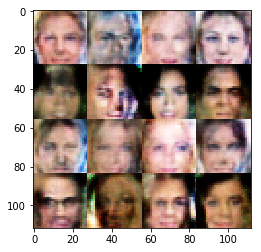

Epoch 1/8... Discriminator Loss: 1.1977 ... Generator Loss: 1.9178
Epoch 1/8... Discriminator Loss: 1.3537 ... Generator Loss: 0.4290
Epoch 1/8... Discriminator Loss: 0.9438 ... Generator Loss: 0.8767
Epoch 1/8... Discriminator Loss: 1.1229 ... Generator Loss: 0.6834
Epoch 1/8... Discriminator Loss: 1.2887 ... Generator Loss: 0.5528
Epoch 1/8... Discriminator Loss: 0.6862 ... Generator Loss: 1.4276
Epoch 1/8... Discriminator Loss: 1.5114 ... Generator Loss: 0.4246
Epoch 1/8... Discriminator Loss: 1.1399 ... Generator Loss: 0.8212
Epoch 1/8... Discriminator Loss: 0.9932 ... Generator Loss: 1.6015
Epoch 1/8... Discriminator Loss: 1.0747 ... Generator Loss: 0.7123


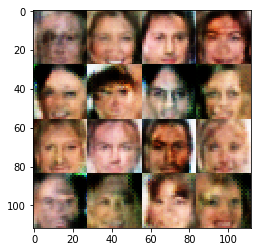

Epoch 1/8... Discriminator Loss: 0.7985 ... Generator Loss: 1.3469
Epoch 1/8... Discriminator Loss: 1.4084 ... Generator Loss: 1.9723
Epoch 1/8... Discriminator Loss: 1.0809 ... Generator Loss: 2.2228
Epoch 1/8... Discriminator Loss: 1.3332 ... Generator Loss: 1.1161
Epoch 1/8... Discriminator Loss: 0.6818 ... Generator Loss: 1.3911
Epoch 1/8... Discriminator Loss: 1.4210 ... Generator Loss: 1.0671
Epoch 1/8... Discriminator Loss: 1.3972 ... Generator Loss: 0.7595
Epoch 1/8... Discriminator Loss: 0.8525 ... Generator Loss: 1.2875
Epoch 1/8... Discriminator Loss: 0.9308 ... Generator Loss: 1.6784
Epoch 1/8... Discriminator Loss: 0.9388 ... Generator Loss: 1.5520


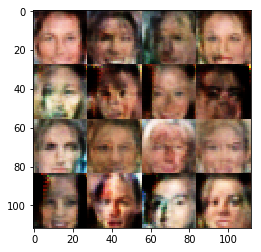

Epoch 1/8... Discriminator Loss: 0.7959 ... Generator Loss: 2.6439
Epoch 1/8... Discriminator Loss: 0.8309 ... Generator Loss: 1.1183
Epoch 1/8... Discriminator Loss: 1.2786 ... Generator Loss: 0.8827
Epoch 1/8... Discriminator Loss: 0.4758 ... Generator Loss: 2.2997
Epoch 1/8... Discriminator Loss: 1.5706 ... Generator Loss: 0.6575
Epoch 1/8... Discriminator Loss: 1.1242 ... Generator Loss: 0.8045
Epoch 1/8... Discriminator Loss: 0.6491 ... Generator Loss: 1.4419
Epoch 1/8... Discriminator Loss: 1.2627 ... Generator Loss: 1.7186
Epoch 1/8... Discriminator Loss: 0.7374 ... Generator Loss: 3.0309
Epoch 1/8... Discriminator Loss: 2.0219 ... Generator Loss: 2.2349


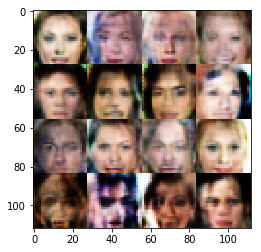

Epoch 1/8... Discriminator Loss: 1.0761 ... Generator Loss: 2.1376
Epoch 1/8... Discriminator Loss: 1.2892 ... Generator Loss: 1.2807
Epoch 1/8... Discriminator Loss: 0.8323 ... Generator Loss: 2.2495
Epoch 1/8... Discriminator Loss: 1.3194 ... Generator Loss: 1.7004
Epoch 1/8... Discriminator Loss: 0.8914 ... Generator Loss: 1.3076
Epoch 1/8... Discriminator Loss: 1.3356 ... Generator Loss: 1.9323
Epoch 1/8... Discriminator Loss: 0.9867 ... Generator Loss: 0.9560
Epoch 1/8... Discriminator Loss: 1.3548 ... Generator Loss: 0.6491
Epoch 1/8... Discriminator Loss: 1.1018 ... Generator Loss: 0.7618
Epoch 1/8... Discriminator Loss: 0.9210 ... Generator Loss: 0.9706


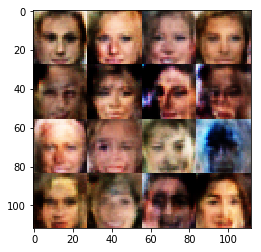

Epoch 1/8... Discriminator Loss: 1.1445 ... Generator Loss: 1.2773
Epoch 1/8... Discriminator Loss: 0.9201 ... Generator Loss: 2.5167
Epoch 1/8... Discriminator Loss: 0.9031 ... Generator Loss: 2.1030
Epoch 1/8... Discriminator Loss: 1.2699 ... Generator Loss: 0.6006
Epoch 1/8... Discriminator Loss: 1.0226 ... Generator Loss: 0.9095
Epoch 1/8... Discriminator Loss: 0.8877 ... Generator Loss: 0.9217
Epoch 1/8... Discriminator Loss: 1.3510 ... Generator Loss: 1.7029
Epoch 1/8... Discriminator Loss: 0.8434 ... Generator Loss: 1.2283
Epoch 1/8... Discriminator Loss: 1.4378 ... Generator Loss: 0.4773
Epoch 1/8... Discriminator Loss: 1.7407 ... Generator Loss: 0.3095


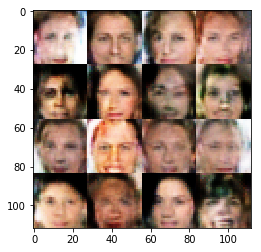

Epoch 1/8... Discriminator Loss: 1.3965 ... Generator Loss: 0.4868
Epoch 1/8... Discriminator Loss: 1.3526 ... Generator Loss: 0.5424
Epoch 1/8... Discriminator Loss: 0.8370 ... Generator Loss: 1.1132
Epoch 1/8... Discriminator Loss: 1.0552 ... Generator Loss: 0.9856
Epoch 1/8... Discriminator Loss: 1.0604 ... Generator Loss: 0.8246
Epoch 1/8... Discriminator Loss: 0.7167 ... Generator Loss: 1.5208
Epoch 1/8... Discriminator Loss: 2.5509 ... Generator Loss: 0.2379
Epoch 1/8... Discriminator Loss: 0.8816 ... Generator Loss: 1.2408
Epoch 1/8... Discriminator Loss: 1.0660 ... Generator Loss: 0.6589
Epoch 1/8... Discriminator Loss: 1.1597 ... Generator Loss: 0.6794


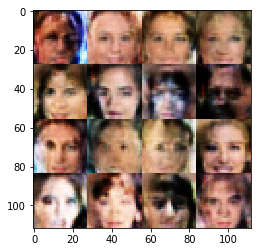

Epoch 1/8... Discriminator Loss: 1.4316 ... Generator Loss: 0.5012
Epoch 1/8... Discriminator Loss: 1.2672 ... Generator Loss: 0.6242
Epoch 1/8... Discriminator Loss: 0.7019 ... Generator Loss: 1.3341
Epoch 1/8... Discriminator Loss: 1.0012 ... Generator Loss: 1.7790
Epoch 1/8... Discriminator Loss: 0.7671 ... Generator Loss: 1.6789
Epoch 1/8... Discriminator Loss: 1.2240 ... Generator Loss: 1.5725
Epoch 1/8... Discriminator Loss: 1.3771 ... Generator Loss: 0.6005
Epoch 1/8... Discriminator Loss: 1.3719 ... Generator Loss: 0.4900
Epoch 1/8... Discriminator Loss: 0.7538 ... Generator Loss: 1.6589
Epoch 1/8... Discriminator Loss: 1.1724 ... Generator Loss: 1.3240


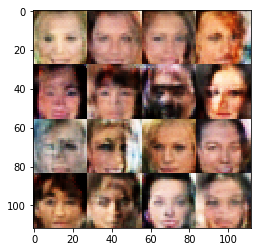

Epoch 1/8... Discriminator Loss: 1.1487 ... Generator Loss: 0.7308
Epoch 1/8... Discriminator Loss: 0.8567 ... Generator Loss: 1.5182
Epoch 1/8... Discriminator Loss: 2.0707 ... Generator Loss: 2.1213
Epoch 1/8... Discriminator Loss: 1.5963 ... Generator Loss: 1.6429
Epoch 1/8... Discriminator Loss: 1.2395 ... Generator Loss: 1.3369
Epoch 1/8... Discriminator Loss: 1.8001 ... Generator Loss: 0.3826
Epoch 1/8... Discriminator Loss: 1.0205 ... Generator Loss: 0.9512
Epoch 1/8... Discriminator Loss: 1.3125 ... Generator Loss: 2.2224
Epoch 1/8... Discriminator Loss: 0.9640 ... Generator Loss: 1.5140
Epoch 1/8... Discriminator Loss: 1.3567 ... Generator Loss: 1.9881


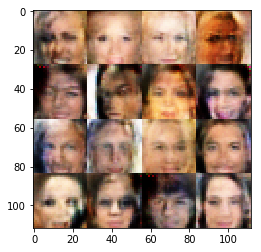

Epoch 1/8... Discriminator Loss: 1.6169 ... Generator Loss: 2.0064
Epoch 1/8... Discriminator Loss: 1.6183 ... Generator Loss: 0.4022
Epoch 1/8... Discriminator Loss: 0.9918 ... Generator Loss: 1.6380
Epoch 1/8... Discriminator Loss: 2.0187 ... Generator Loss: 2.3498
Epoch 1/8... Discriminator Loss: 1.6217 ... Generator Loss: 1.6376
Epoch 1/8... Discriminator Loss: 2.0221 ... Generator Loss: 0.2880
Epoch 1/8... Discriminator Loss: 1.3332 ... Generator Loss: 0.5046
Epoch 1/8... Discriminator Loss: 1.4558 ... Generator Loss: 2.1444
Epoch 1/8... Discriminator Loss: 1.3165 ... Generator Loss: 2.1643
Epoch 1/8... Discriminator Loss: 1.0095 ... Generator Loss: 1.0876


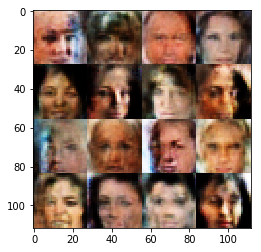

Epoch 1/8... Discriminator Loss: 0.6142 ... Generator Loss: 1.7207
Epoch 1/8... Discriminator Loss: 1.7905 ... Generator Loss: 2.2544
Epoch 1/8... Discriminator Loss: 0.9155 ... Generator Loss: 1.1723
Epoch 1/8... Discriminator Loss: 0.6327 ... Generator Loss: 1.8853
Epoch 1/8... Discriminator Loss: 1.3229 ... Generator Loss: 1.2522
Epoch 1/8... Discriminator Loss: 0.9788 ... Generator Loss: 0.9947
Epoch 1/8... Discriminator Loss: 1.6678 ... Generator Loss: 0.3995
Epoch 1/8... Discriminator Loss: 1.1145 ... Generator Loss: 1.1333
Epoch 1/8... Discriminator Loss: 1.6323 ... Generator Loss: 0.4075
Epoch 1/8... Discriminator Loss: 1.4352 ... Generator Loss: 2.2299


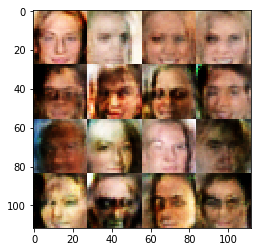

Epoch 1/8... Discriminator Loss: 1.0792 ... Generator Loss: 0.5946
Epoch 1/8... Discriminator Loss: 0.8047 ... Generator Loss: 1.3050
Epoch 1/8... Discriminator Loss: 1.5800 ... Generator Loss: 1.6469
Epoch 1/8... Discriminator Loss: 1.3024 ... Generator Loss: 1.5902
Epoch 1/8... Discriminator Loss: 0.8603 ... Generator Loss: 1.4316
Epoch 1/8... Discriminator Loss: 2.3310 ... Generator Loss: 0.2623
Epoch 1/8... Discriminator Loss: 0.9937 ... Generator Loss: 1.3429
Epoch 1/8... Discriminator Loss: 1.0308 ... Generator Loss: 0.8219
Epoch 1/8... Discriminator Loss: 1.1833 ... Generator Loss: 0.6504
Epoch 1/8... Discriminator Loss: 1.3354 ... Generator Loss: 0.5557


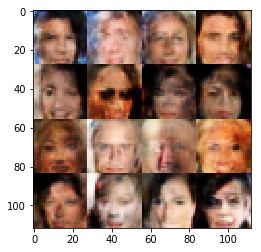

Epoch 1/8... Discriminator Loss: 1.2268 ... Generator Loss: 0.6021
Epoch 1/8... Discriminator Loss: 1.3680 ... Generator Loss: 0.5678
Epoch 1/8... Discriminator Loss: 0.8047 ... Generator Loss: 1.7678
Epoch 1/8... Discriminator Loss: 1.3177 ... Generator Loss: 0.7255
Epoch 1/8... Discriminator Loss: 1.3322 ... Generator Loss: 1.0278
Epoch 1/8... Discriminator Loss: 1.0153 ... Generator Loss: 0.7335
Epoch 1/8... Discriminator Loss: 1.4513 ... Generator Loss: 0.5048
Epoch 1/8... Discriminator Loss: 0.8642 ... Generator Loss: 1.4197
Epoch 1/8... Discriminator Loss: 1.1709 ... Generator Loss: 1.2074
Epoch 1/8... Discriminator Loss: 0.9150 ... Generator Loss: 2.2470


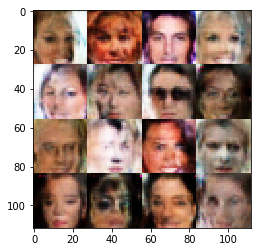

Epoch 1/8... Discriminator Loss: 1.4282 ... Generator Loss: 0.4622
Epoch 1/8... Discriminator Loss: 1.3122 ... Generator Loss: 0.6350
Epoch 1/8... Discriminator Loss: 2.3475 ... Generator Loss: 2.1899
Epoch 1/8... Discriminator Loss: 0.7513 ... Generator Loss: 1.2335
Epoch 1/8... Discriminator Loss: 0.9760 ... Generator Loss: 1.2525
Epoch 1/8... Discriminator Loss: 1.3985 ... Generator Loss: 1.2556
Epoch 1/8... Discriminator Loss: 1.1762 ... Generator Loss: 0.6944
Epoch 1/8... Discriminator Loss: 1.7259 ... Generator Loss: 2.0317
Epoch 1/8... Discriminator Loss: 1.2198 ... Generator Loss: 0.8167
Epoch 1/8... Discriminator Loss: 1.6242 ... Generator Loss: 1.9372


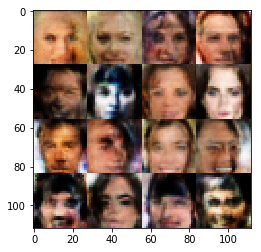

Epoch 1/8... Discriminator Loss: 0.9547 ... Generator Loss: 1.2942
Epoch 1/8... Discriminator Loss: 0.7884 ... Generator Loss: 1.2957
Epoch 1/8... Discriminator Loss: 1.4322 ... Generator Loss: 0.5537
Epoch 1/8... Discriminator Loss: 1.0077 ... Generator Loss: 0.8249
Epoch 1/8... Discriminator Loss: 1.1295 ... Generator Loss: 0.9145
Epoch 1/8... Discriminator Loss: 1.0037 ... Generator Loss: 1.1056
Epoch 1/8... Discriminator Loss: 0.9333 ... Generator Loss: 1.6781
Epoch 1/8... Discriminator Loss: 1.3163 ... Generator Loss: 1.1936
Epoch 1/8... Discriminator Loss: 1.0304 ... Generator Loss: 0.9375
Epoch 1/8... Discriminator Loss: 0.7810 ... Generator Loss: 1.3695


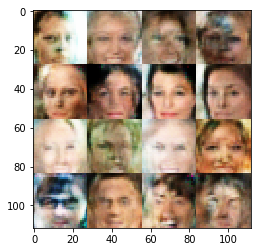

Epoch 1/8... Discriminator Loss: 0.9509 ... Generator Loss: 1.0056
Epoch 1/8... Discriminator Loss: 1.0695 ... Generator Loss: 1.0431
Epoch 1/8... Discriminator Loss: 1.3459 ... Generator Loss: 0.4654
Epoch 1/8... Discriminator Loss: 1.1809 ... Generator Loss: 0.5515
Epoch 1/8... Discriminator Loss: 1.4790 ... Generator Loss: 1.6894
Epoch 1/8... Discriminator Loss: 1.1321 ... Generator Loss: 1.3857
Epoch 1/8... Discriminator Loss: 1.4459 ... Generator Loss: 1.7789
Epoch 1/8... Discriminator Loss: 0.9537 ... Generator Loss: 1.2621
Epoch 1/8... Discriminator Loss: 1.5981 ... Generator Loss: 0.3833
Epoch 1/8... Discriminator Loss: 1.2842 ... Generator Loss: 1.8105


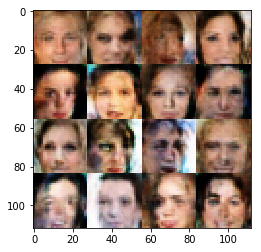

Epoch 1/8... Discriminator Loss: 1.5526 ... Generator Loss: 0.3723
Epoch 1/8... Discriminator Loss: 1.3548 ... Generator Loss: 0.5647
Epoch 1/8... Discriminator Loss: 1.0244 ... Generator Loss: 0.7322
Epoch 1/8... Discriminator Loss: 0.6478 ... Generator Loss: 1.9277
Epoch 1/8... Discriminator Loss: 1.2615 ... Generator Loss: 1.4156
Epoch 1/8... Discriminator Loss: 1.2100 ... Generator Loss: 0.7930
Epoch 1/8... Discriminator Loss: 1.1681 ... Generator Loss: 0.6547
Epoch 1/8... Discriminator Loss: 1.3469 ... Generator Loss: 0.8872
Epoch 1/8... Discriminator Loss: 0.9758 ... Generator Loss: 1.5644
Epoch 1/8... Discriminator Loss: 1.3962 ... Generator Loss: 1.3989


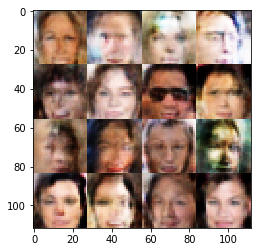

Epoch 1/8... Discriminator Loss: 0.7777 ... Generator Loss: 1.0979
Epoch 1/8... Discriminator Loss: 1.1443 ... Generator Loss: 0.9981
Epoch 1/8... Discriminator Loss: 0.8979 ... Generator Loss: 1.9070
Epoch 1/8... Discriminator Loss: 1.5120 ... Generator Loss: 2.1025
Epoch 1/8... Discriminator Loss: 1.3788 ... Generator Loss: 1.2677
Epoch 1/8... Discriminator Loss: 0.9292 ... Generator Loss: 1.1676
Epoch 1/8... Discriminator Loss: 1.3104 ... Generator Loss: 0.7948
Epoch 1/8... Discriminator Loss: 0.8038 ... Generator Loss: 1.7852
Epoch 1/8... Discriminator Loss: 2.2946 ... Generator Loss: 2.8733
Epoch 1/8... Discriminator Loss: 0.6904 ... Generator Loss: 2.1406


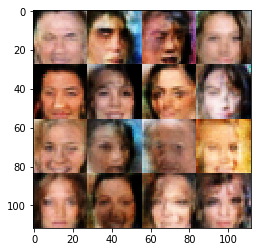

Epoch 1/8... Discriminator Loss: 1.0506 ... Generator Loss: 0.7370
Epoch 1/8... Discriminator Loss: 1.4263 ... Generator Loss: 0.4449
Epoch 1/8... Discriminator Loss: 1.3760 ... Generator Loss: 0.4713
Epoch 1/8... Discriminator Loss: 1.0679 ... Generator Loss: 0.6960
Epoch 1/8... Discriminator Loss: 1.1421 ... Generator Loss: 1.9001
Epoch 1/8... Discriminator Loss: 1.6598 ... Generator Loss: 1.8360
Epoch 1/8... Discriminator Loss: 1.4500 ... Generator Loss: 1.7456
Epoch 1/8... Discriminator Loss: 1.3089 ... Generator Loss: 1.0171
Epoch 1/8... Discriminator Loss: 1.0493 ... Generator Loss: 0.9741
Epoch 1/8... Discriminator Loss: 0.8615 ... Generator Loss: 0.9730


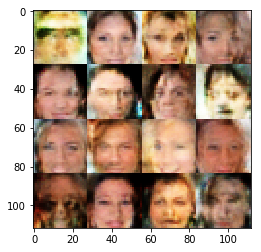

Epoch 1/8... Discriminator Loss: 1.0799 ... Generator Loss: 0.5765
Epoch 1/8... Discriminator Loss: 1.0005 ... Generator Loss: 0.7844
Epoch 1/8... Discriminator Loss: 0.8149 ... Generator Loss: 1.2383
Epoch 1/8... Discriminator Loss: 0.9174 ... Generator Loss: 0.9797
Epoch 1/8... Discriminator Loss: 1.4411 ... Generator Loss: 1.2810
Epoch 1/8... Discriminator Loss: 1.2988 ... Generator Loss: 1.6570


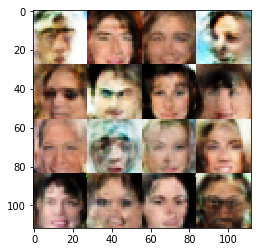

Epoch 2/8... Discriminator Loss: 0.7574 ... Generator Loss: 1.2328
Epoch 2/8... Discriminator Loss: 1.2893 ... Generator Loss: 0.8939
Epoch 2/8... Discriminator Loss: 1.1286 ... Generator Loss: 1.4960
Epoch 2/8... Discriminator Loss: 1.4300 ... Generator Loss: 2.1528


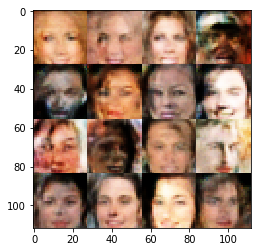

Epoch 2/8... Discriminator Loss: 1.1629 ... Generator Loss: 0.7413
Epoch 2/8... Discriminator Loss: 1.1747 ... Generator Loss: 0.6358
Epoch 2/8... Discriminator Loss: 1.2127 ... Generator Loss: 2.0974
Epoch 2/8... Discriminator Loss: 0.7983 ... Generator Loss: 1.1590
Epoch 2/8... Discriminator Loss: 1.2226 ... Generator Loss: 2.7985
Epoch 2/8... Discriminator Loss: 1.1624 ... Generator Loss: 0.9391
Epoch 2/8... Discriminator Loss: 1.2748 ... Generator Loss: 0.5639
Epoch 2/8... Discriminator Loss: 0.7899 ... Generator Loss: 1.1704
Epoch 2/8... Discriminator Loss: 1.0125 ... Generator Loss: 1.2791
Epoch 2/8... Discriminator Loss: 1.3600 ... Generator Loss: 1.7480


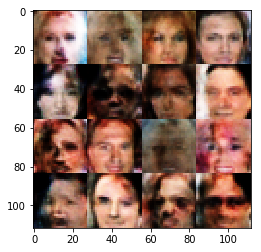

Epoch 2/8... Discriminator Loss: 1.2759 ... Generator Loss: 0.5388
Epoch 2/8... Discriminator Loss: 1.1308 ... Generator Loss: 0.6335
Epoch 2/8... Discriminator Loss: 2.0971 ... Generator Loss: 2.0933
Epoch 2/8... Discriminator Loss: 0.8011 ... Generator Loss: 1.3782
Epoch 2/8... Discriminator Loss: 1.0754 ... Generator Loss: 0.8047
Epoch 2/8... Discriminator Loss: 1.6144 ... Generator Loss: 0.3711
Epoch 2/8... Discriminator Loss: 1.5521 ... Generator Loss: 0.3962
Epoch 2/8... Discriminator Loss: 1.1656 ... Generator Loss: 1.0642
Epoch 2/8... Discriminator Loss: 1.0922 ... Generator Loss: 1.3240
Epoch 2/8... Discriminator Loss: 1.0946 ... Generator Loss: 0.7259


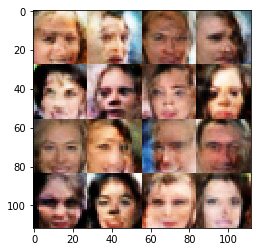

Epoch 2/8... Discriminator Loss: 1.4294 ... Generator Loss: 0.4434
Epoch 2/8... Discriminator Loss: 1.1737 ... Generator Loss: 0.7008
Epoch 2/8... Discriminator Loss: 0.8514 ... Generator Loss: 1.3782
Epoch 2/8... Discriminator Loss: 1.1061 ... Generator Loss: 0.9829
Epoch 2/8... Discriminator Loss: 1.4592 ... Generator Loss: 0.5224
Epoch 2/8... Discriminator Loss: 0.8583 ... Generator Loss: 1.3449
Epoch 2/8... Discriminator Loss: 0.9679 ... Generator Loss: 0.9762
Epoch 2/8... Discriminator Loss: 0.5851 ... Generator Loss: 1.6402
Epoch 2/8... Discriminator Loss: 1.5010 ... Generator Loss: 1.2712
Epoch 2/8... Discriminator Loss: 1.0786 ... Generator Loss: 1.1853


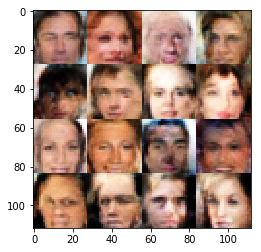

Epoch 2/8... Discriminator Loss: 1.2781 ... Generator Loss: 1.0629
Epoch 2/8... Discriminator Loss: 1.1893 ... Generator Loss: 1.2852
Epoch 2/8... Discriminator Loss: 1.2548 ... Generator Loss: 0.9547
Epoch 2/8... Discriminator Loss: 1.2577 ... Generator Loss: 0.6267
Epoch 2/8... Discriminator Loss: 0.8640 ... Generator Loss: 0.9318
Epoch 2/8... Discriminator Loss: 1.2374 ... Generator Loss: 1.5541
Epoch 2/8... Discriminator Loss: 1.4882 ... Generator Loss: 0.4545
Epoch 2/8... Discriminator Loss: 0.9804 ... Generator Loss: 0.9777
Epoch 2/8... Discriminator Loss: 0.4688 ... Generator Loss: 1.9263
Epoch 2/8... Discriminator Loss: 0.6984 ... Generator Loss: 1.3961


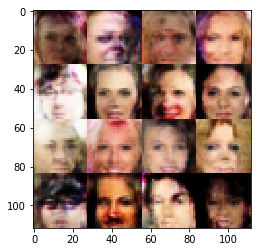

Epoch 2/8... Discriminator Loss: 1.5040 ... Generator Loss: 0.3924
Epoch 2/8... Discriminator Loss: 1.5847 ... Generator Loss: 0.4052
Epoch 2/8... Discriminator Loss: 0.8297 ... Generator Loss: 0.9089
Epoch 2/8... Discriminator Loss: 1.2977 ... Generator Loss: 0.5235
Epoch 2/8... Discriminator Loss: 1.4742 ... Generator Loss: 2.1736
Epoch 2/8... Discriminator Loss: 0.8353 ... Generator Loss: 1.5833
Epoch 2/8... Discriminator Loss: 1.2251 ... Generator Loss: 0.8737
Epoch 2/8... Discriminator Loss: 1.0573 ... Generator Loss: 1.4987
Epoch 2/8... Discriminator Loss: 1.0831 ... Generator Loss: 0.9404
Epoch 2/8... Discriminator Loss: 1.7121 ... Generator Loss: 1.8928


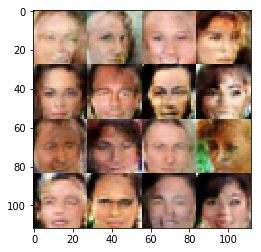

Epoch 2/8... Discriminator Loss: 1.2198 ... Generator Loss: 1.2388
Epoch 2/8... Discriminator Loss: 0.8240 ... Generator Loss: 0.9712
Epoch 2/8... Discriminator Loss: 1.2884 ... Generator Loss: 1.1035
Epoch 2/8... Discriminator Loss: 1.0246 ... Generator Loss: 0.6795
Epoch 2/8... Discriminator Loss: 0.9648 ... Generator Loss: 1.9625
Epoch 2/8... Discriminator Loss: 1.2689 ... Generator Loss: 0.5591
Epoch 2/8... Discriminator Loss: 1.1130 ... Generator Loss: 1.6447
Epoch 2/8... Discriminator Loss: 0.9603 ... Generator Loss: 1.0636
Epoch 2/8... Discriminator Loss: 1.4247 ... Generator Loss: 1.1740
Epoch 2/8... Discriminator Loss: 0.8882 ... Generator Loss: 1.8494


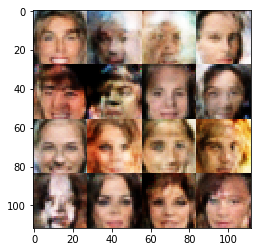

Epoch 2/8... Discriminator Loss: 1.7460 ... Generator Loss: 2.0344
Epoch 2/8... Discriminator Loss: 1.2535 ... Generator Loss: 1.0365
Epoch 2/8... Discriminator Loss: 1.0479 ... Generator Loss: 0.7385
Epoch 2/8... Discriminator Loss: 1.3862 ... Generator Loss: 0.4399
Epoch 2/8... Discriminator Loss: 1.6484 ... Generator Loss: 0.3916
Epoch 2/8... Discriminator Loss: 1.3557 ... Generator Loss: 1.2055
Epoch 2/8... Discriminator Loss: 1.0977 ... Generator Loss: 1.0107
Epoch 2/8... Discriminator Loss: 1.3778 ... Generator Loss: 1.9467
Epoch 2/8... Discriminator Loss: 0.6306 ... Generator Loss: 1.9084
Epoch 2/8... Discriminator Loss: 1.2552 ... Generator Loss: 0.6286


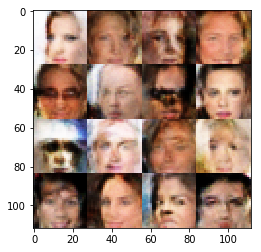

Epoch 2/8... Discriminator Loss: 1.3002 ... Generator Loss: 0.5275
Epoch 2/8... Discriminator Loss: 1.1183 ... Generator Loss: 0.5730
Epoch 2/8... Discriminator Loss: 1.2442 ... Generator Loss: 0.6133
Epoch 2/8... Discriminator Loss: 1.4054 ... Generator Loss: 0.4775
Epoch 2/8... Discriminator Loss: 1.1878 ... Generator Loss: 0.7585
Epoch 2/8... Discriminator Loss: 0.9612 ... Generator Loss: 1.0073
Epoch 2/8... Discriminator Loss: 1.0923 ... Generator Loss: 1.4082
Epoch 2/8... Discriminator Loss: 1.0107 ... Generator Loss: 1.0524
Epoch 2/8... Discriminator Loss: 1.0899 ... Generator Loss: 0.6653
Epoch 2/8... Discriminator Loss: 1.2715 ... Generator Loss: 1.2410


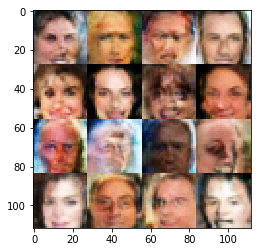

Epoch 2/8... Discriminator Loss: 0.7841 ... Generator Loss: 1.9524
Epoch 2/8... Discriminator Loss: 0.8801 ... Generator Loss: 1.4075
Epoch 2/8... Discriminator Loss: 1.1817 ... Generator Loss: 0.5836
Epoch 2/8... Discriminator Loss: 1.1658 ... Generator Loss: 0.6168
Epoch 2/8... Discriminator Loss: 1.1198 ... Generator Loss: 0.5872
Epoch 2/8... Discriminator Loss: 1.1697 ... Generator Loss: 0.5617
Epoch 2/8... Discriminator Loss: 1.2628 ... Generator Loss: 0.6016
Epoch 2/8... Discriminator Loss: 1.0528 ... Generator Loss: 1.7362
Epoch 2/8... Discriminator Loss: 1.0310 ... Generator Loss: 1.6796
Epoch 2/8... Discriminator Loss: 0.9672 ... Generator Loss: 2.4098


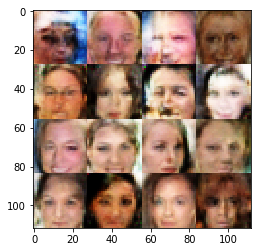

Epoch 2/8... Discriminator Loss: 1.3530 ... Generator Loss: 1.0143
Epoch 2/8... Discriminator Loss: 1.2425 ... Generator Loss: 0.6496
Epoch 2/8... Discriminator Loss: 1.1723 ... Generator Loss: 0.8135
Epoch 2/8... Discriminator Loss: 1.5793 ... Generator Loss: 0.3615
Epoch 2/8... Discriminator Loss: 0.8118 ... Generator Loss: 1.3300
Epoch 2/8... Discriminator Loss: 1.4353 ... Generator Loss: 0.7838
Epoch 2/8... Discriminator Loss: 1.1434 ... Generator Loss: 0.6655
Epoch 2/8... Discriminator Loss: 0.9471 ... Generator Loss: 1.3635
Epoch 2/8... Discriminator Loss: 1.5211 ... Generator Loss: 1.9941
Epoch 2/8... Discriminator Loss: 1.0866 ... Generator Loss: 1.0145


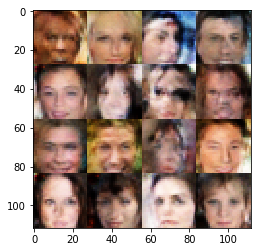

Epoch 2/8... Discriminator Loss: 1.2500 ... Generator Loss: 0.6634
Epoch 2/8... Discriminator Loss: 1.1744 ... Generator Loss: 1.1713
Epoch 2/8... Discriminator Loss: 0.8261 ... Generator Loss: 1.0363
Epoch 2/8... Discriminator Loss: 1.1808 ... Generator Loss: 0.7138
Epoch 2/8... Discriminator Loss: 0.8954 ... Generator Loss: 0.8726
Epoch 2/8... Discriminator Loss: 0.9786 ... Generator Loss: 0.7522
Epoch 2/8... Discriminator Loss: 1.0872 ... Generator Loss: 0.7416
Epoch 2/8... Discriminator Loss: 1.2961 ... Generator Loss: 0.5591
Epoch 2/8... Discriminator Loss: 1.3986 ... Generator Loss: 1.5984
Epoch 2/8... Discriminator Loss: 1.3774 ... Generator Loss: 1.6331


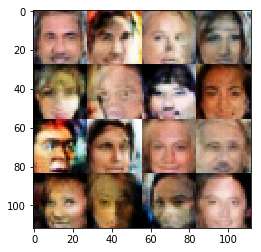

Epoch 2/8... Discriminator Loss: 0.7714 ... Generator Loss: 1.1836
Epoch 2/8... Discriminator Loss: 1.2399 ... Generator Loss: 0.5124
Epoch 2/8... Discriminator Loss: 0.7754 ... Generator Loss: 1.2497
Epoch 2/8... Discriminator Loss: 1.5640 ... Generator Loss: 0.4000
Epoch 2/8... Discriminator Loss: 1.5964 ... Generator Loss: 1.6865
Epoch 2/8... Discriminator Loss: 1.3464 ... Generator Loss: 1.0821
Epoch 2/8... Discriminator Loss: 0.9541 ... Generator Loss: 1.1310
Epoch 2/8... Discriminator Loss: 1.3623 ... Generator Loss: 0.4734
Epoch 2/8... Discriminator Loss: 1.1338 ... Generator Loss: 0.6467
Epoch 2/8... Discriminator Loss: 2.0711 ... Generator Loss: 1.7812


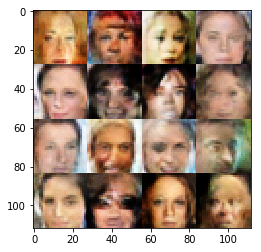

Epoch 2/8... Discriminator Loss: 0.9795 ... Generator Loss: 0.8642
Epoch 2/8... Discriminator Loss: 0.8719 ... Generator Loss: 0.8256
Epoch 2/8... Discriminator Loss: 1.4285 ... Generator Loss: 0.4551
Epoch 2/8... Discriminator Loss: 1.4531 ... Generator Loss: 0.4197
Epoch 2/8... Discriminator Loss: 1.2639 ... Generator Loss: 1.1175
Epoch 2/8... Discriminator Loss: 0.9063 ... Generator Loss: 1.8220
Epoch 2/8... Discriminator Loss: 1.3285 ... Generator Loss: 1.2094
Epoch 2/8... Discriminator Loss: 0.7960 ... Generator Loss: 1.4897
Epoch 2/8... Discriminator Loss: 1.3509 ... Generator Loss: 0.4382
Epoch 2/8... Discriminator Loss: 1.6393 ... Generator Loss: 0.3679


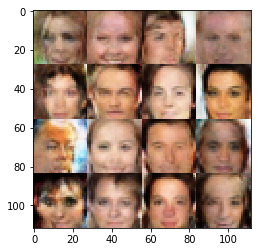

Epoch 2/8... Discriminator Loss: 1.5501 ... Generator Loss: 0.3546
Epoch 2/8... Discriminator Loss: 1.8492 ... Generator Loss: 1.5427
Epoch 2/8... Discriminator Loss: 1.3193 ... Generator Loss: 1.1980
Epoch 2/8... Discriminator Loss: 1.3175 ... Generator Loss: 0.5285
Epoch 2/8... Discriminator Loss: 1.3040 ... Generator Loss: 0.5467
Epoch 2/8... Discriminator Loss: 1.1015 ... Generator Loss: 0.7277
Epoch 2/8... Discriminator Loss: 1.0773 ... Generator Loss: 0.6798
Epoch 2/8... Discriminator Loss: 0.8177 ... Generator Loss: 1.3415
Epoch 2/8... Discriminator Loss: 0.7668 ... Generator Loss: 1.1577
Epoch 2/8... Discriminator Loss: 0.4926 ... Generator Loss: 1.9250


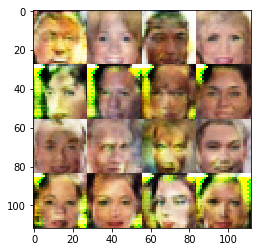

Epoch 2/8... Discriminator Loss: 0.5664 ... Generator Loss: 1.7259
Epoch 2/8... Discriminator Loss: 0.9350 ... Generator Loss: 0.9271
Epoch 2/8... Discriminator Loss: 1.0570 ... Generator Loss: 0.7544
Epoch 2/8... Discriminator Loss: 1.1303 ... Generator Loss: 0.7778
Epoch 2/8... Discriminator Loss: 1.1056 ... Generator Loss: 1.1215
Epoch 2/8... Discriminator Loss: 0.7368 ... Generator Loss: 1.2968
Epoch 2/8... Discriminator Loss: 1.1056 ... Generator Loss: 0.7758
Epoch 2/8... Discriminator Loss: 0.7127 ... Generator Loss: 1.2496
Epoch 2/8... Discriminator Loss: 0.9961 ... Generator Loss: 0.7213
Epoch 2/8... Discriminator Loss: 2.1899 ... Generator Loss: 2.7559


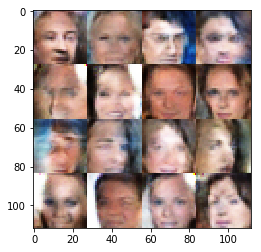

Epoch 2/8... Discriminator Loss: 1.5655 ... Generator Loss: 0.4359
Epoch 2/8... Discriminator Loss: 0.5278 ... Generator Loss: 1.5052
Epoch 2/8... Discriminator Loss: 0.5349 ... Generator Loss: 1.8091
Epoch 2/8... Discriminator Loss: 0.9524 ... Generator Loss: 1.1127
Epoch 2/8... Discriminator Loss: 1.3313 ... Generator Loss: 1.9225
Epoch 2/8... Discriminator Loss: 1.2156 ... Generator Loss: 2.0710
Epoch 2/8... Discriminator Loss: 0.9766 ... Generator Loss: 0.9978
Epoch 2/8... Discriminator Loss: 0.4912 ... Generator Loss: 2.3754
Epoch 2/8... Discriminator Loss: 0.4771 ... Generator Loss: 1.9901
Epoch 2/8... Discriminator Loss: 0.3906 ... Generator Loss: 3.2172


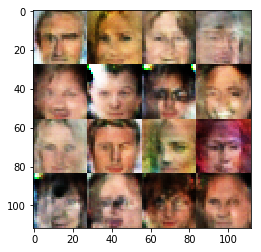

Epoch 2/8... Discriminator Loss: 0.5819 ... Generator Loss: 1.5375
Epoch 2/8... Discriminator Loss: 4.2761 ... Generator Loss: 3.9659
Epoch 2/8... Discriminator Loss: 1.3781 ... Generator Loss: 1.8263
Epoch 2/8... Discriminator Loss: 1.0982 ... Generator Loss: 2.8151
Epoch 2/8... Discriminator Loss: 1.3292 ... Generator Loss: 1.5646
Epoch 2/8... Discriminator Loss: 1.6563 ... Generator Loss: 0.3351
Epoch 2/8... Discriminator Loss: 0.8694 ... Generator Loss: 0.8542
Epoch 2/8... Discriminator Loss: 1.0965 ... Generator Loss: 0.8601
Epoch 2/8... Discriminator Loss: 1.2457 ... Generator Loss: 1.4458
Epoch 2/8... Discriminator Loss: 1.0730 ... Generator Loss: 1.5005


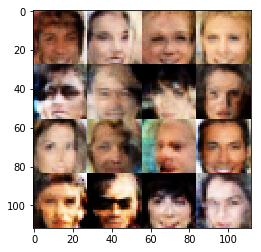

Epoch 2/8... Discriminator Loss: 1.1015 ... Generator Loss: 0.9090
Epoch 2/8... Discriminator Loss: 1.2975 ... Generator Loss: 1.3273
Epoch 2/8... Discriminator Loss: 1.2202 ... Generator Loss: 0.6757
Epoch 2/8... Discriminator Loss: 1.1164 ... Generator Loss: 0.7524
Epoch 2/8... Discriminator Loss: 0.7693 ... Generator Loss: 2.3144
Epoch 2/8... Discriminator Loss: 1.4117 ... Generator Loss: 0.4664
Epoch 2/8... Discriminator Loss: 0.9820 ... Generator Loss: 1.1716
Epoch 2/8... Discriminator Loss: 0.7753 ... Generator Loss: 1.6000
Epoch 2/8... Discriminator Loss: 1.1344 ... Generator Loss: 1.4136
Epoch 2/8... Discriminator Loss: 1.1044 ... Generator Loss: 1.0658


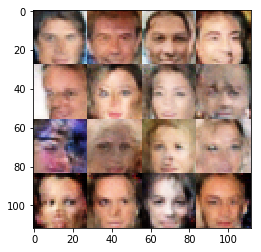

Epoch 2/8... Discriminator Loss: 1.1719 ... Generator Loss: 1.0205
Epoch 2/8... Discriminator Loss: 1.3864 ... Generator Loss: 0.4624
Epoch 2/8... Discriminator Loss: 1.0222 ... Generator Loss: 0.8513
Epoch 2/8... Discriminator Loss: 1.1192 ... Generator Loss: 0.7870
Epoch 2/8... Discriminator Loss: 1.4332 ... Generator Loss: 0.3904
Epoch 2/8... Discriminator Loss: 1.2718 ... Generator Loss: 1.5342
Epoch 2/8... Discriminator Loss: 1.0590 ... Generator Loss: 0.8048
Epoch 2/8... Discriminator Loss: 1.5345 ... Generator Loss: 0.4394
Epoch 2/8... Discriminator Loss: 1.1812 ... Generator Loss: 0.6973
Epoch 2/8... Discriminator Loss: 0.9885 ... Generator Loss: 0.9473


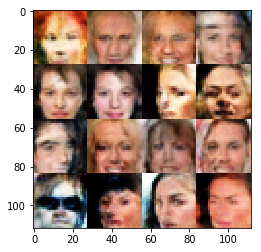

Epoch 2/8... Discriminator Loss: 1.3317 ... Generator Loss: 0.5634
Epoch 2/8... Discriminator Loss: 1.4589 ... Generator Loss: 0.5049
Epoch 2/8... Discriminator Loss: 0.7721 ... Generator Loss: 1.4101
Epoch 2/8... Discriminator Loss: 1.3121 ... Generator Loss: 1.3060
Epoch 2/8... Discriminator Loss: 1.3779 ... Generator Loss: 0.5167
Epoch 2/8... Discriminator Loss: 1.3765 ... Generator Loss: 1.1813
Epoch 2/8... Discriminator Loss: 1.2118 ... Generator Loss: 1.1439
Epoch 2/8... Discriminator Loss: 0.8515 ... Generator Loss: 1.2983
Epoch 2/8... Discriminator Loss: 1.6417 ... Generator Loss: 1.6835
Epoch 2/8... Discriminator Loss: 0.8686 ... Generator Loss: 1.0735


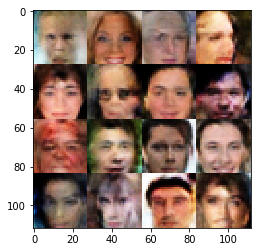

Epoch 2/8... Discriminator Loss: 1.2778 ... Generator Loss: 0.6233
Epoch 2/8... Discriminator Loss: 1.2477 ... Generator Loss: 0.6569
Epoch 2/8... Discriminator Loss: 1.1601 ... Generator Loss: 0.7264
Epoch 2/8... Discriminator Loss: 1.4289 ... Generator Loss: 0.5969
Epoch 2/8... Discriminator Loss: 1.7535 ... Generator Loss: 0.3567
Epoch 2/8... Discriminator Loss: 0.8236 ... Generator Loss: 1.5899
Epoch 2/8... Discriminator Loss: 0.5885 ... Generator Loss: 1.8764
Epoch 2/8... Discriminator Loss: 1.4873 ... Generator Loss: 0.3988
Epoch 2/8... Discriminator Loss: 1.0538 ... Generator Loss: 0.9410
Epoch 2/8... Discriminator Loss: 1.2194 ... Generator Loss: 0.6253


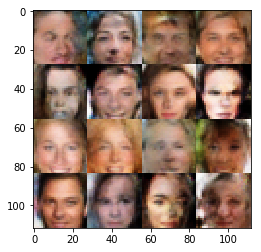

Epoch 2/8... Discriminator Loss: 1.3456 ... Generator Loss: 1.1570
Epoch 2/8... Discriminator Loss: 1.2385 ... Generator Loss: 1.2568
Epoch 2/8... Discriminator Loss: 0.6321 ... Generator Loss: 1.6327
Epoch 2/8... Discriminator Loss: 0.5362 ... Generator Loss: 2.2206
Epoch 2/8... Discriminator Loss: 0.9219 ... Generator Loss: 0.7887
Epoch 2/8... Discriminator Loss: 1.2299 ... Generator Loss: 0.5280
Epoch 2/8... Discriminator Loss: 1.4131 ... Generator Loss: 0.5011
Epoch 2/8... Discriminator Loss: 1.4494 ... Generator Loss: 0.4434
Epoch 2/8... Discriminator Loss: 1.4562 ... Generator Loss: 0.4061
Epoch 2/8... Discriminator Loss: 1.5061 ... Generator Loss: 0.4581


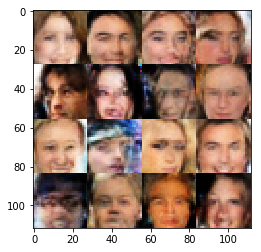

Epoch 2/8... Discriminator Loss: 1.3606 ... Generator Loss: 1.5132
Epoch 2/8... Discriminator Loss: 0.9900 ... Generator Loss: 1.3434
Epoch 2/8... Discriminator Loss: 0.7672 ... Generator Loss: 1.6828
Epoch 2/8... Discriminator Loss: 0.9302 ... Generator Loss: 0.9028
Epoch 2/8... Discriminator Loss: 1.3417 ... Generator Loss: 1.3822
Epoch 2/8... Discriminator Loss: 1.4230 ... Generator Loss: 1.3180
Epoch 2/8... Discriminator Loss: 0.7393 ... Generator Loss: 1.3422
Epoch 2/8... Discriminator Loss: 1.1260 ... Generator Loss: 0.8533
Epoch 2/8... Discriminator Loss: 1.0662 ... Generator Loss: 0.6960
Epoch 2/8... Discriminator Loss: 1.4487 ... Generator Loss: 0.4561


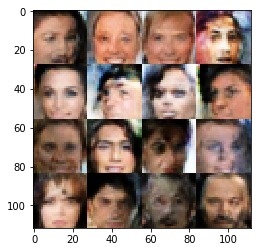

Epoch 2/8... Discriminator Loss: 1.2808 ... Generator Loss: 1.6580
Epoch 2/8... Discriminator Loss: 0.8992 ... Generator Loss: 0.9681
Epoch 2/8... Discriminator Loss: 1.2306 ... Generator Loss: 0.6357
Epoch 2/8... Discriminator Loss: 1.0333 ... Generator Loss: 1.2256
Epoch 2/8... Discriminator Loss: 1.0433 ... Generator Loss: 1.1390
Epoch 2/8... Discriminator Loss: 1.4360 ... Generator Loss: 0.4663
Epoch 2/8... Discriminator Loss: 1.5457 ... Generator Loss: 0.4134
Epoch 2/8... Discriminator Loss: 1.2619 ... Generator Loss: 0.6277
Epoch 2/8... Discriminator Loss: 1.3035 ... Generator Loss: 0.4734
Epoch 2/8... Discriminator Loss: 1.0749 ... Generator Loss: 0.9414


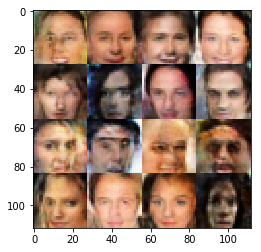

Epoch 2/8... Discriminator Loss: 1.5337 ... Generator Loss: 0.4496
Epoch 2/8... Discriminator Loss: 0.9894 ... Generator Loss: 1.0128
Epoch 2/8... Discriminator Loss: 1.1875 ... Generator Loss: 0.7906
Epoch 2/8... Discriminator Loss: 0.7977 ... Generator Loss: 1.2458
Epoch 2/8... Discriminator Loss: 0.7754 ... Generator Loss: 1.2392
Epoch 2/8... Discriminator Loss: 1.4503 ... Generator Loss: 1.3487
Epoch 2/8... Discriminator Loss: 0.9093 ... Generator Loss: 1.6297
Epoch 2/8... Discriminator Loss: 1.0285 ... Generator Loss: 1.3262
Epoch 2/8... Discriminator Loss: 0.9855 ... Generator Loss: 1.6684
Epoch 2/8... Discriminator Loss: 1.2909 ... Generator Loss: 1.3596


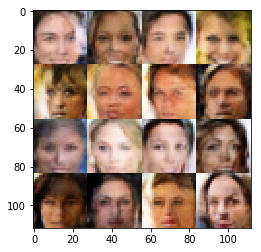

Epoch 2/8... Discriminator Loss: 0.9458 ... Generator Loss: 1.4272
Epoch 2/8... Discriminator Loss: 1.3839 ... Generator Loss: 0.5494
Epoch 2/8... Discriminator Loss: 1.1330 ... Generator Loss: 0.7344
Epoch 2/8... Discriminator Loss: 1.2432 ... Generator Loss: 0.5908
Epoch 2/8... Discriminator Loss: 1.4586 ... Generator Loss: 0.4023
Epoch 2/8... Discriminator Loss: 0.9438 ... Generator Loss: 1.2164
Epoch 2/8... Discriminator Loss: 1.3678 ... Generator Loss: 0.9514
Epoch 2/8... Discriminator Loss: 1.2764 ... Generator Loss: 1.2528
Epoch 2/8... Discriminator Loss: 1.1946 ... Generator Loss: 1.0902
Epoch 2/8... Discriminator Loss: 1.0689 ... Generator Loss: 0.8997


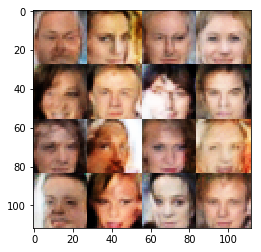

Epoch 2/8... Discriminator Loss: 1.2542 ... Generator Loss: 0.5729
Epoch 2/8... Discriminator Loss: 1.3247 ... Generator Loss: 0.7133
Epoch 2/8... Discriminator Loss: 1.3826 ... Generator Loss: 0.6144
Epoch 2/8... Discriminator Loss: 1.5100 ... Generator Loss: 0.5105
Epoch 2/8... Discriminator Loss: 0.9073 ... Generator Loss: 1.0105
Epoch 2/8... Discriminator Loss: 1.2907 ... Generator Loss: 0.5413
Epoch 2/8... Discriminator Loss: 1.3023 ... Generator Loss: 0.5692
Epoch 2/8... Discriminator Loss: 1.2068 ... Generator Loss: 0.6738
Epoch 2/8... Discriminator Loss: 1.1511 ... Generator Loss: 1.0092
Epoch 2/8... Discriminator Loss: 1.3098 ... Generator Loss: 1.2931


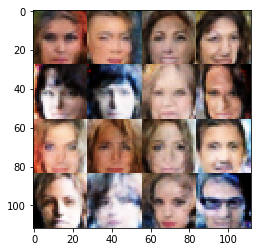

Epoch 2/8... Discriminator Loss: 0.8579 ... Generator Loss: 1.4442
Epoch 2/8... Discriminator Loss: 1.2550 ... Generator Loss: 0.7262
Epoch 2/8... Discriminator Loss: 1.0972 ... Generator Loss: 0.6992
Epoch 2/8... Discriminator Loss: 1.1502 ... Generator Loss: 1.0652
Epoch 2/8... Discriminator Loss: 1.2548 ... Generator Loss: 0.7877
Epoch 2/8... Discriminator Loss: 1.3568 ... Generator Loss: 0.5515
Epoch 2/8... Discriminator Loss: 1.5297 ... Generator Loss: 0.5034
Epoch 2/8... Discriminator Loss: 1.0501 ... Generator Loss: 1.2366
Epoch 2/8... Discriminator Loss: 0.9493 ... Generator Loss: 1.2099
Epoch 2/8... Discriminator Loss: 1.0782 ... Generator Loss: 1.6354


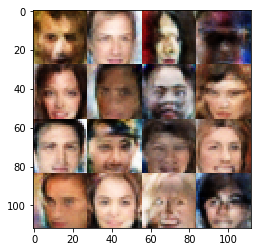

Epoch 2/8... Discriminator Loss: 1.2576 ... Generator Loss: 1.2862
Epoch 2/8... Discriminator Loss: 1.1970 ... Generator Loss: 1.0653
Epoch 2/8... Discriminator Loss: 1.5258 ... Generator Loss: 0.4007
Epoch 2/8... Discriminator Loss: 0.8691 ... Generator Loss: 1.1764
Epoch 2/8... Discriminator Loss: 1.2632 ... Generator Loss: 0.7169
Epoch 2/8... Discriminator Loss: 1.1708 ... Generator Loss: 0.6370
Epoch 2/8... Discriminator Loss: 0.7556 ... Generator Loss: 2.0172
Epoch 2/8... Discriminator Loss: 0.9615 ... Generator Loss: 0.9215
Epoch 2/8... Discriminator Loss: 1.2956 ... Generator Loss: 0.4415
Epoch 2/8... Discriminator Loss: 1.2413 ... Generator Loss: 1.1387


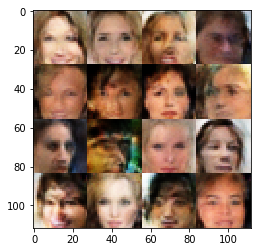

Epoch 2/8... Discriminator Loss: 1.2744 ... Generator Loss: 1.1672
Epoch 2/8... Discriminator Loss: 1.0938 ... Generator Loss: 0.8023
Epoch 2/8... Discriminator Loss: 0.8721 ... Generator Loss: 1.2018
Epoch 2/8... Discriminator Loss: 1.0286 ... Generator Loss: 0.7476
Epoch 2/8... Discriminator Loss: 1.2563 ... Generator Loss: 0.4694
Epoch 2/8... Discriminator Loss: 1.5657 ... Generator Loss: 0.4474
Epoch 2/8... Discriminator Loss: 1.1646 ... Generator Loss: 0.7712
Epoch 2/8... Discriminator Loss: 0.9217 ... Generator Loss: 1.0763
Epoch 2/8... Discriminator Loss: 1.0261 ... Generator Loss: 1.6580
Epoch 2/8... Discriminator Loss: 1.3097 ... Generator Loss: 0.5833


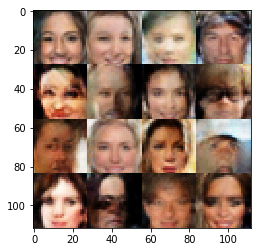

Epoch 2/8... Discriminator Loss: 1.2196 ... Generator Loss: 0.7326
Epoch 2/8... Discriminator Loss: 1.0896 ... Generator Loss: 0.7610
Epoch 2/8... Discriminator Loss: 0.9847 ... Generator Loss: 1.1249
Epoch 2/8... Discriminator Loss: 1.3306 ... Generator Loss: 0.5106
Epoch 2/8... Discriminator Loss: 0.9674 ... Generator Loss: 0.7868
Epoch 2/8... Discriminator Loss: 1.1880 ... Generator Loss: 0.8483
Epoch 2/8... Discriminator Loss: 1.2380 ... Generator Loss: 0.6033
Epoch 2/8... Discriminator Loss: 1.1286 ... Generator Loss: 0.6972
Epoch 2/8... Discriminator Loss: 1.1995 ... Generator Loss: 0.7077
Epoch 2/8... Discriminator Loss: 1.2523 ... Generator Loss: 0.8094


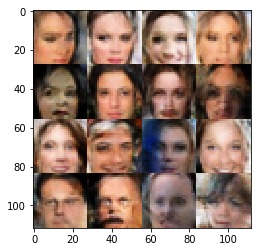

Epoch 2/8... Discriminator Loss: 1.7672 ... Generator Loss: 0.3341
Epoch 2/8... Discriminator Loss: 1.2979 ... Generator Loss: 0.5027
Epoch 2/8... Discriminator Loss: 1.2938 ... Generator Loss: 1.4323


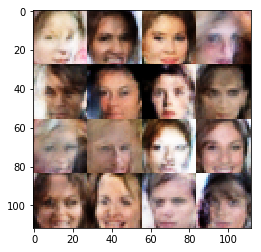

Epoch 3/8... Discriminator Loss: 1.1175 ... Generator Loss: 0.8710
Epoch 3/8... Discriminator Loss: 1.2193 ... Generator Loss: 0.6647
Epoch 3/8... Discriminator Loss: 1.1685 ... Generator Loss: 0.7788
Epoch 3/8... Discriminator Loss: 1.3528 ... Generator Loss: 1.1731
Epoch 3/8... Discriminator Loss: 1.0699 ... Generator Loss: 0.9966
Epoch 3/8... Discriminator Loss: 1.2847 ... Generator Loss: 0.6531
Epoch 3/8... Discriminator Loss: 1.3733 ... Generator Loss: 1.3865


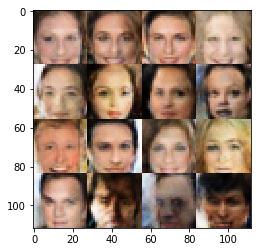

Epoch 3/8... Discriminator Loss: 1.1477 ... Generator Loss: 1.1091
Epoch 3/8... Discriminator Loss: 1.2031 ... Generator Loss: 0.7608
Epoch 3/8... Discriminator Loss: 1.3754 ... Generator Loss: 0.4975
Epoch 3/8... Discriminator Loss: 1.1983 ... Generator Loss: 0.6407
Epoch 3/8... Discriminator Loss: 1.1816 ... Generator Loss: 0.6961
Epoch 3/8... Discriminator Loss: 1.5561 ... Generator Loss: 0.4666
Epoch 3/8... Discriminator Loss: 1.3941 ... Generator Loss: 0.9833
Epoch 3/8... Discriminator Loss: 1.3757 ... Generator Loss: 1.4938
Epoch 3/8... Discriminator Loss: 1.2638 ... Generator Loss: 1.1543
Epoch 3/8... Discriminator Loss: 0.9328 ... Generator Loss: 1.4682


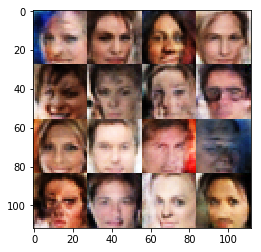

Epoch 3/8... Discriminator Loss: 1.2498 ... Generator Loss: 1.4805
Epoch 3/8... Discriminator Loss: 1.2142 ... Generator Loss: 0.7977
Epoch 3/8... Discriminator Loss: 0.9946 ... Generator Loss: 0.9114
Epoch 3/8... Discriminator Loss: 1.2412 ... Generator Loss: 1.5766
Epoch 3/8... Discriminator Loss: 1.2649 ... Generator Loss: 0.5686
Epoch 3/8... Discriminator Loss: 1.1517 ... Generator Loss: 0.7795
Epoch 3/8... Discriminator Loss: 1.3983 ... Generator Loss: 0.4640
Epoch 3/8... Discriminator Loss: 1.5198 ... Generator Loss: 1.4956
Epoch 3/8... Discriminator Loss: 0.9985 ... Generator Loss: 0.9372
Epoch 3/8... Discriminator Loss: 1.1510 ... Generator Loss: 1.2872


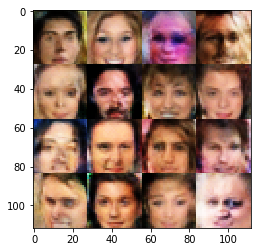

Epoch 3/8... Discriminator Loss: 1.3270 ... Generator Loss: 1.2291
Epoch 3/8... Discriminator Loss: 1.2236 ... Generator Loss: 1.1357
Epoch 3/8... Discriminator Loss: 0.8743 ... Generator Loss: 2.2399
Epoch 3/8... Discriminator Loss: 1.3061 ... Generator Loss: 1.3998
Epoch 3/8... Discriminator Loss: 1.3728 ... Generator Loss: 0.4682
Epoch 3/8... Discriminator Loss: 1.4552 ... Generator Loss: 0.4850
Epoch 3/8... Discriminator Loss: 1.3573 ... Generator Loss: 0.4518
Epoch 3/8... Discriminator Loss: 1.3364 ... Generator Loss: 0.7659
Epoch 3/8... Discriminator Loss: 1.2260 ... Generator Loss: 0.7118
Epoch 3/8... Discriminator Loss: 1.3746 ... Generator Loss: 1.1634


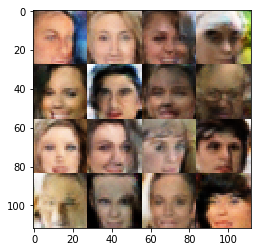

Epoch 3/8... Discriminator Loss: 1.1939 ... Generator Loss: 0.7362
Epoch 3/8... Discriminator Loss: 0.9107 ... Generator Loss: 1.1303
Epoch 3/8... Discriminator Loss: 1.1701 ... Generator Loss: 0.7114
Epoch 3/8... Discriminator Loss: 1.0952 ... Generator Loss: 0.7111
Epoch 3/8... Discriminator Loss: 1.1101 ... Generator Loss: 0.9028
Epoch 3/8... Discriminator Loss: 1.4354 ... Generator Loss: 0.4796
Epoch 3/8... Discriminator Loss: 1.2123 ... Generator Loss: 1.0420
Epoch 3/8... Discriminator Loss: 1.2735 ... Generator Loss: 0.9929
Epoch 3/8... Discriminator Loss: 1.0962 ... Generator Loss: 1.0104
Epoch 3/8... Discriminator Loss: 1.3000 ... Generator Loss: 0.6496


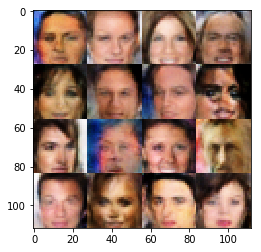

Epoch 3/8... Discriminator Loss: 1.2534 ... Generator Loss: 1.1739
Epoch 3/8... Discriminator Loss: 1.3503 ... Generator Loss: 1.1815
Epoch 3/8... Discriminator Loss: 1.0599 ... Generator Loss: 0.7989
Epoch 3/8... Discriminator Loss: 1.2613 ... Generator Loss: 0.6245
Epoch 3/8... Discriminator Loss: 1.2779 ... Generator Loss: 0.7207
Epoch 3/8... Discriminator Loss: 0.8727 ... Generator Loss: 1.1068
Epoch 3/8... Discriminator Loss: 1.1251 ... Generator Loss: 0.7345
Epoch 3/8... Discriminator Loss: 1.2496 ... Generator Loss: 1.2918
Epoch 3/8... Discriminator Loss: 0.9337 ... Generator Loss: 1.5079
Epoch 3/8... Discriminator Loss: 1.0067 ... Generator Loss: 0.7108


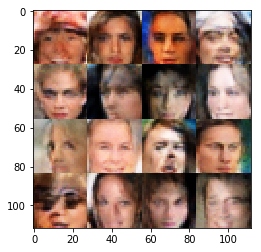

Epoch 3/8... Discriminator Loss: 1.5008 ... Generator Loss: 1.2585
Epoch 3/8... Discriminator Loss: 1.4665 ... Generator Loss: 0.4284
Epoch 3/8... Discriminator Loss: 1.6187 ... Generator Loss: 0.3661
Epoch 3/8... Discriminator Loss: 1.3286 ... Generator Loss: 0.8026
Epoch 3/8... Discriminator Loss: 1.6293 ... Generator Loss: 0.3308
Epoch 3/8... Discriminator Loss: 1.0965 ... Generator Loss: 0.9816
Epoch 3/8... Discriminator Loss: 0.9041 ... Generator Loss: 1.1961
Epoch 3/8... Discriminator Loss: 1.2668 ... Generator Loss: 0.6842
Epoch 3/8... Discriminator Loss: 1.1714 ... Generator Loss: 1.2713
Epoch 3/8... Discriminator Loss: 1.2512 ... Generator Loss: 0.9361


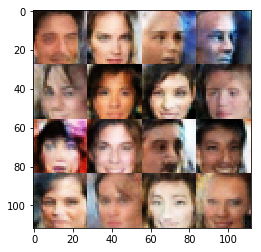

Epoch 3/8... Discriminator Loss: 1.5715 ... Generator Loss: 0.4807
Epoch 3/8... Discriminator Loss: 1.3530 ... Generator Loss: 0.7609
Epoch 3/8... Discriminator Loss: 1.2458 ... Generator Loss: 0.6698
Epoch 3/8... Discriminator Loss: 0.9331 ... Generator Loss: 0.9104
Epoch 3/8... Discriminator Loss: 1.3857 ... Generator Loss: 0.4277
Epoch 3/8... Discriminator Loss: 0.9363 ... Generator Loss: 1.1530
Epoch 3/8... Discriminator Loss: 0.9992 ... Generator Loss: 1.4078
Epoch 3/8... Discriminator Loss: 0.9922 ... Generator Loss: 0.8451
Epoch 3/8... Discriminator Loss: 1.1936 ... Generator Loss: 0.8835
Epoch 3/8... Discriminator Loss: 1.1945 ... Generator Loss: 1.4125


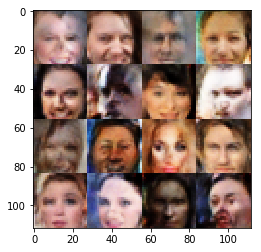

Epoch 3/8... Discriminator Loss: 0.9052 ... Generator Loss: 1.3220
Epoch 3/8... Discriminator Loss: 1.3330 ... Generator Loss: 1.1546
Epoch 3/8... Discriminator Loss: 1.6098 ... Generator Loss: 0.3450
Epoch 3/8... Discriminator Loss: 1.2135 ... Generator Loss: 0.9494
Epoch 3/8... Discriminator Loss: 1.0262 ... Generator Loss: 0.8620
Epoch 3/8... Discriminator Loss: 1.3482 ... Generator Loss: 1.0766
Epoch 3/8... Discriminator Loss: 0.9510 ... Generator Loss: 1.4453
Epoch 3/8... Discriminator Loss: 1.2321 ... Generator Loss: 0.9580
Epoch 3/8... Discriminator Loss: 1.0736 ... Generator Loss: 1.1436
Epoch 3/8... Discriminator Loss: 1.3620 ... Generator Loss: 0.5571


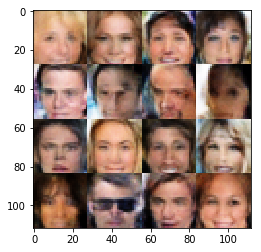

Epoch 3/8... Discriminator Loss: 1.1991 ... Generator Loss: 0.5218
Epoch 3/8... Discriminator Loss: 1.2556 ... Generator Loss: 0.7211
Epoch 3/8... Discriminator Loss: 0.9702 ... Generator Loss: 0.9506
Epoch 3/8... Discriminator Loss: 1.2987 ... Generator Loss: 0.9629
Epoch 3/8... Discriminator Loss: 1.0736 ... Generator Loss: 0.7628
Epoch 3/8... Discriminator Loss: 1.3905 ... Generator Loss: 0.4649
Epoch 3/8... Discriminator Loss: 1.1638 ... Generator Loss: 0.8271
Epoch 3/8... Discriminator Loss: 1.0115 ... Generator Loss: 1.1398
Epoch 3/8... Discriminator Loss: 1.2092 ... Generator Loss: 0.6368
Epoch 3/8... Discriminator Loss: 1.2912 ... Generator Loss: 0.5038


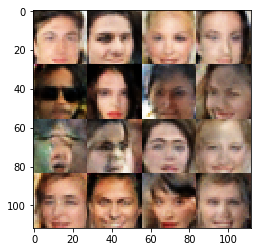

Epoch 3/8... Discriminator Loss: 1.2815 ... Generator Loss: 0.8270
Epoch 3/8... Discriminator Loss: 1.2849 ... Generator Loss: 0.8596
Epoch 3/8... Discriminator Loss: 1.2217 ... Generator Loss: 0.8257
Epoch 3/8... Discriminator Loss: 1.0995 ... Generator Loss: 1.0537
Epoch 3/8... Discriminator Loss: 1.2603 ... Generator Loss: 0.6172
Epoch 3/8... Discriminator Loss: 1.5148 ... Generator Loss: 0.4578
Epoch 3/8... Discriminator Loss: 1.2369 ... Generator Loss: 1.1320
Epoch 3/8... Discriminator Loss: 1.1201 ... Generator Loss: 0.8995
Epoch 3/8... Discriminator Loss: 1.4797 ... Generator Loss: 0.4285
Epoch 3/8... Discriminator Loss: 1.3426 ... Generator Loss: 1.0610


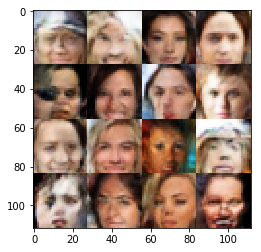

Epoch 3/8... Discriminator Loss: 1.0658 ... Generator Loss: 1.6751
Epoch 3/8... Discriminator Loss: 1.0974 ... Generator Loss: 0.9798
Epoch 3/8... Discriminator Loss: 0.9627 ... Generator Loss: 0.8774
Epoch 3/8... Discriminator Loss: 1.3079 ... Generator Loss: 0.9996
Epoch 3/8... Discriminator Loss: 0.8187 ... Generator Loss: 1.2486
Epoch 3/8... Discriminator Loss: 1.3362 ... Generator Loss: 0.7213
Epoch 3/8... Discriminator Loss: 1.2067 ... Generator Loss: 1.2306
Epoch 3/8... Discriminator Loss: 1.0759 ... Generator Loss: 0.7713
Epoch 3/8... Discriminator Loss: 1.4656 ... Generator Loss: 0.6081
Epoch 3/8... Discriminator Loss: 0.9330 ... Generator Loss: 1.3114


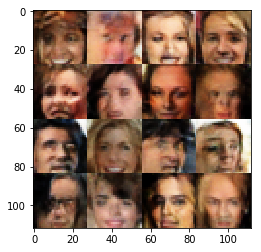

Epoch 3/8... Discriminator Loss: 1.2730 ... Generator Loss: 0.9725
Epoch 3/8... Discriminator Loss: 1.2725 ... Generator Loss: 1.2642
Epoch 3/8... Discriminator Loss: 0.9515 ... Generator Loss: 1.6269
Epoch 3/8... Discriminator Loss: 1.3187 ... Generator Loss: 1.1317
Epoch 3/8... Discriminator Loss: 1.6285 ... Generator Loss: 1.1618
Epoch 3/8... Discriminator Loss: 1.4587 ... Generator Loss: 0.4045
Epoch 3/8... Discriminator Loss: 1.3048 ... Generator Loss: 0.5926
Epoch 3/8... Discriminator Loss: 1.0661 ... Generator Loss: 0.8905
Epoch 3/8... Discriminator Loss: 1.1656 ... Generator Loss: 0.8101
Epoch 3/8... Discriminator Loss: 1.0401 ... Generator Loss: 0.9005


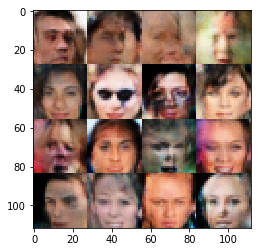

Epoch 3/8... Discriminator Loss: 1.4442 ... Generator Loss: 0.4566
Epoch 3/8... Discriminator Loss: 1.3503 ... Generator Loss: 0.4895
Epoch 3/8... Discriminator Loss: 1.2005 ... Generator Loss: 0.6092
Epoch 3/8... Discriminator Loss: 1.3303 ... Generator Loss: 0.4565
Epoch 3/8... Discriminator Loss: 1.1613 ... Generator Loss: 1.4999
Epoch 3/8... Discriminator Loss: 1.1952 ... Generator Loss: 0.6239
Epoch 3/8... Discriminator Loss: 1.3075 ... Generator Loss: 0.6182
Epoch 3/8... Discriminator Loss: 1.3722 ... Generator Loss: 0.5144
Epoch 3/8... Discriminator Loss: 1.2411 ... Generator Loss: 0.6961
Epoch 3/8... Discriminator Loss: 1.2872 ... Generator Loss: 0.8251


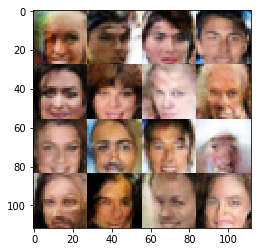

Epoch 3/8... Discriminator Loss: 1.4396 ... Generator Loss: 0.5420
Epoch 3/8... Discriminator Loss: 1.4707 ... Generator Loss: 0.4865
Epoch 3/8... Discriminator Loss: 1.3835 ... Generator Loss: 0.4918
Epoch 3/8... Discriminator Loss: 1.1578 ... Generator Loss: 0.8357
Epoch 3/8... Discriminator Loss: 1.3025 ... Generator Loss: 1.1170
Epoch 3/8... Discriminator Loss: 1.5489 ... Generator Loss: 1.3175
Epoch 3/8... Discriminator Loss: 1.2894 ... Generator Loss: 0.9160
Epoch 3/8... Discriminator Loss: 1.2993 ... Generator Loss: 0.9502
Epoch 3/8... Discriminator Loss: 1.4420 ... Generator Loss: 1.1423
Epoch 3/8... Discriminator Loss: 1.5186 ... Generator Loss: 0.4427


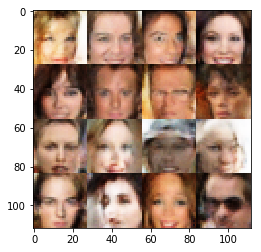

Epoch 3/8... Discriminator Loss: 1.3999 ... Generator Loss: 0.5305
Epoch 3/8... Discriminator Loss: 1.0469 ... Generator Loss: 0.7436
Epoch 3/8... Discriminator Loss: 1.2460 ... Generator Loss: 0.6472
Epoch 3/8... Discriminator Loss: 1.5370 ... Generator Loss: 1.1959
Epoch 3/8... Discriminator Loss: 1.1732 ... Generator Loss: 0.8687
Epoch 3/8... Discriminator Loss: 1.2878 ... Generator Loss: 0.5150
Epoch 3/8... Discriminator Loss: 1.4588 ... Generator Loss: 0.4655
Epoch 3/8... Discriminator Loss: 1.2264 ... Generator Loss: 0.8341
Epoch 3/8... Discriminator Loss: 1.1824 ... Generator Loss: 1.1834
Epoch 3/8... Discriminator Loss: 1.2493 ... Generator Loss: 0.6037


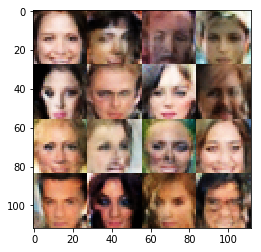

Epoch 3/8... Discriminator Loss: 1.1248 ... Generator Loss: 1.1689
Epoch 3/8... Discriminator Loss: 0.9310 ... Generator Loss: 1.0801
Epoch 3/8... Discriminator Loss: 1.4012 ... Generator Loss: 1.4061
Epoch 3/8... Discriminator Loss: 1.0551 ... Generator Loss: 1.1836
Epoch 3/8... Discriminator Loss: 1.4043 ... Generator Loss: 0.8521
Epoch 3/8... Discriminator Loss: 1.1014 ... Generator Loss: 0.7661
Epoch 3/8... Discriminator Loss: 1.6562 ... Generator Loss: 0.3576
Epoch 3/8... Discriminator Loss: 1.5617 ... Generator Loss: 1.7370
Epoch 3/8... Discriminator Loss: 1.1703 ... Generator Loss: 1.0256
Epoch 3/8... Discriminator Loss: 1.5229 ... Generator Loss: 0.4457


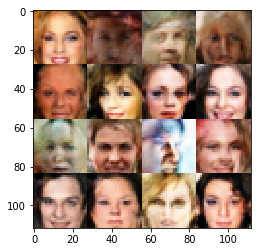

Epoch 3/8... Discriminator Loss: 1.5253 ... Generator Loss: 0.4120
Epoch 3/8... Discriminator Loss: 1.2238 ... Generator Loss: 0.8004
Epoch 3/8... Discriminator Loss: 1.2061 ... Generator Loss: 1.0595
Epoch 3/8... Discriminator Loss: 1.2460 ... Generator Loss: 0.8179
Epoch 3/8... Discriminator Loss: 1.2104 ... Generator Loss: 0.6571
Epoch 3/8... Discriminator Loss: 1.4297 ... Generator Loss: 0.5698
Epoch 3/8... Discriminator Loss: 1.3679 ... Generator Loss: 0.5246
Epoch 3/8... Discriminator Loss: 1.3550 ... Generator Loss: 0.5333
Epoch 3/8... Discriminator Loss: 1.3130 ... Generator Loss: 0.5325
Epoch 3/8... Discriminator Loss: 1.6986 ... Generator Loss: 1.3741


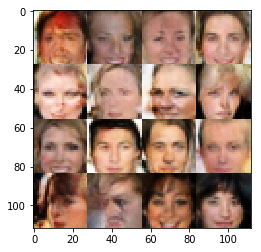

Epoch 3/8... Discriminator Loss: 1.2691 ... Generator Loss: 0.7163
Epoch 3/8... Discriminator Loss: 1.3350 ... Generator Loss: 0.6459
Epoch 3/8... Discriminator Loss: 1.1646 ... Generator Loss: 0.7624
Epoch 3/8... Discriminator Loss: 1.1649 ... Generator Loss: 0.8398
Epoch 3/8... Discriminator Loss: 1.2615 ... Generator Loss: 0.6570
Epoch 3/8... Discriminator Loss: 1.4616 ... Generator Loss: 0.9122
Epoch 3/8... Discriminator Loss: 1.3787 ... Generator Loss: 0.6051
Epoch 3/8... Discriminator Loss: 1.2145 ... Generator Loss: 1.1434
Epoch 3/8... Discriminator Loss: 1.2297 ... Generator Loss: 0.8843
Epoch 3/8... Discriminator Loss: 1.5853 ... Generator Loss: 0.4316


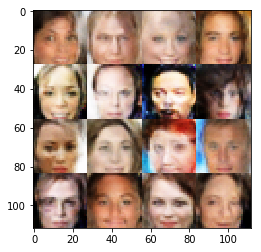

Epoch 3/8... Discriminator Loss: 1.2681 ... Generator Loss: 1.2294
Epoch 3/8... Discriminator Loss: 1.4464 ... Generator Loss: 0.4671
Epoch 3/8... Discriminator Loss: 1.4815 ... Generator Loss: 0.4571
Epoch 3/8... Discriminator Loss: 1.1658 ... Generator Loss: 1.0369
Epoch 3/8... Discriminator Loss: 1.2036 ... Generator Loss: 0.8953
Epoch 3/8... Discriminator Loss: 0.8474 ... Generator Loss: 0.9929
Epoch 3/8... Discriminator Loss: 1.1382 ... Generator Loss: 0.8790
Epoch 3/8... Discriminator Loss: 1.5974 ... Generator Loss: 1.3903
Epoch 3/8... Discriminator Loss: 1.2842 ... Generator Loss: 0.9234
Epoch 3/8... Discriminator Loss: 1.2608 ... Generator Loss: 0.7192


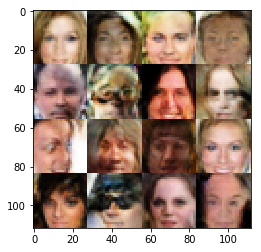

Epoch 3/8... Discriminator Loss: 1.3165 ... Generator Loss: 1.1733
Epoch 3/8... Discriminator Loss: 1.3208 ... Generator Loss: 0.5963
Epoch 3/8... Discriminator Loss: 1.3461 ... Generator Loss: 0.5643
Epoch 3/8... Discriminator Loss: 0.9745 ... Generator Loss: 1.0923
Epoch 3/8... Discriminator Loss: 1.2443 ... Generator Loss: 0.7457
Epoch 3/8... Discriminator Loss: 1.2296 ... Generator Loss: 1.0255
Epoch 3/8... Discriminator Loss: 1.4937 ... Generator Loss: 1.2625
Epoch 3/8... Discriminator Loss: 1.1420 ... Generator Loss: 0.8006
Epoch 3/8... Discriminator Loss: 1.4907 ... Generator Loss: 0.4600
Epoch 3/8... Discriminator Loss: 0.8010 ... Generator Loss: 2.1001


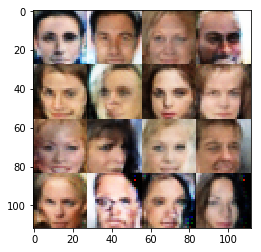

Epoch 3/8... Discriminator Loss: 1.2409 ... Generator Loss: 0.7177
Epoch 3/8... Discriminator Loss: 1.3533 ... Generator Loss: 1.2007
Epoch 3/8... Discriminator Loss: 1.5017 ... Generator Loss: 1.3657
Epoch 3/8... Discriminator Loss: 1.3100 ... Generator Loss: 0.6773
Epoch 3/8... Discriminator Loss: 1.0515 ... Generator Loss: 1.4388
Epoch 3/8... Discriminator Loss: 1.3362 ... Generator Loss: 1.1036
Epoch 3/8... Discriminator Loss: 1.3088 ... Generator Loss: 0.5802
Epoch 3/8... Discriminator Loss: 1.3857 ... Generator Loss: 0.4671
Epoch 3/8... Discriminator Loss: 1.3209 ... Generator Loss: 0.7759
Epoch 3/8... Discriminator Loss: 1.4428 ... Generator Loss: 0.4241


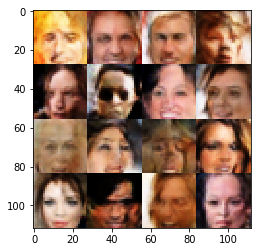

Epoch 3/8... Discriminator Loss: 1.3585 ... Generator Loss: 0.5209
Epoch 3/8... Discriminator Loss: 1.3385 ... Generator Loss: 1.0705
Epoch 3/8... Discriminator Loss: 1.3961 ... Generator Loss: 0.4539
Epoch 3/8... Discriminator Loss: 1.2309 ... Generator Loss: 1.2058
Epoch 3/8... Discriminator Loss: 1.4733 ... Generator Loss: 1.4352
Epoch 3/8... Discriminator Loss: 1.2056 ... Generator Loss: 1.1610
Epoch 3/8... Discriminator Loss: 1.3429 ... Generator Loss: 0.5684
Epoch 3/8... Discriminator Loss: 1.2099 ... Generator Loss: 0.9919
Epoch 3/8... Discriminator Loss: 1.2754 ... Generator Loss: 0.5813
Epoch 3/8... Discriminator Loss: 1.3219 ... Generator Loss: 1.2063


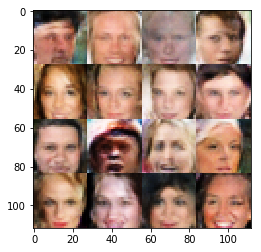

Epoch 3/8... Discriminator Loss: 0.8457 ... Generator Loss: 1.2030
Epoch 3/8... Discriminator Loss: 1.0068 ... Generator Loss: 1.2460
Epoch 3/8... Discriminator Loss: 1.2744 ... Generator Loss: 1.1635
Epoch 3/8... Discriminator Loss: 1.3649 ... Generator Loss: 0.4385
Epoch 3/8... Discriminator Loss: 1.3018 ... Generator Loss: 1.0149
Epoch 3/8... Discriminator Loss: 1.3514 ... Generator Loss: 0.6874
Epoch 3/8... Discriminator Loss: 1.4179 ... Generator Loss: 0.6078
Epoch 3/8... Discriminator Loss: 1.0111 ... Generator Loss: 1.0051
Epoch 3/8... Discriminator Loss: 1.3485 ... Generator Loss: 1.1085
Epoch 3/8... Discriminator Loss: 1.2303 ... Generator Loss: 1.0849


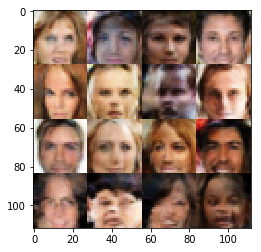

Epoch 3/8... Discriminator Loss: 1.4963 ... Generator Loss: 0.4210
Epoch 3/8... Discriminator Loss: 1.4122 ... Generator Loss: 0.4688
Epoch 3/8... Discriminator Loss: 1.3993 ... Generator Loss: 0.5584
Epoch 3/8... Discriminator Loss: 1.1274 ... Generator Loss: 0.7444
Epoch 3/8... Discriminator Loss: 1.0999 ... Generator Loss: 0.8652
Epoch 3/8... Discriminator Loss: 1.2204 ... Generator Loss: 0.8863
Epoch 3/8... Discriminator Loss: 1.2691 ... Generator Loss: 0.7980
Epoch 3/8... Discriminator Loss: 1.2812 ... Generator Loss: 0.7697
Epoch 3/8... Discriminator Loss: 0.9537 ... Generator Loss: 0.9858
Epoch 3/8... Discriminator Loss: 1.1509 ... Generator Loss: 0.8525


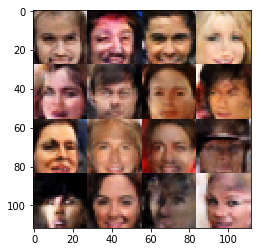

Epoch 3/8... Discriminator Loss: 1.0230 ... Generator Loss: 1.4609
Epoch 3/8... Discriminator Loss: 1.3552 ... Generator Loss: 0.6393
Epoch 3/8... Discriminator Loss: 1.5560 ... Generator Loss: 1.2108
Epoch 3/8... Discriminator Loss: 1.1906 ... Generator Loss: 0.7899
Epoch 3/8... Discriminator Loss: 1.2332 ... Generator Loss: 0.8104
Epoch 3/8... Discriminator Loss: 1.1252 ... Generator Loss: 0.8486
Epoch 3/8... Discriminator Loss: 1.4689 ... Generator Loss: 1.3157
Epoch 3/8... Discriminator Loss: 1.0077 ... Generator Loss: 1.1467
Epoch 3/8... Discriminator Loss: 1.2710 ... Generator Loss: 0.7700
Epoch 3/8... Discriminator Loss: 1.3457 ... Generator Loss: 1.1307


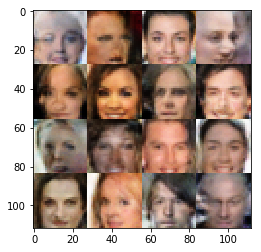

Epoch 3/8... Discriminator Loss: 1.2458 ... Generator Loss: 0.8319
Epoch 3/8... Discriminator Loss: 1.5554 ... Generator Loss: 1.3138
Epoch 3/8... Discriminator Loss: 1.2105 ... Generator Loss: 0.8000
Epoch 3/8... Discriminator Loss: 1.4549 ... Generator Loss: 0.5549
Epoch 3/8... Discriminator Loss: 1.2783 ... Generator Loss: 0.6796
Epoch 3/8... Discriminator Loss: 1.3093 ... Generator Loss: 0.5242
Epoch 3/8... Discriminator Loss: 1.2221 ... Generator Loss: 0.7339
Epoch 3/8... Discriminator Loss: 1.3832 ... Generator Loss: 0.6947
Epoch 3/8... Discriminator Loss: 1.4110 ... Generator Loss: 0.4667
Epoch 3/8... Discriminator Loss: 1.5041 ... Generator Loss: 1.3706


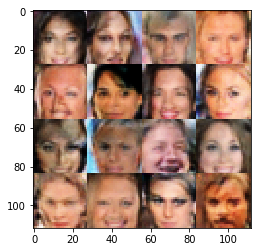

Epoch 3/8... Discriminator Loss: 1.1559 ... Generator Loss: 1.0664
Epoch 3/8... Discriminator Loss: 1.1914 ... Generator Loss: 1.0074
Epoch 3/8... Discriminator Loss: 1.2820 ... Generator Loss: 1.0003
Epoch 3/8... Discriminator Loss: 1.7097 ... Generator Loss: 1.5717
Epoch 3/8... Discriminator Loss: 1.1982 ... Generator Loss: 0.8185
Epoch 3/8... Discriminator Loss: 1.3383 ... Generator Loss: 1.2976
Epoch 3/8... Discriminator Loss: 1.3599 ... Generator Loss: 0.8354
Epoch 3/8... Discriminator Loss: 1.2856 ... Generator Loss: 0.6547
Epoch 3/8... Discriminator Loss: 1.2996 ... Generator Loss: 1.1835
Epoch 3/8... Discriminator Loss: 1.3867 ... Generator Loss: 0.9499


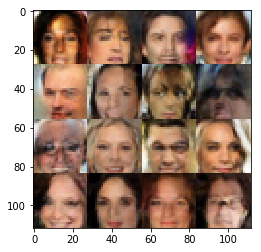

Epoch 3/8... Discriminator Loss: 1.2086 ... Generator Loss: 1.1048
Epoch 3/8... Discriminator Loss: 1.3386 ... Generator Loss: 0.5679
Epoch 3/8... Discriminator Loss: 1.3132 ... Generator Loss: 0.7781
Epoch 3/8... Discriminator Loss: 1.2891 ... Generator Loss: 1.0187
Epoch 3/8... Discriminator Loss: 1.3579 ... Generator Loss: 0.6922
Epoch 3/8... Discriminator Loss: 1.0731 ... Generator Loss: 0.8284
Epoch 3/8... Discriminator Loss: 1.3264 ... Generator Loss: 0.5466
Epoch 3/8... Discriminator Loss: 1.3643 ... Generator Loss: 0.7884
Epoch 3/8... Discriminator Loss: 1.2392 ... Generator Loss: 0.7488
Epoch 3/8... Discriminator Loss: 1.2682 ... Generator Loss: 0.6328


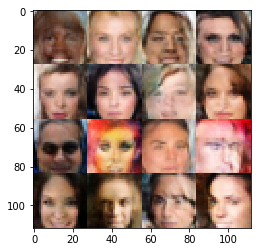

Epoch 3/8... Discriminator Loss: 1.3971 ... Generator Loss: 1.1275
Epoch 3/8... Discriminator Loss: 1.2098 ... Generator Loss: 0.8169
Epoch 3/8... Discriminator Loss: 1.2768 ... Generator Loss: 0.6709
Epoch 3/8... Discriminator Loss: 1.2352 ... Generator Loss: 0.6930
Epoch 3/8... Discriminator Loss: 1.2453 ... Generator Loss: 1.2370
Epoch 3/8... Discriminator Loss: 1.4104 ... Generator Loss: 1.2595
Epoch 3/8... Discriminator Loss: 1.1485 ... Generator Loss: 0.8936
Epoch 3/8... Discriminator Loss: 1.3246 ... Generator Loss: 0.5909
Epoch 3/8... Discriminator Loss: 1.4658 ... Generator Loss: 0.9471
Epoch 3/8... Discriminator Loss: 1.3820 ... Generator Loss: 1.1743


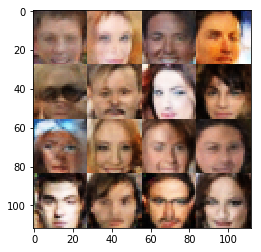

Epoch 3/8... Discriminator Loss: 1.3934 ... Generator Loss: 0.9808
Epoch 3/8... Discriminator Loss: 1.4515 ... Generator Loss: 1.2774
Epoch 3/8... Discriminator Loss: 1.2426 ... Generator Loss: 1.0355
Epoch 3/8... Discriminator Loss: 1.3005 ... Generator Loss: 1.3780
Epoch 3/8... Discriminator Loss: 1.2567 ... Generator Loss: 0.7097
Epoch 3/8... Discriminator Loss: 1.4415 ... Generator Loss: 0.5152
Epoch 3/8... Discriminator Loss: 1.4358 ... Generator Loss: 0.5537
Epoch 3/8... Discriminator Loss: 1.2294 ... Generator Loss: 0.5939
Epoch 3/8... Discriminator Loss: 1.2297 ... Generator Loss: 1.0706
Epoch 3/8... Discriminator Loss: 1.2339 ... Generator Loss: 0.7543


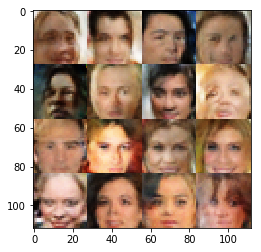

Epoch 3/8... Discriminator Loss: 1.4666 ... Generator Loss: 1.1227
Epoch 3/8... Discriminator Loss: 1.2551 ... Generator Loss: 1.0302
Epoch 3/8... Discriminator Loss: 1.4075 ... Generator Loss: 0.6889
Epoch 3/8... Discriminator Loss: 1.2487 ... Generator Loss: 0.8734
Epoch 3/8... Discriminator Loss: 1.1924 ... Generator Loss: 1.2342
Epoch 3/8... Discriminator Loss: 1.2281 ... Generator Loss: 0.6618
Epoch 3/8... Discriminator Loss: 1.3030 ... Generator Loss: 0.6177
Epoch 3/8... Discriminator Loss: 1.5069 ... Generator Loss: 1.2611
Epoch 3/8... Discriminator Loss: 1.3345 ... Generator Loss: 0.5525


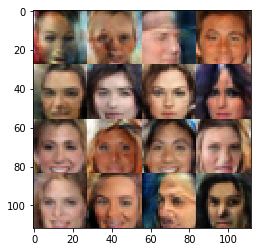

Epoch 4/8... Discriminator Loss: 1.3307 ... Generator Loss: 0.5843


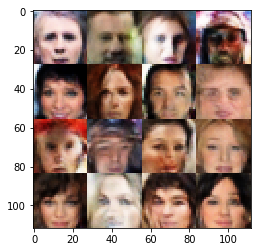

Epoch 4/8... Discriminator Loss: 1.2064 ... Generator Loss: 1.0431
Epoch 4/8... Discriminator Loss: 1.4097 ... Generator Loss: 0.5303
Epoch 4/8... Discriminator Loss: 1.2308 ... Generator Loss: 0.7902
Epoch 4/8... Discriminator Loss: 1.3541 ... Generator Loss: 0.8035
Epoch 4/8... Discriminator Loss: 1.3176 ... Generator Loss: 0.7887
Epoch 4/8... Discriminator Loss: 1.1573 ... Generator Loss: 0.9654
Epoch 4/8... Discriminator Loss: 1.4575 ... Generator Loss: 0.5105
Epoch 4/8... Discriminator Loss: 1.3924 ... Generator Loss: 1.0267
Epoch 4/8... Discriminator Loss: 1.2724 ... Generator Loss: 1.0375
Epoch 4/8... Discriminator Loss: 1.3309 ... Generator Loss: 0.9044


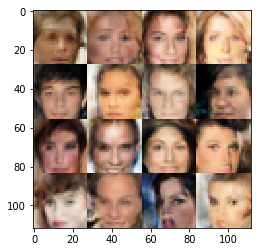

Epoch 4/8... Discriminator Loss: 1.2024 ... Generator Loss: 0.8959
Epoch 4/8... Discriminator Loss: 1.3943 ... Generator Loss: 0.4990
Epoch 4/8... Discriminator Loss: 1.3168 ... Generator Loss: 0.6151
Epoch 4/8... Discriminator Loss: 1.1048 ... Generator Loss: 0.7643
Epoch 4/8... Discriminator Loss: 1.4088 ... Generator Loss: 0.4418
Epoch 4/8... Discriminator Loss: 1.3752 ... Generator Loss: 0.8310
Epoch 4/8... Discriminator Loss: 1.3674 ... Generator Loss: 0.9515
Epoch 4/8... Discriminator Loss: 1.3016 ... Generator Loss: 0.8762
Epoch 4/8... Discriminator Loss: 1.5703 ... Generator Loss: 0.3947
Epoch 4/8... Discriminator Loss: 1.4014 ... Generator Loss: 0.7553


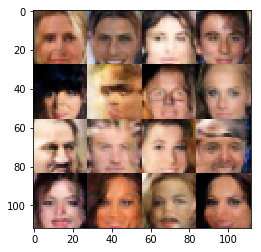

Epoch 4/8... Discriminator Loss: 1.3866 ... Generator Loss: 1.1760
Epoch 4/8... Discriminator Loss: 1.3107 ... Generator Loss: 0.7078
Epoch 4/8... Discriminator Loss: 1.3488 ... Generator Loss: 0.5971
Epoch 4/8... Discriminator Loss: 1.3265 ... Generator Loss: 0.8956
Epoch 4/8... Discriminator Loss: 1.1780 ... Generator Loss: 0.8470
Epoch 4/8... Discriminator Loss: 1.1964 ... Generator Loss: 0.9218
Epoch 4/8... Discriminator Loss: 1.3187 ... Generator Loss: 0.7036
Epoch 4/8... Discriminator Loss: 1.2727 ... Generator Loss: 0.6433
Epoch 4/8... Discriminator Loss: 1.2234 ... Generator Loss: 0.6479
Epoch 4/8... Discriminator Loss: 1.3189 ... Generator Loss: 0.8275


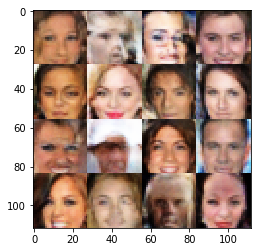

Epoch 4/8... Discriminator Loss: 1.2325 ... Generator Loss: 1.0979
Epoch 4/8... Discriminator Loss: 1.4249 ... Generator Loss: 0.5618
Epoch 4/8... Discriminator Loss: 1.3512 ... Generator Loss: 1.0461
Epoch 4/8... Discriminator Loss: 1.2254 ... Generator Loss: 0.8418
Epoch 4/8... Discriminator Loss: 1.1922 ... Generator Loss: 0.8097
Epoch 4/8... Discriminator Loss: 1.4862 ... Generator Loss: 0.4925
Epoch 4/8... Discriminator Loss: 1.2793 ... Generator Loss: 0.6106
Epoch 4/8... Discriminator Loss: 1.3110 ... Generator Loss: 0.6176
Epoch 4/8... Discriminator Loss: 1.2237 ... Generator Loss: 0.7126
Epoch 4/8... Discriminator Loss: 1.3591 ... Generator Loss: 1.0376


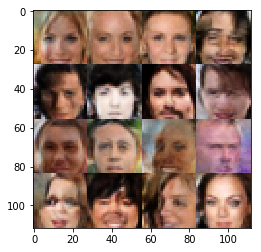

Epoch 4/8... Discriminator Loss: 1.3591 ... Generator Loss: 0.7912
Epoch 4/8... Discriminator Loss: 1.0265 ... Generator Loss: 0.9505
Epoch 4/8... Discriminator Loss: 1.3280 ... Generator Loss: 0.6282
Epoch 4/8... Discriminator Loss: 1.0120 ... Generator Loss: 0.9450
Epoch 4/8... Discriminator Loss: 1.3104 ... Generator Loss: 0.5377
Epoch 4/8... Discriminator Loss: 1.2740 ... Generator Loss: 0.7786
Epoch 4/8... Discriminator Loss: 1.4273 ... Generator Loss: 1.1687
Epoch 4/8... Discriminator Loss: 1.3442 ... Generator Loss: 0.5573
Epoch 4/8... Discriminator Loss: 1.1754 ... Generator Loss: 0.8710
Epoch 4/8... Discriminator Loss: 1.2344 ... Generator Loss: 0.6683


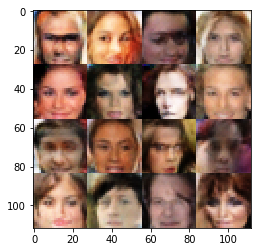

Epoch 4/8... Discriminator Loss: 1.1897 ... Generator Loss: 0.7749
Epoch 4/8... Discriminator Loss: 1.2414 ... Generator Loss: 0.9349
Epoch 4/8... Discriminator Loss: 1.1856 ... Generator Loss: 0.7181
Epoch 4/8... Discriminator Loss: 1.2515 ... Generator Loss: 0.6611
Epoch 4/8... Discriminator Loss: 1.6521 ... Generator Loss: 0.3951
Epoch 4/8... Discriminator Loss: 1.2313 ... Generator Loss: 0.7250
Epoch 4/8... Discriminator Loss: 1.1675 ... Generator Loss: 0.7019
Epoch 4/8... Discriminator Loss: 1.2703 ... Generator Loss: 0.7855
Epoch 4/8... Discriminator Loss: 1.3862 ... Generator Loss: 0.5460
Epoch 4/8... Discriminator Loss: 1.2821 ... Generator Loss: 0.5679


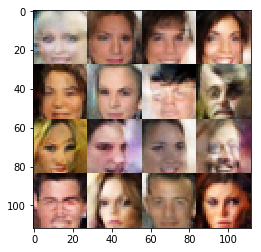

Epoch 4/8... Discriminator Loss: 1.2645 ... Generator Loss: 0.6741
Epoch 4/8... Discriminator Loss: 1.2750 ... Generator Loss: 0.8934
Epoch 4/8... Discriminator Loss: 1.2073 ... Generator Loss: 0.7984
Epoch 4/8... Discriminator Loss: 1.2428 ... Generator Loss: 0.7435
Epoch 4/8... Discriminator Loss: 1.1698 ... Generator Loss: 0.8595
Epoch 4/8... Discriminator Loss: 1.4737 ... Generator Loss: 0.8910
Epoch 4/8... Discriminator Loss: 0.9085 ... Generator Loss: 1.1846
Epoch 4/8... Discriminator Loss: 1.4756 ... Generator Loss: 0.6585
Epoch 4/8... Discriminator Loss: 1.3243 ... Generator Loss: 0.5326
Epoch 4/8... Discriminator Loss: 1.1804 ... Generator Loss: 0.7962


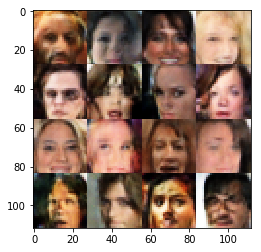

Epoch 4/8... Discriminator Loss: 1.2380 ... Generator Loss: 0.6908
Epoch 4/8... Discriminator Loss: 1.3565 ... Generator Loss: 1.2705
Epoch 4/8... Discriminator Loss: 1.1064 ... Generator Loss: 0.7653
Epoch 4/8... Discriminator Loss: 1.3356 ... Generator Loss: 1.2305
Epoch 4/8... Discriminator Loss: 1.2141 ... Generator Loss: 0.9984
Epoch 4/8... Discriminator Loss: 1.3190 ... Generator Loss: 0.8202
Epoch 4/8... Discriminator Loss: 1.3521 ... Generator Loss: 0.9750
Epoch 4/8... Discriminator Loss: 1.2181 ... Generator Loss: 0.6683
Epoch 4/8... Discriminator Loss: 1.2963 ... Generator Loss: 0.8695
Epoch 4/8... Discriminator Loss: 1.2449 ... Generator Loss: 0.6682


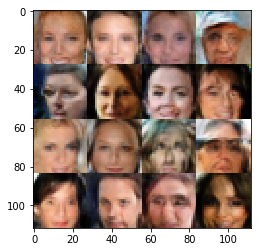

Epoch 4/8... Discriminator Loss: 1.2261 ... Generator Loss: 0.6603
Epoch 4/8... Discriminator Loss: 1.2088 ... Generator Loss: 0.6598
Epoch 4/8... Discriminator Loss: 1.2705 ... Generator Loss: 1.0157
Epoch 4/8... Discriminator Loss: 1.1553 ... Generator Loss: 0.8890
Epoch 4/8... Discriminator Loss: 1.3234 ... Generator Loss: 0.7926
Epoch 4/8... Discriminator Loss: 0.9960 ... Generator Loss: 1.1800
Epoch 4/8... Discriminator Loss: 1.2361 ... Generator Loss: 0.7327
Epoch 4/8... Discriminator Loss: 1.1024 ... Generator Loss: 0.8596
Epoch 4/8... Discriminator Loss: 1.5272 ... Generator Loss: 0.4059
Epoch 4/8... Discriminator Loss: 1.3589 ... Generator Loss: 0.5396


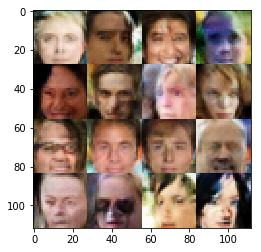

Epoch 4/8... Discriminator Loss: 1.1469 ... Generator Loss: 0.8114
Epoch 4/8... Discriminator Loss: 1.1995 ... Generator Loss: 0.7568
Epoch 4/8... Discriminator Loss: 1.2898 ... Generator Loss: 0.6806
Epoch 4/8... Discriminator Loss: 1.4925 ... Generator Loss: 0.4397
Epoch 4/8... Discriminator Loss: 1.1919 ... Generator Loss: 0.7582
Epoch 4/8... Discriminator Loss: 1.3131 ... Generator Loss: 1.1028
Epoch 4/8... Discriminator Loss: 1.2238 ... Generator Loss: 0.8317
Epoch 4/8... Discriminator Loss: 1.1457 ... Generator Loss: 0.9670
Epoch 4/8... Discriminator Loss: 1.2705 ... Generator Loss: 0.6615
Epoch 4/8... Discriminator Loss: 1.1937 ... Generator Loss: 0.9729


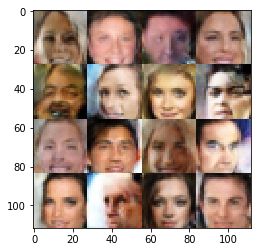

Epoch 4/8... Discriminator Loss: 1.1948 ... Generator Loss: 0.7371
Epoch 4/8... Discriminator Loss: 1.0839 ... Generator Loss: 1.1288
Epoch 4/8... Discriminator Loss: 1.3447 ... Generator Loss: 0.9645
Epoch 4/8... Discriminator Loss: 1.4297 ... Generator Loss: 1.2098
Epoch 4/8... Discriminator Loss: 1.3938 ... Generator Loss: 0.4783
Epoch 4/8... Discriminator Loss: 1.2174 ... Generator Loss: 1.0311
Epoch 4/8... Discriminator Loss: 1.2877 ... Generator Loss: 0.8425
Epoch 4/8... Discriminator Loss: 1.2775 ... Generator Loss: 0.8024
Epoch 4/8... Discriminator Loss: 1.2443 ... Generator Loss: 0.6718
Epoch 4/8... Discriminator Loss: 1.3713 ... Generator Loss: 1.0695


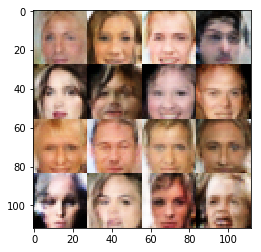

Epoch 4/8... Discriminator Loss: 1.2193 ... Generator Loss: 0.9104
Epoch 4/8... Discriminator Loss: 1.3003 ... Generator Loss: 1.1141
Epoch 4/8... Discriminator Loss: 1.2841 ... Generator Loss: 0.8580
Epoch 4/8... Discriminator Loss: 1.1099 ... Generator Loss: 1.0495
Epoch 4/8... Discriminator Loss: 1.2408 ... Generator Loss: 0.5940
Epoch 4/8... Discriminator Loss: 1.2425 ... Generator Loss: 1.5133
Epoch 4/8... Discriminator Loss: 1.3072 ... Generator Loss: 0.7079
Epoch 4/8... Discriminator Loss: 1.3283 ... Generator Loss: 0.6194
Epoch 4/8... Discriminator Loss: 1.3243 ... Generator Loss: 0.7758
Epoch 4/8... Discriminator Loss: 1.2848 ... Generator Loss: 0.9631


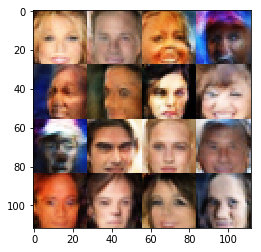

Epoch 4/8... Discriminator Loss: 1.2059 ... Generator Loss: 0.6367
Epoch 4/8... Discriminator Loss: 1.5881 ... Generator Loss: 0.4009
Epoch 4/8... Discriminator Loss: 1.3496 ... Generator Loss: 0.8825
Epoch 4/8... Discriminator Loss: 1.2379 ... Generator Loss: 0.9599
Epoch 4/8... Discriminator Loss: 1.4398 ... Generator Loss: 1.0858
Epoch 4/8... Discriminator Loss: 1.1756 ... Generator Loss: 0.7816
Epoch 4/8... Discriminator Loss: 1.3115 ... Generator Loss: 0.9472
Epoch 4/8... Discriminator Loss: 1.4691 ... Generator Loss: 1.1094
Epoch 4/8... Discriminator Loss: 1.1953 ... Generator Loss: 0.8315
Epoch 4/8... Discriminator Loss: 1.3840 ... Generator Loss: 0.9284


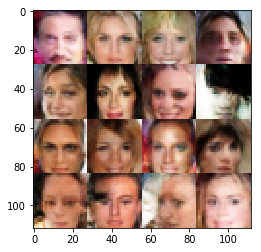

Epoch 4/8... Discriminator Loss: 1.4549 ... Generator Loss: 0.4824
Epoch 4/8... Discriminator Loss: 1.3193 ... Generator Loss: 0.6020
Epoch 4/8... Discriminator Loss: 1.2731 ... Generator Loss: 0.9254
Epoch 4/8... Discriminator Loss: 1.3579 ... Generator Loss: 0.7888
Epoch 4/8... Discriminator Loss: 1.2738 ... Generator Loss: 1.1602
Epoch 4/8... Discriminator Loss: 1.2480 ... Generator Loss: 0.6772
Epoch 4/8... Discriminator Loss: 1.1121 ... Generator Loss: 0.7704
Epoch 4/8... Discriminator Loss: 1.2442 ... Generator Loss: 0.7331
Epoch 4/8... Discriminator Loss: 1.2431 ... Generator Loss: 0.7734
Epoch 4/8... Discriminator Loss: 1.2403 ... Generator Loss: 1.1067


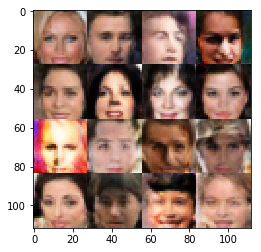

Epoch 4/8... Discriminator Loss: 1.2679 ... Generator Loss: 0.8681
Epoch 4/8... Discriminator Loss: 1.1375 ... Generator Loss: 1.0562
Epoch 4/8... Discriminator Loss: 1.2560 ... Generator Loss: 1.0000
Epoch 4/8... Discriminator Loss: 1.1488 ... Generator Loss: 1.1005
Epoch 4/8... Discriminator Loss: 1.2443 ... Generator Loss: 0.8527
Epoch 4/8... Discriminator Loss: 1.6639 ... Generator Loss: 1.5584
Epoch 4/8... Discriminator Loss: 1.0852 ... Generator Loss: 0.7560
Epoch 4/8... Discriminator Loss: 1.3201 ... Generator Loss: 0.7176
Epoch 4/8... Discriminator Loss: 1.3387 ... Generator Loss: 0.8770
Epoch 4/8... Discriminator Loss: 1.2343 ... Generator Loss: 0.6381


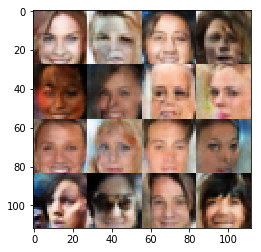

Epoch 4/8... Discriminator Loss: 1.2283 ... Generator Loss: 0.6652
Epoch 4/8... Discriminator Loss: 1.1518 ... Generator Loss: 0.6964
Epoch 4/8... Discriminator Loss: 1.2159 ... Generator Loss: 0.8380
Epoch 4/8... Discriminator Loss: 1.2199 ... Generator Loss: 0.7924
Epoch 4/8... Discriminator Loss: 1.1550 ... Generator Loss: 1.1009
Epoch 4/8... Discriminator Loss: 1.4677 ... Generator Loss: 0.8124
Epoch 4/8... Discriminator Loss: 1.3473 ... Generator Loss: 0.6895
Epoch 4/8... Discriminator Loss: 1.3260 ... Generator Loss: 0.7185
Epoch 4/8... Discriminator Loss: 1.2178 ... Generator Loss: 0.7707
Epoch 4/8... Discriminator Loss: 1.0258 ... Generator Loss: 1.0562


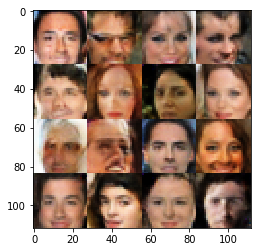

Epoch 4/8... Discriminator Loss: 1.2319 ... Generator Loss: 1.1196
Epoch 4/8... Discriminator Loss: 1.3075 ... Generator Loss: 1.1257
Epoch 4/8... Discriminator Loss: 1.1335 ... Generator Loss: 0.7301
Epoch 4/8... Discriminator Loss: 1.2333 ... Generator Loss: 0.7127
Epoch 4/8... Discriminator Loss: 1.3219 ... Generator Loss: 1.1971
Epoch 4/8... Discriminator Loss: 1.2598 ... Generator Loss: 0.8146
Epoch 4/8... Discriminator Loss: 1.2961 ... Generator Loss: 0.6570
Epoch 4/8... Discriminator Loss: 1.1269 ... Generator Loss: 1.0162
Epoch 4/8... Discriminator Loss: 1.1753 ... Generator Loss: 0.6929
Epoch 4/8... Discriminator Loss: 1.3555 ... Generator Loss: 0.6066


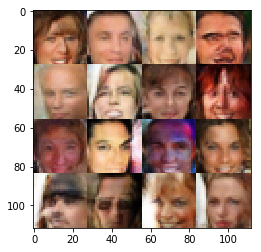

Epoch 4/8... Discriminator Loss: 1.3757 ... Generator Loss: 0.9751
Epoch 4/8... Discriminator Loss: 1.4362 ... Generator Loss: 0.4770
Epoch 4/8... Discriminator Loss: 1.2642 ... Generator Loss: 0.6122
Epoch 4/8... Discriminator Loss: 1.2545 ... Generator Loss: 0.5683
Epoch 4/8... Discriminator Loss: 1.3451 ... Generator Loss: 0.5896
Epoch 4/8... Discriminator Loss: 1.4464 ... Generator Loss: 0.9321
Epoch 4/8... Discriminator Loss: 1.2807 ... Generator Loss: 0.9998
Epoch 4/8... Discriminator Loss: 1.4743 ... Generator Loss: 0.4228
Epoch 4/8... Discriminator Loss: 1.2561 ... Generator Loss: 0.7715
Epoch 4/8... Discriminator Loss: 1.2652 ... Generator Loss: 0.7116


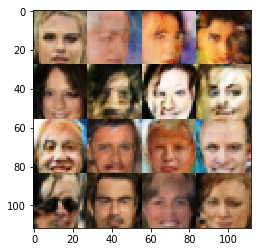

Epoch 4/8... Discriminator Loss: 1.4247 ... Generator Loss: 1.0607
Epoch 4/8... Discriminator Loss: 1.3886 ... Generator Loss: 0.5815
Epoch 4/8... Discriminator Loss: 1.2475 ... Generator Loss: 1.8171
Epoch 4/8... Discriminator Loss: 1.3488 ... Generator Loss: 0.7400
Epoch 4/8... Discriminator Loss: 1.2457 ... Generator Loss: 0.7636
Epoch 4/8... Discriminator Loss: 1.3370 ... Generator Loss: 0.6773
Epoch 4/8... Discriminator Loss: 1.5068 ... Generator Loss: 1.1793
Epoch 4/8... Discriminator Loss: 1.2702 ... Generator Loss: 0.6735
Epoch 4/8... Discriminator Loss: 1.4293 ... Generator Loss: 0.5500
Epoch 4/8... Discriminator Loss: 1.2556 ... Generator Loss: 0.5829


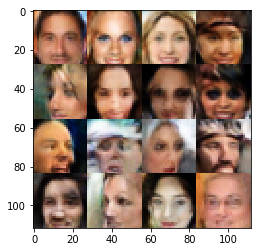

Epoch 4/8... Discriminator Loss: 1.1822 ... Generator Loss: 1.0571
Epoch 4/8... Discriminator Loss: 1.2717 ... Generator Loss: 0.6772
Epoch 4/8... Discriminator Loss: 1.3545 ... Generator Loss: 0.5362
Epoch 4/8... Discriminator Loss: 1.2615 ... Generator Loss: 0.6293
Epoch 4/8... Discriminator Loss: 1.2860 ... Generator Loss: 1.0606
Epoch 4/8... Discriminator Loss: 1.0284 ... Generator Loss: 1.0987
Epoch 4/8... Discriminator Loss: 1.2890 ... Generator Loss: 0.8293
Epoch 4/8... Discriminator Loss: 1.2968 ... Generator Loss: 0.6596
Epoch 4/8... Discriminator Loss: 1.4004 ... Generator Loss: 0.5601
Epoch 4/8... Discriminator Loss: 1.3208 ... Generator Loss: 0.5688


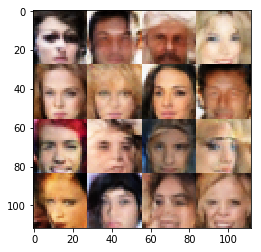

Epoch 4/8... Discriminator Loss: 1.3123 ... Generator Loss: 0.6299
Epoch 4/8... Discriminator Loss: 1.4242 ... Generator Loss: 0.9262
Epoch 4/8... Discriminator Loss: 1.2295 ... Generator Loss: 0.8551
Epoch 4/8... Discriminator Loss: 1.2069 ... Generator Loss: 1.0110
Epoch 4/8... Discriminator Loss: 1.2872 ... Generator Loss: 0.7963
Epoch 4/8... Discriminator Loss: 1.3943 ... Generator Loss: 0.8548
Epoch 4/8... Discriminator Loss: 1.1540 ... Generator Loss: 0.7149
Epoch 4/8... Discriminator Loss: 1.2359 ... Generator Loss: 0.8205
Epoch 4/8... Discriminator Loss: 1.2142 ... Generator Loss: 0.6450
Epoch 4/8... Discriminator Loss: 1.1880 ... Generator Loss: 0.8303


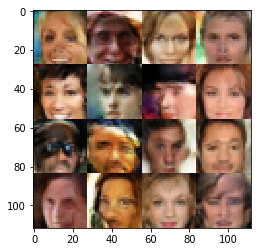

Epoch 4/8... Discriminator Loss: 1.2879 ... Generator Loss: 0.5941
Epoch 4/8... Discriminator Loss: 1.4157 ... Generator Loss: 0.4933
Epoch 4/8... Discriminator Loss: 1.2514 ... Generator Loss: 0.7336
Epoch 4/8... Discriminator Loss: 1.1887 ... Generator Loss: 0.9190
Epoch 4/8... Discriminator Loss: 1.2436 ... Generator Loss: 0.9772
Epoch 4/8... Discriminator Loss: 1.2450 ... Generator Loss: 0.8087
Epoch 4/8... Discriminator Loss: 1.3621 ... Generator Loss: 0.8633
Epoch 4/8... Discriminator Loss: 1.4730 ... Generator Loss: 0.4475
Epoch 4/8... Discriminator Loss: 1.1723 ... Generator Loss: 0.7390
Epoch 4/8... Discriminator Loss: 1.3624 ... Generator Loss: 0.8148


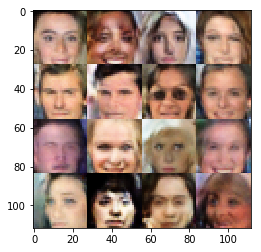

Epoch 4/8... Discriminator Loss: 1.3001 ... Generator Loss: 0.8751
Epoch 4/8... Discriminator Loss: 1.2662 ... Generator Loss: 0.5755
Epoch 4/8... Discriminator Loss: 1.2617 ... Generator Loss: 0.8062
Epoch 4/8... Discriminator Loss: 1.4684 ... Generator Loss: 0.9302
Epoch 4/8... Discriminator Loss: 1.4962 ... Generator Loss: 0.4716
Epoch 4/8... Discriminator Loss: 1.3250 ... Generator Loss: 0.6876
Epoch 4/8... Discriminator Loss: 1.2667 ... Generator Loss: 0.8044
Epoch 4/8... Discriminator Loss: 1.3387 ... Generator Loss: 0.7982
Epoch 4/8... Discriminator Loss: 1.2824 ... Generator Loss: 0.7455
Epoch 4/8... Discriminator Loss: 1.1679 ... Generator Loss: 1.0039


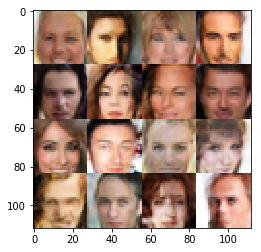

Epoch 4/8... Discriminator Loss: 1.2555 ... Generator Loss: 0.7038
Epoch 4/8... Discriminator Loss: 1.2144 ... Generator Loss: 1.0495
Epoch 4/8... Discriminator Loss: 1.2697 ... Generator Loss: 0.6061
Epoch 4/8... Discriminator Loss: 1.1347 ... Generator Loss: 1.0024
Epoch 4/8... Discriminator Loss: 1.2335 ... Generator Loss: 0.8313
Epoch 4/8... Discriminator Loss: 1.4450 ... Generator Loss: 1.1127
Epoch 4/8... Discriminator Loss: 1.3097 ... Generator Loss: 0.6252
Epoch 4/8... Discriminator Loss: 1.1425 ... Generator Loss: 1.0926
Epoch 4/8... Discriminator Loss: 1.3605 ... Generator Loss: 0.8246
Epoch 4/8... Discriminator Loss: 1.3054 ... Generator Loss: 0.9088


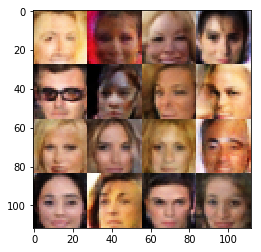

Epoch 4/8... Discriminator Loss: 1.2810 ... Generator Loss: 0.9104
Epoch 4/8... Discriminator Loss: 1.3031 ... Generator Loss: 0.6553
Epoch 4/8... Discriminator Loss: 1.1382 ... Generator Loss: 1.0308
Epoch 4/8... Discriminator Loss: 1.2322 ... Generator Loss: 0.7028
Epoch 4/8... Discriminator Loss: 1.2321 ... Generator Loss: 0.7026
Epoch 4/8... Discriminator Loss: 1.3076 ... Generator Loss: 0.6408
Epoch 4/8... Discriminator Loss: 1.3479 ... Generator Loss: 0.9805
Epoch 4/8... Discriminator Loss: 1.2365 ... Generator Loss: 0.8333
Epoch 4/8... Discriminator Loss: 1.2477 ... Generator Loss: 1.0104
Epoch 4/8... Discriminator Loss: 1.1414 ... Generator Loss: 0.7422


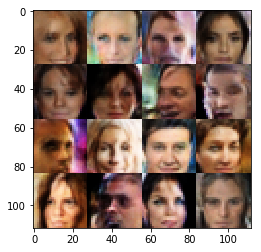

Epoch 4/8... Discriminator Loss: 1.3923 ... Generator Loss: 0.8984
Epoch 4/8... Discriminator Loss: 1.3942 ... Generator Loss: 0.5517
Epoch 4/8... Discriminator Loss: 1.2830 ... Generator Loss: 0.6336
Epoch 4/8... Discriminator Loss: 1.1608 ... Generator Loss: 0.8670
Epoch 4/8... Discriminator Loss: 1.4102 ... Generator Loss: 0.8104
Epoch 4/8... Discriminator Loss: 1.3082 ... Generator Loss: 0.8690
Epoch 4/8... Discriminator Loss: 1.2856 ... Generator Loss: 0.9358
Epoch 4/8... Discriminator Loss: 1.3109 ... Generator Loss: 1.0802
Epoch 4/8... Discriminator Loss: 1.2574 ... Generator Loss: 0.8111
Epoch 4/8... Discriminator Loss: 1.3937 ... Generator Loss: 0.5258


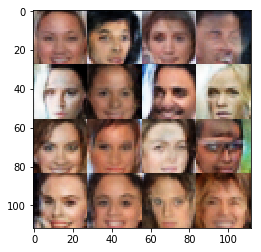

Epoch 4/8... Discriminator Loss: 1.3992 ... Generator Loss: 0.5319
Epoch 4/8... Discriminator Loss: 1.3405 ... Generator Loss: 1.2788
Epoch 4/8... Discriminator Loss: 1.0867 ... Generator Loss: 1.1251
Epoch 4/8... Discriminator Loss: 1.3002 ... Generator Loss: 0.8354
Epoch 4/8... Discriminator Loss: 1.3969 ... Generator Loss: 0.8185
Epoch 4/8... Discriminator Loss: 1.2559 ... Generator Loss: 0.7971
Epoch 4/8... Discriminator Loss: 1.2969 ... Generator Loss: 0.7770
Epoch 4/8... Discriminator Loss: 1.3267 ... Generator Loss: 0.5629
Epoch 4/8... Discriminator Loss: 1.3092 ... Generator Loss: 0.6123
Epoch 4/8... Discriminator Loss: 1.2798 ... Generator Loss: 0.8512


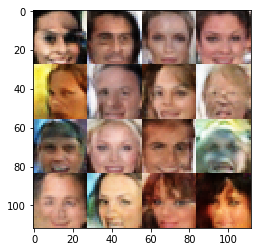

Epoch 4/8... Discriminator Loss: 1.2663 ... Generator Loss: 0.7026
Epoch 4/8... Discriminator Loss: 1.1946 ... Generator Loss: 0.8596
Epoch 4/8... Discriminator Loss: 1.2973 ... Generator Loss: 0.5802
Epoch 4/8... Discriminator Loss: 1.2135 ... Generator Loss: 0.6787
Epoch 4/8... Discriminator Loss: 1.3408 ... Generator Loss: 0.7589
Epoch 4/8... Discriminator Loss: 1.2522 ... Generator Loss: 0.6260
Epoch 4/8... Discriminator Loss: 1.3360 ... Generator Loss: 0.5493
Epoch 4/8... Discriminator Loss: 1.3371 ... Generator Loss: 0.6333
Epoch 4/8... Discriminator Loss: 1.2957 ... Generator Loss: 1.1486
Epoch 4/8... Discriminator Loss: 1.2390 ... Generator Loss: 1.0355


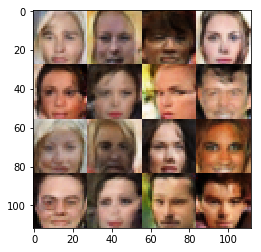

Epoch 4/8... Discriminator Loss: 1.0699 ... Generator Loss: 0.8350
Epoch 4/8... Discriminator Loss: 1.3801 ... Generator Loss: 0.7472
Epoch 4/8... Discriminator Loss: 1.0517 ... Generator Loss: 0.8697
Epoch 4/8... Discriminator Loss: 1.2573 ... Generator Loss: 0.9147
Epoch 4/8... Discriminator Loss: 1.2752 ... Generator Loss: 0.8610
Epoch 4/8... Discriminator Loss: 1.3284 ... Generator Loss: 0.8356
Epoch 4/8... Discriminator Loss: 1.2701 ... Generator Loss: 0.8360
Epoch 4/8... Discriminator Loss: 1.3721 ... Generator Loss: 0.4919
Epoch 4/8... Discriminator Loss: 1.3037 ... Generator Loss: 0.5796
Epoch 4/8... Discriminator Loss: 1.2914 ... Generator Loss: 0.8599


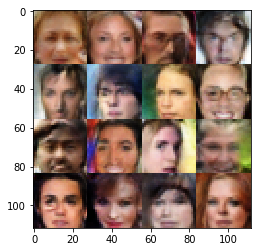

Epoch 4/8... Discriminator Loss: 1.1562 ... Generator Loss: 0.7864
Epoch 4/8... Discriminator Loss: 1.4615 ... Generator Loss: 1.1766
Epoch 4/8... Discriminator Loss: 1.3589 ... Generator Loss: 0.9204
Epoch 4/8... Discriminator Loss: 1.1974 ... Generator Loss: 0.7693
Epoch 4/8... Discriminator Loss: 1.2866 ... Generator Loss: 0.7795
Epoch 4/8... Discriminator Loss: 1.2559 ... Generator Loss: 0.8757
Epoch 4/8... Discriminator Loss: 1.2743 ... Generator Loss: 0.5326
Epoch 4/8... Discriminator Loss: 1.3555 ... Generator Loss: 1.0283
Epoch 4/8... Discriminator Loss: 1.3509 ... Generator Loss: 0.5609
Epoch 4/8... Discriminator Loss: 1.2984 ... Generator Loss: 0.7187


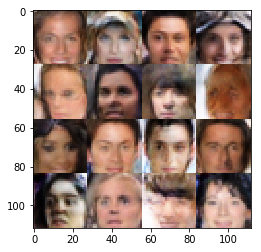

Epoch 4/8... Discriminator Loss: 1.4781 ... Generator Loss: 0.5080
Epoch 4/8... Discriminator Loss: 1.3896 ... Generator Loss: 0.7136
Epoch 4/8... Discriminator Loss: 1.3836 ... Generator Loss: 1.0790
Epoch 4/8... Discriminator Loss: 1.1145 ... Generator Loss: 0.7942
Epoch 4/8... Discriminator Loss: 1.1166 ... Generator Loss: 1.0241
Epoch 4/8... Discriminator Loss: 1.1703 ... Generator Loss: 0.7513
Epoch 4/8... Discriminator Loss: 1.1551 ... Generator Loss: 0.9432
Epoch 4/8... Discriminator Loss: 1.4605 ... Generator Loss: 0.4502
Epoch 4/8... Discriminator Loss: 1.1052 ... Generator Loss: 0.7388
Epoch 4/8... Discriminator Loss: 1.1921 ... Generator Loss: 0.8815


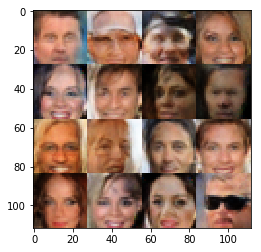

Epoch 4/8... Discriminator Loss: 1.3622 ... Generator Loss: 0.7992
Epoch 4/8... Discriminator Loss: 1.2041 ... Generator Loss: 0.8696
Epoch 4/8... Discriminator Loss: 1.4282 ... Generator Loss: 0.6779
Epoch 4/8... Discriminator Loss: 1.1634 ... Generator Loss: 0.9987
Epoch 4/8... Discriminator Loss: 1.3175 ... Generator Loss: 0.5800
Epoch 4/8... Discriminator Loss: 1.1903 ... Generator Loss: 0.7534


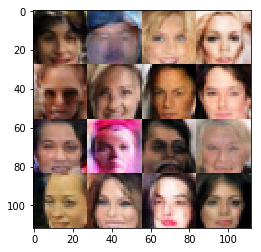

Epoch 5/8... Discriminator Loss: 1.3445 ... Generator Loss: 0.7345
Epoch 5/8... Discriminator Loss: 1.3078 ... Generator Loss: 0.7669
Epoch 5/8... Discriminator Loss: 1.3250 ... Generator Loss: 0.6711
Epoch 5/8... Discriminator Loss: 1.0982 ... Generator Loss: 1.0694


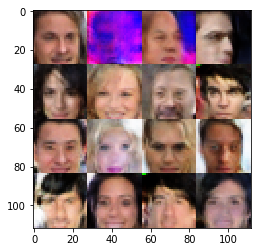

Epoch 5/8... Discriminator Loss: 1.3117 ... Generator Loss: 1.0231
Epoch 5/8... Discriminator Loss: 1.4580 ... Generator Loss: 0.4553
Epoch 5/8... Discriminator Loss: 1.3118 ... Generator Loss: 0.6109
Epoch 5/8... Discriminator Loss: 1.1907 ... Generator Loss: 0.7106
Epoch 5/8... Discriminator Loss: 1.2916 ... Generator Loss: 0.8956
Epoch 5/8... Discriminator Loss: 1.2590 ... Generator Loss: 0.6633
Epoch 5/8... Discriminator Loss: 1.2830 ... Generator Loss: 0.6931
Epoch 5/8... Discriminator Loss: 1.2646 ... Generator Loss: 0.5730
Epoch 5/8... Discriminator Loss: 1.4027 ... Generator Loss: 0.5308
Epoch 5/8... Discriminator Loss: 1.3710 ... Generator Loss: 0.6988


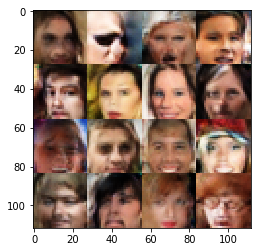

Epoch 5/8... Discriminator Loss: 1.1935 ... Generator Loss: 0.9175
Epoch 5/8... Discriminator Loss: 1.2002 ... Generator Loss: 0.8058
Epoch 5/8... Discriminator Loss: 1.1102 ... Generator Loss: 0.9593
Epoch 5/8... Discriminator Loss: 1.2707 ... Generator Loss: 0.6780
Epoch 5/8... Discriminator Loss: 1.1689 ... Generator Loss: 0.8764
Epoch 5/8... Discriminator Loss: 1.2691 ... Generator Loss: 0.5759
Epoch 5/8... Discriminator Loss: 1.3224 ... Generator Loss: 0.6612
Epoch 5/8... Discriminator Loss: 1.2093 ... Generator Loss: 0.6648
Epoch 5/8... Discriminator Loss: 1.3927 ... Generator Loss: 1.1217
Epoch 5/8... Discriminator Loss: 1.2609 ... Generator Loss: 0.8538


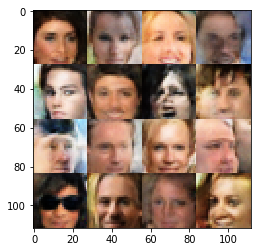

Epoch 5/8... Discriminator Loss: 1.1608 ... Generator Loss: 0.9250
Epoch 5/8... Discriminator Loss: 1.3670 ... Generator Loss: 0.9263
Epoch 5/8... Discriminator Loss: 1.1438 ... Generator Loss: 1.0528
Epoch 5/8... Discriminator Loss: 1.2524 ... Generator Loss: 0.5616
Epoch 5/8... Discriminator Loss: 1.2751 ... Generator Loss: 0.6989
Epoch 5/8... Discriminator Loss: 1.2290 ... Generator Loss: 0.6221
Epoch 5/8... Discriminator Loss: 1.2178 ... Generator Loss: 0.7075
Epoch 5/8... Discriminator Loss: 1.3683 ... Generator Loss: 0.5644
Epoch 5/8... Discriminator Loss: 1.2386 ... Generator Loss: 0.7127
Epoch 5/8... Discriminator Loss: 1.3512 ... Generator Loss: 0.9096


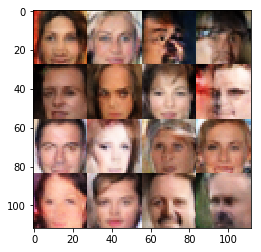

Epoch 5/8... Discriminator Loss: 1.1516 ... Generator Loss: 0.9336
Epoch 5/8... Discriminator Loss: 1.2970 ... Generator Loss: 0.6725
Epoch 5/8... Discriminator Loss: 1.3832 ... Generator Loss: 0.7068
Epoch 5/8... Discriminator Loss: 1.3287 ... Generator Loss: 1.1763
Epoch 5/8... Discriminator Loss: 1.3483 ... Generator Loss: 0.9746
Epoch 5/8... Discriminator Loss: 1.2857 ... Generator Loss: 0.7594
Epoch 5/8... Discriminator Loss: 1.6132 ... Generator Loss: 0.4042
Epoch 5/8... Discriminator Loss: 1.3677 ... Generator Loss: 0.5529
Epoch 5/8... Discriminator Loss: 1.4512 ... Generator Loss: 0.4582
Epoch 5/8... Discriminator Loss: 1.4360 ... Generator Loss: 0.4951


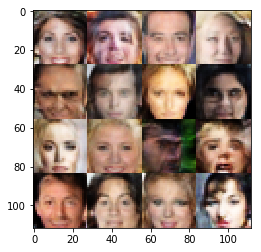

Epoch 5/8... Discriminator Loss: 1.3969 ... Generator Loss: 0.5033
Epoch 5/8... Discriminator Loss: 1.1101 ... Generator Loss: 0.8667
Epoch 5/8... Discriminator Loss: 1.1782 ... Generator Loss: 0.7098
Epoch 5/8... Discriminator Loss: 1.2366 ... Generator Loss: 0.6875
Epoch 5/8... Discriminator Loss: 1.3135 ... Generator Loss: 0.7537
Epoch 5/8... Discriminator Loss: 1.3064 ... Generator Loss: 0.5928
Epoch 5/8... Discriminator Loss: 1.5031 ... Generator Loss: 0.9284
Epoch 5/8... Discriminator Loss: 1.3001 ... Generator Loss: 0.6608
Epoch 5/8... Discriminator Loss: 1.3436 ... Generator Loss: 1.0386
Epoch 5/8... Discriminator Loss: 1.2333 ... Generator Loss: 0.9766


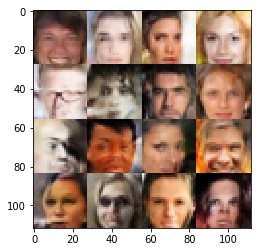

Epoch 5/8... Discriminator Loss: 1.2367 ... Generator Loss: 0.7743
Epoch 5/8... Discriminator Loss: 1.2798 ... Generator Loss: 0.9084
Epoch 5/8... Discriminator Loss: 1.0474 ... Generator Loss: 0.9850
Epoch 5/8... Discriminator Loss: 1.2371 ... Generator Loss: 0.9252
Epoch 5/8... Discriminator Loss: 1.3176 ... Generator Loss: 0.7619
Epoch 5/8... Discriminator Loss: 1.2893 ... Generator Loss: 0.6896
Epoch 5/8... Discriminator Loss: 1.3465 ... Generator Loss: 0.8287
Epoch 5/8... Discriminator Loss: 1.4204 ... Generator Loss: 0.4582
Epoch 5/8... Discriminator Loss: 1.2796 ... Generator Loss: 0.6751
Epoch 5/8... Discriminator Loss: 1.1765 ... Generator Loss: 0.9889


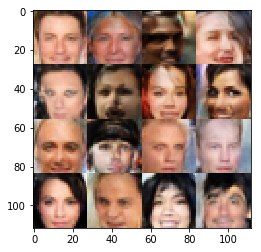

Epoch 5/8... Discriminator Loss: 1.3534 ... Generator Loss: 0.5921
Epoch 5/8... Discriminator Loss: 1.1603 ... Generator Loss: 0.6812
Epoch 5/8... Discriminator Loss: 1.1788 ... Generator Loss: 0.7828
Epoch 5/8... Discriminator Loss: 1.2382 ... Generator Loss: 0.7359
Epoch 5/8... Discriminator Loss: 1.1926 ... Generator Loss: 0.8982
Epoch 5/8... Discriminator Loss: 1.2438 ... Generator Loss: 0.7616
Epoch 5/8... Discriminator Loss: 1.3257 ... Generator Loss: 0.5818
Epoch 5/8... Discriminator Loss: 1.3705 ... Generator Loss: 1.0088
Epoch 5/8... Discriminator Loss: 1.2133 ... Generator Loss: 0.7066
Epoch 5/8... Discriminator Loss: 1.3398 ... Generator Loss: 0.5436


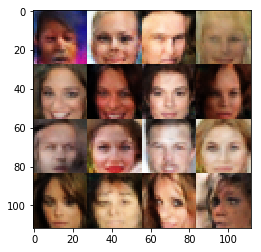

Epoch 5/8... Discriminator Loss: 1.3776 ... Generator Loss: 0.5996
Epoch 5/8... Discriminator Loss: 1.1274 ... Generator Loss: 1.1709
Epoch 5/8... Discriminator Loss: 1.2825 ... Generator Loss: 0.7519
Epoch 5/8... Discriminator Loss: 1.2283 ... Generator Loss: 0.9658
Epoch 5/8... Discriminator Loss: 1.2946 ... Generator Loss: 0.8408
Epoch 5/8... Discriminator Loss: 1.2966 ... Generator Loss: 0.5882
Epoch 5/8... Discriminator Loss: 1.3465 ... Generator Loss: 0.6198
Epoch 5/8... Discriminator Loss: 1.2241 ... Generator Loss: 0.6697
Epoch 5/8... Discriminator Loss: 1.2847 ... Generator Loss: 0.9273
Epoch 5/8... Discriminator Loss: 1.4425 ... Generator Loss: 0.4891


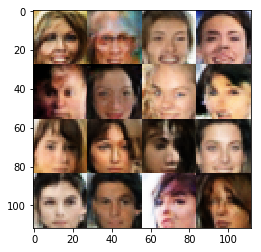

Epoch 5/8... Discriminator Loss: 1.3366 ... Generator Loss: 0.9260
Epoch 5/8... Discriminator Loss: 1.1200 ... Generator Loss: 0.9795
Epoch 5/8... Discriminator Loss: 1.2860 ... Generator Loss: 0.5966
Epoch 5/8... Discriminator Loss: 1.4569 ... Generator Loss: 0.6120
Epoch 5/8... Discriminator Loss: 1.3177 ... Generator Loss: 0.7570
Epoch 5/8... Discriminator Loss: 1.1793 ... Generator Loss: 0.8385
Epoch 5/8... Discriminator Loss: 1.2626 ... Generator Loss: 0.7418
Epoch 5/8... Discriminator Loss: 1.2853 ... Generator Loss: 0.5308
Epoch 5/8... Discriminator Loss: 1.2998 ... Generator Loss: 0.6128
Epoch 5/8... Discriminator Loss: 1.1216 ... Generator Loss: 0.7582


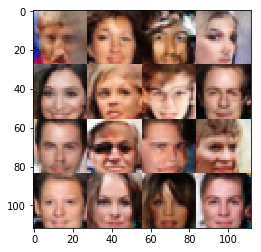

Epoch 5/8... Discriminator Loss: 1.0950 ... Generator Loss: 1.0968
Epoch 5/8... Discriminator Loss: 1.3267 ... Generator Loss: 1.1125
Epoch 5/8... Discriminator Loss: 1.1781 ... Generator Loss: 1.0518
Epoch 5/8... Discriminator Loss: 1.2937 ... Generator Loss: 0.6501
Epoch 5/8... Discriminator Loss: 1.1208 ... Generator Loss: 0.9800
Epoch 5/8... Discriminator Loss: 1.3773 ... Generator Loss: 0.5480
Epoch 5/8... Discriminator Loss: 1.2402 ... Generator Loss: 0.7432
Epoch 5/8... Discriminator Loss: 1.4722 ... Generator Loss: 0.5585
Epoch 5/8... Discriminator Loss: 1.3344 ... Generator Loss: 0.7961
Epoch 5/8... Discriminator Loss: 1.3713 ... Generator Loss: 0.8134


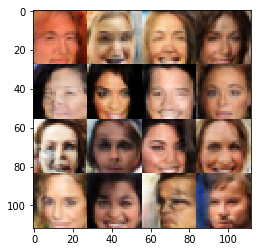

Epoch 5/8... Discriminator Loss: 1.3619 ... Generator Loss: 0.8933
Epoch 5/8... Discriminator Loss: 1.4179 ... Generator Loss: 0.4869
Epoch 5/8... Discriminator Loss: 1.2991 ... Generator Loss: 0.6502
Epoch 5/8... Discriminator Loss: 1.2239 ... Generator Loss: 0.7216
Epoch 5/8... Discriminator Loss: 1.2732 ... Generator Loss: 0.8281
Epoch 5/8... Discriminator Loss: 1.2882 ... Generator Loss: 0.8401
Epoch 5/8... Discriminator Loss: 1.2257 ... Generator Loss: 0.7122
Epoch 5/8... Discriminator Loss: 1.2554 ... Generator Loss: 0.7077
Epoch 5/8... Discriminator Loss: 1.3431 ... Generator Loss: 0.7067
Epoch 5/8... Discriminator Loss: 1.3034 ... Generator Loss: 0.7383


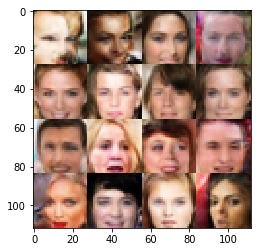

Epoch 5/8... Discriminator Loss: 1.3542 ... Generator Loss: 0.5914
Epoch 5/8... Discriminator Loss: 1.2549 ... Generator Loss: 0.5926
Epoch 5/8... Discriminator Loss: 1.3509 ... Generator Loss: 0.7504
Epoch 5/8... Discriminator Loss: 1.3497 ... Generator Loss: 0.7351
Epoch 5/8... Discriminator Loss: 1.0036 ... Generator Loss: 0.9403
Epoch 5/8... Discriminator Loss: 1.3369 ... Generator Loss: 0.6338
Epoch 5/8... Discriminator Loss: 1.2949 ... Generator Loss: 0.6242
Epoch 5/8... Discriminator Loss: 1.4352 ... Generator Loss: 0.5233
Epoch 5/8... Discriminator Loss: 1.1233 ... Generator Loss: 0.9697
Epoch 5/8... Discriminator Loss: 1.4638 ... Generator Loss: 0.4895


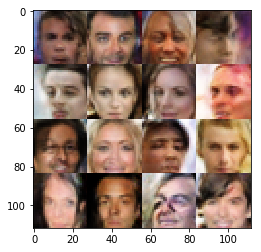

Epoch 5/8... Discriminator Loss: 1.1725 ... Generator Loss: 0.6620
Epoch 5/8... Discriminator Loss: 1.2272 ... Generator Loss: 0.8065
Epoch 5/8... Discriminator Loss: 1.3948 ... Generator Loss: 1.0662
Epoch 5/8... Discriminator Loss: 1.3228 ... Generator Loss: 0.6074
Epoch 5/8... Discriminator Loss: 1.2732 ... Generator Loss: 0.6805
Epoch 5/8... Discriminator Loss: 1.2768 ... Generator Loss: 0.6174
Epoch 5/8... Discriminator Loss: 1.4612 ... Generator Loss: 0.4864
Epoch 5/8... Discriminator Loss: 1.1925 ... Generator Loss: 0.7919
Epoch 5/8... Discriminator Loss: 1.1502 ... Generator Loss: 0.7517
Epoch 5/8... Discriminator Loss: 1.3024 ... Generator Loss: 0.6921


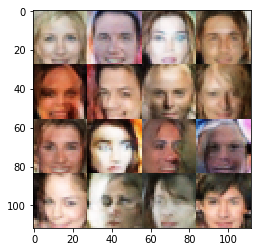

Epoch 5/8... Discriminator Loss: 1.1723 ... Generator Loss: 0.7484
Epoch 5/8... Discriminator Loss: 1.3401 ... Generator Loss: 0.5557
Epoch 5/8... Discriminator Loss: 1.2979 ... Generator Loss: 0.8847
Epoch 5/8... Discriminator Loss: 1.3221 ... Generator Loss: 0.6183
Epoch 5/8... Discriminator Loss: 1.4304 ... Generator Loss: 0.4901
Epoch 5/8... Discriminator Loss: 1.5868 ... Generator Loss: 0.3762
Epoch 5/8... Discriminator Loss: 1.2823 ... Generator Loss: 0.8596
Epoch 5/8... Discriminator Loss: 1.2666 ... Generator Loss: 0.6999
Epoch 5/8... Discriminator Loss: 1.2741 ... Generator Loss: 0.6531
Epoch 5/8... Discriminator Loss: 1.2587 ... Generator Loss: 0.8964


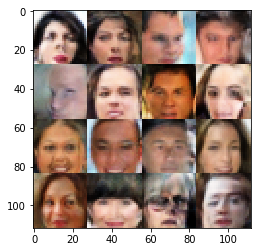

Epoch 5/8... Discriminator Loss: 1.2869 ... Generator Loss: 0.6676
Epoch 5/8... Discriminator Loss: 1.3015 ... Generator Loss: 0.8349
Epoch 5/8... Discriminator Loss: 1.6681 ... Generator Loss: 0.3627
Epoch 5/8... Discriminator Loss: 1.4134 ... Generator Loss: 0.4407
Epoch 5/8... Discriminator Loss: 1.2288 ... Generator Loss: 0.7479
Epoch 5/8... Discriminator Loss: 1.2941 ... Generator Loss: 0.6858
Epoch 5/8... Discriminator Loss: 1.2375 ... Generator Loss: 0.7129
Epoch 5/8... Discriminator Loss: 1.2697 ... Generator Loss: 0.6894
Epoch 5/8... Discriminator Loss: 1.2716 ... Generator Loss: 0.6209
Epoch 5/8... Discriminator Loss: 1.3634 ... Generator Loss: 0.6834


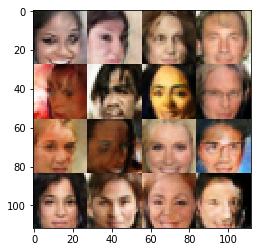

Epoch 5/8... Discriminator Loss: 1.2592 ... Generator Loss: 0.6384
Epoch 5/8... Discriminator Loss: 1.2979 ... Generator Loss: 0.7254
Epoch 5/8... Discriminator Loss: 1.2776 ... Generator Loss: 0.6997
Epoch 5/8... Discriminator Loss: 1.3285 ... Generator Loss: 0.8498
Epoch 5/8... Discriminator Loss: 1.4222 ... Generator Loss: 0.9855
Epoch 5/8... Discriminator Loss: 1.1804 ... Generator Loss: 0.7121
Epoch 5/8... Discriminator Loss: 1.3687 ... Generator Loss: 0.5552
Epoch 5/8... Discriminator Loss: 1.1937 ... Generator Loss: 0.9095
Epoch 5/8... Discriminator Loss: 1.1464 ... Generator Loss: 0.9775
Epoch 5/8... Discriminator Loss: 1.2705 ... Generator Loss: 0.6357


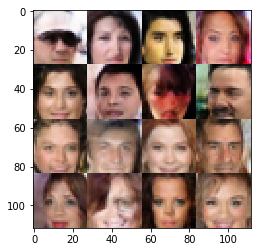

Epoch 5/8... Discriminator Loss: 1.3877 ... Generator Loss: 0.6347
Epoch 5/8... Discriminator Loss: 1.3099 ... Generator Loss: 0.6532
Epoch 5/8... Discriminator Loss: 1.2561 ... Generator Loss: 0.7670
Epoch 5/8... Discriminator Loss: 1.2998 ... Generator Loss: 0.6518
Epoch 5/8... Discriminator Loss: 1.2273 ... Generator Loss: 0.6718
Epoch 5/8... Discriminator Loss: 1.4372 ... Generator Loss: 0.5689
Epoch 5/8... Discriminator Loss: 1.1651 ... Generator Loss: 0.8442
Epoch 5/8... Discriminator Loss: 1.3517 ... Generator Loss: 0.5256
Epoch 5/8... Discriminator Loss: 1.3528 ... Generator Loss: 0.6164
Epoch 5/8... Discriminator Loss: 1.3751 ... Generator Loss: 0.9606


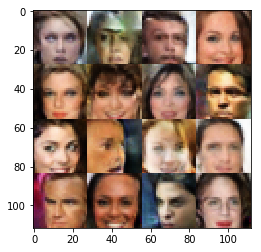

Epoch 5/8... Discriminator Loss: 1.1778 ... Generator Loss: 0.7081
Epoch 5/8... Discriminator Loss: 1.3263 ... Generator Loss: 0.5225
Epoch 5/8... Discriminator Loss: 1.2731 ... Generator Loss: 0.8988
Epoch 5/8... Discriminator Loss: 1.2563 ... Generator Loss: 0.8524
Epoch 5/8... Discriminator Loss: 1.2651 ... Generator Loss: 0.6159
Epoch 5/8... Discriminator Loss: 1.2163 ... Generator Loss: 0.8877
Epoch 5/8... Discriminator Loss: 1.2000 ... Generator Loss: 0.7317
Epoch 5/8... Discriminator Loss: 1.2804 ... Generator Loss: 0.5577
Epoch 5/8... Discriminator Loss: 1.3959 ... Generator Loss: 0.5656
Epoch 5/8... Discriminator Loss: 1.5165 ... Generator Loss: 0.4269


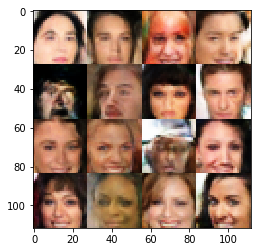

Epoch 5/8... Discriminator Loss: 1.1884 ... Generator Loss: 0.6803
Epoch 5/8... Discriminator Loss: 1.1816 ... Generator Loss: 0.9539
Epoch 5/8... Discriminator Loss: 1.2959 ... Generator Loss: 0.6899
Epoch 5/8... Discriminator Loss: 1.1848 ... Generator Loss: 0.7806
Epoch 5/8... Discriminator Loss: 1.5048 ... Generator Loss: 0.9759
Epoch 5/8... Discriminator Loss: 1.3467 ... Generator Loss: 0.5278
Epoch 5/8... Discriminator Loss: 1.2879 ... Generator Loss: 0.7955
Epoch 5/8... Discriminator Loss: 1.2640 ... Generator Loss: 0.6141
Epoch 5/8... Discriminator Loss: 1.3260 ... Generator Loss: 0.6362
Epoch 5/8... Discriminator Loss: 1.2574 ... Generator Loss: 1.1428


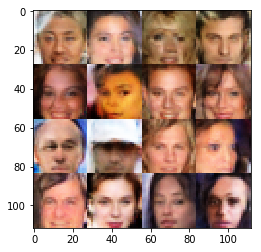

Epoch 5/8... Discriminator Loss: 1.3996 ... Generator Loss: 0.6528
Epoch 5/8... Discriminator Loss: 1.2044 ... Generator Loss: 0.7801
Epoch 5/8... Discriminator Loss: 1.2705 ... Generator Loss: 0.6599
Epoch 5/8... Discriminator Loss: 1.3256 ... Generator Loss: 0.8151
Epoch 5/8... Discriminator Loss: 1.3099 ... Generator Loss: 0.7100
Epoch 5/8... Discriminator Loss: 1.3065 ... Generator Loss: 0.7393
Epoch 5/8... Discriminator Loss: 1.2805 ... Generator Loss: 0.7760
Epoch 5/8... Discriminator Loss: 1.3167 ... Generator Loss: 0.6279
Epoch 5/8... Discriminator Loss: 1.2345 ... Generator Loss: 1.0022
Epoch 5/8... Discriminator Loss: 1.6611 ... Generator Loss: 1.2885


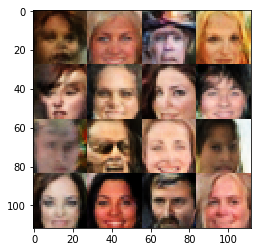

Epoch 5/8... Discriminator Loss: 1.2400 ... Generator Loss: 0.7737
Epoch 5/8... Discriminator Loss: 1.3096 ... Generator Loss: 0.8918
Epoch 5/8... Discriminator Loss: 1.1542 ... Generator Loss: 1.0167
Epoch 5/8... Discriminator Loss: 1.2242 ... Generator Loss: 0.7237
Epoch 5/8... Discriminator Loss: 1.4044 ... Generator Loss: 0.9876
Epoch 5/8... Discriminator Loss: 1.3061 ... Generator Loss: 0.7087
Epoch 5/8... Discriminator Loss: 1.2550 ... Generator Loss: 0.6776
Epoch 5/8... Discriminator Loss: 1.4155 ... Generator Loss: 0.9516
Epoch 5/8... Discriminator Loss: 1.4512 ... Generator Loss: 0.7997
Epoch 5/8... Discriminator Loss: 1.3253 ... Generator Loss: 0.6076


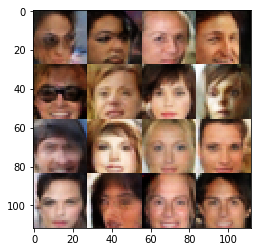

Epoch 5/8... Discriminator Loss: 1.2526 ... Generator Loss: 0.6321
Epoch 5/8... Discriminator Loss: 1.2454 ... Generator Loss: 0.6738
Epoch 5/8... Discriminator Loss: 1.3240 ... Generator Loss: 0.7387
Epoch 5/8... Discriminator Loss: 1.2973 ... Generator Loss: 0.6097
Epoch 5/8... Discriminator Loss: 1.2296 ... Generator Loss: 0.7806
Epoch 5/8... Discriminator Loss: 1.2604 ... Generator Loss: 0.8982
Epoch 5/8... Discriminator Loss: 1.1852 ... Generator Loss: 1.0743
Epoch 5/8... Discriminator Loss: 1.2537 ... Generator Loss: 0.7738
Epoch 5/8... Discriminator Loss: 1.2851 ... Generator Loss: 0.7968
Epoch 5/8... Discriminator Loss: 1.3447 ... Generator Loss: 0.8459


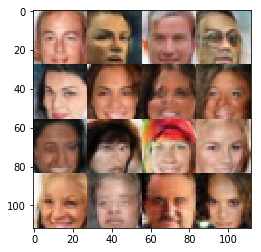

Epoch 5/8... Discriminator Loss: 1.2942 ... Generator Loss: 0.8406
Epoch 5/8... Discriminator Loss: 1.2954 ... Generator Loss: 0.8225
Epoch 5/8... Discriminator Loss: 1.3508 ... Generator Loss: 0.7841
Epoch 5/8... Discriminator Loss: 1.3134 ... Generator Loss: 0.7854
Epoch 5/8... Discriminator Loss: 1.1869 ... Generator Loss: 0.9499
Epoch 5/8... Discriminator Loss: 1.2776 ... Generator Loss: 0.8110
Epoch 5/8... Discriminator Loss: 1.2955 ... Generator Loss: 0.7664
Epoch 5/8... Discriminator Loss: 1.1764 ... Generator Loss: 1.0257
Epoch 5/8... Discriminator Loss: 1.3355 ... Generator Loss: 0.9074
Epoch 5/8... Discriminator Loss: 1.3936 ... Generator Loss: 0.6022


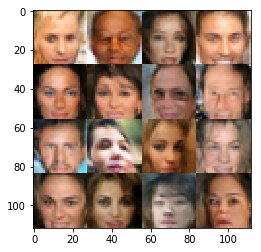

Epoch 5/8... Discriminator Loss: 1.2391 ... Generator Loss: 0.8313
Epoch 5/8... Discriminator Loss: 1.3690 ... Generator Loss: 0.7881
Epoch 5/8... Discriminator Loss: 1.3626 ... Generator Loss: 0.7877
Epoch 5/8... Discriminator Loss: 1.3526 ... Generator Loss: 1.0205
Epoch 5/8... Discriminator Loss: 1.5265 ... Generator Loss: 0.4148
Epoch 5/8... Discriminator Loss: 1.3084 ... Generator Loss: 0.6599
Epoch 5/8... Discriminator Loss: 1.4020 ... Generator Loss: 0.6256
Epoch 5/8... Discriminator Loss: 1.3113 ... Generator Loss: 0.7528
Epoch 5/8... Discriminator Loss: 1.3025 ... Generator Loss: 0.8123
Epoch 5/8... Discriminator Loss: 1.3391 ... Generator Loss: 0.6319


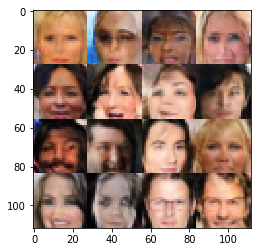

Epoch 5/8... Discriminator Loss: 1.3663 ... Generator Loss: 0.6214
Epoch 5/8... Discriminator Loss: 1.2308 ... Generator Loss: 0.9169
Epoch 5/8... Discriminator Loss: 1.2797 ... Generator Loss: 0.7309
Epoch 5/8... Discriminator Loss: 1.4437 ... Generator Loss: 0.4721
Epoch 5/8... Discriminator Loss: 1.3540 ... Generator Loss: 0.5866
Epoch 5/8... Discriminator Loss: 1.3229 ... Generator Loss: 0.9666
Epoch 5/8... Discriminator Loss: 1.2797 ... Generator Loss: 0.6504
Epoch 5/8... Discriminator Loss: 1.2736 ... Generator Loss: 0.6836
Epoch 5/8... Discriminator Loss: 1.3554 ... Generator Loss: 0.5909
Epoch 5/8... Discriminator Loss: 1.2354 ... Generator Loss: 0.7245


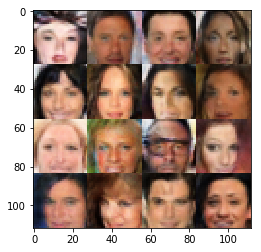

Epoch 5/8... Discriminator Loss: 1.3493 ... Generator Loss: 0.7208
Epoch 5/8... Discriminator Loss: 1.3823 ... Generator Loss: 0.5548
Epoch 5/8... Discriminator Loss: 1.2943 ... Generator Loss: 0.7951
Epoch 5/8... Discriminator Loss: 1.2827 ... Generator Loss: 0.7624
Epoch 5/8... Discriminator Loss: 1.2977 ... Generator Loss: 0.9589
Epoch 5/8... Discriminator Loss: 1.2503 ... Generator Loss: 0.8606
Epoch 5/8... Discriminator Loss: 1.2673 ... Generator Loss: 0.7228
Epoch 5/8... Discriminator Loss: 1.2965 ... Generator Loss: 0.7352
Epoch 5/8... Discriminator Loss: 1.2903 ... Generator Loss: 0.8350
Epoch 5/8... Discriminator Loss: 1.1777 ... Generator Loss: 0.8295


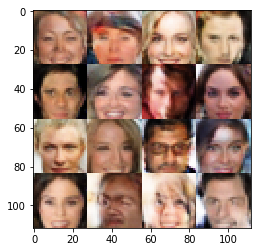

Epoch 5/8... Discriminator Loss: 1.3884 ... Generator Loss: 0.4750
Epoch 5/8... Discriminator Loss: 1.2464 ... Generator Loss: 0.7500
Epoch 5/8... Discriminator Loss: 1.3062 ... Generator Loss: 0.6547
Epoch 5/8... Discriminator Loss: 1.2673 ... Generator Loss: 0.9486
Epoch 5/8... Discriminator Loss: 1.2476 ... Generator Loss: 1.0666
Epoch 5/8... Discriminator Loss: 1.3228 ... Generator Loss: 0.6425
Epoch 5/8... Discriminator Loss: 1.3940 ... Generator Loss: 0.6177
Epoch 5/8... Discriminator Loss: 1.3092 ... Generator Loss: 0.5733
Epoch 5/8... Discriminator Loss: 1.1915 ... Generator Loss: 0.9422
Epoch 5/8... Discriminator Loss: 1.2027 ... Generator Loss: 0.7357


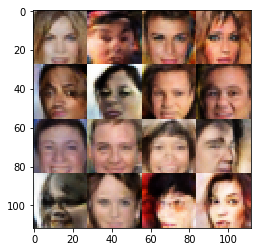

Epoch 5/8... Discriminator Loss: 1.2717 ... Generator Loss: 0.9335
Epoch 5/8... Discriminator Loss: 1.1917 ... Generator Loss: 0.8876
Epoch 5/8... Discriminator Loss: 1.3495 ... Generator Loss: 0.7548
Epoch 5/8... Discriminator Loss: 1.3364 ... Generator Loss: 0.6433
Epoch 5/8... Discriminator Loss: 1.1988 ... Generator Loss: 0.8103
Epoch 5/8... Discriminator Loss: 1.3603 ... Generator Loss: 1.0031
Epoch 5/8... Discriminator Loss: 1.2727 ... Generator Loss: 0.9105
Epoch 5/8... Discriminator Loss: 1.5160 ... Generator Loss: 0.4939
Epoch 5/8... Discriminator Loss: 1.3018 ... Generator Loss: 0.5667
Epoch 5/8... Discriminator Loss: 1.2933 ... Generator Loss: 0.7614


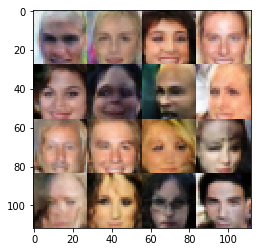

Epoch 5/8... Discriminator Loss: 1.3642 ... Generator Loss: 0.6928
Epoch 5/8... Discriminator Loss: 1.2574 ... Generator Loss: 0.8964
Epoch 5/8... Discriminator Loss: 1.3631 ... Generator Loss: 0.5461
Epoch 5/8... Discriminator Loss: 1.2504 ... Generator Loss: 0.7747
Epoch 5/8... Discriminator Loss: 1.3214 ... Generator Loss: 0.8702
Epoch 5/8... Discriminator Loss: 1.1187 ... Generator Loss: 1.0633
Epoch 5/8... Discriminator Loss: 1.2887 ... Generator Loss: 0.6231
Epoch 5/8... Discriminator Loss: 1.2544 ... Generator Loss: 0.6696
Epoch 5/8... Discriminator Loss: 1.2738 ... Generator Loss: 0.7085
Epoch 5/8... Discriminator Loss: 1.3990 ... Generator Loss: 0.5219


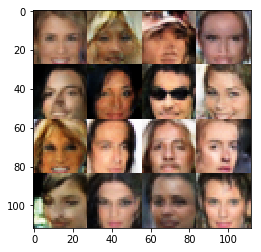

Epoch 5/8... Discriminator Loss: 1.2672 ... Generator Loss: 0.7329
Epoch 5/8... Discriminator Loss: 1.5627 ... Generator Loss: 0.3614
Epoch 5/8... Discriminator Loss: 1.3841 ... Generator Loss: 0.5760
Epoch 5/8... Discriminator Loss: 1.2569 ... Generator Loss: 0.5847
Epoch 5/8... Discriminator Loss: 1.2784 ... Generator Loss: 0.9030
Epoch 5/8... Discriminator Loss: 1.4930 ... Generator Loss: 1.1029
Epoch 5/8... Discriminator Loss: 1.2871 ... Generator Loss: 0.7719
Epoch 5/8... Discriminator Loss: 1.1971 ... Generator Loss: 0.8821
Epoch 5/8... Discriminator Loss: 1.5810 ... Generator Loss: 0.4274
Epoch 5/8... Discriminator Loss: 1.3212 ... Generator Loss: 0.6499


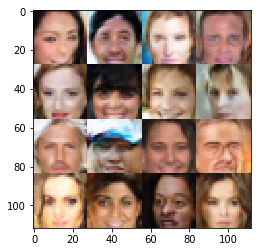

Epoch 5/8... Discriminator Loss: 1.3019 ... Generator Loss: 0.6874
Epoch 5/8... Discriminator Loss: 1.2666 ... Generator Loss: 0.5742
Epoch 5/8... Discriminator Loss: 1.2461 ... Generator Loss: 0.7227
Epoch 5/8... Discriminator Loss: 1.3862 ... Generator Loss: 0.5182
Epoch 5/8... Discriminator Loss: 1.0878 ... Generator Loss: 0.9306
Epoch 5/8... Discriminator Loss: 1.2583 ... Generator Loss: 0.6464
Epoch 5/8... Discriminator Loss: 1.2393 ... Generator Loss: 0.8728
Epoch 5/8... Discriminator Loss: 1.2498 ... Generator Loss: 1.0091
Epoch 5/8... Discriminator Loss: 1.2376 ... Generator Loss: 0.7209
Epoch 5/8... Discriminator Loss: 1.2510 ... Generator Loss: 0.6813


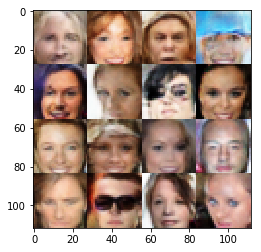

Epoch 5/8... Discriminator Loss: 1.2925 ... Generator Loss: 0.7953
Epoch 5/8... Discriminator Loss: 1.3025 ... Generator Loss: 0.7738


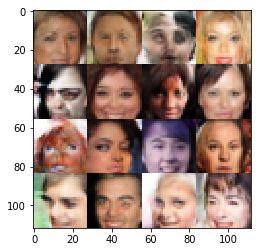

Epoch 6/8... Discriminator Loss: 1.3462 ... Generator Loss: 0.7132
Epoch 6/8... Discriminator Loss: 1.1211 ... Generator Loss: 0.8590
Epoch 6/8... Discriminator Loss: 1.2698 ... Generator Loss: 0.9348
Epoch 6/8... Discriminator Loss: 1.2753 ... Generator Loss: 0.8780
Epoch 6/8... Discriminator Loss: 1.1236 ... Generator Loss: 0.9278
Epoch 6/8... Discriminator Loss: 1.3724 ... Generator Loss: 1.1540
Epoch 6/8... Discriminator Loss: 1.2629 ... Generator Loss: 0.9133
Epoch 6/8... Discriminator Loss: 1.2967 ... Generator Loss: 0.7900


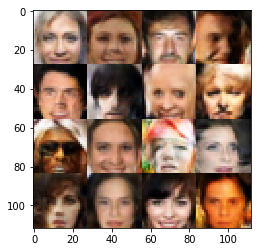

Epoch 6/8... Discriminator Loss: 1.3511 ... Generator Loss: 0.8816
Epoch 6/8... Discriminator Loss: 1.2461 ... Generator Loss: 0.8037
Epoch 6/8... Discriminator Loss: 1.3051 ... Generator Loss: 0.6617
Epoch 6/8... Discriminator Loss: 1.3279 ... Generator Loss: 0.9889
Epoch 6/8... Discriminator Loss: 1.2806 ... Generator Loss: 0.6393
Epoch 6/8... Discriminator Loss: 1.2988 ... Generator Loss: 0.6305
Epoch 6/8... Discriminator Loss: 1.2925 ... Generator Loss: 0.6305
Epoch 6/8... Discriminator Loss: 1.3033 ... Generator Loss: 0.5574
Epoch 6/8... Discriminator Loss: 1.3040 ... Generator Loss: 0.6621
Epoch 6/8... Discriminator Loss: 1.3101 ... Generator Loss: 0.8792


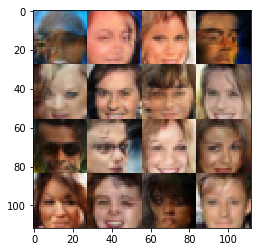

Epoch 6/8... Discriminator Loss: 1.3718 ... Generator Loss: 0.7558
Epoch 6/8... Discriminator Loss: 1.2744 ... Generator Loss: 0.8890
Epoch 6/8... Discriminator Loss: 1.3772 ... Generator Loss: 0.9872
Epoch 6/8... Discriminator Loss: 1.3156 ... Generator Loss: 0.7141
Epoch 6/8... Discriminator Loss: 1.3530 ... Generator Loss: 0.5049
Epoch 6/8... Discriminator Loss: 1.1894 ... Generator Loss: 0.7552
Epoch 6/8... Discriminator Loss: 1.3032 ... Generator Loss: 0.6290
Epoch 6/8... Discriminator Loss: 1.3463 ... Generator Loss: 1.0090
Epoch 6/8... Discriminator Loss: 1.2259 ... Generator Loss: 0.7878
Epoch 6/8... Discriminator Loss: 1.3434 ... Generator Loss: 0.6259


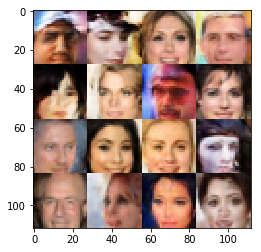

Epoch 6/8... Discriminator Loss: 1.2607 ... Generator Loss: 0.7321
Epoch 6/8... Discriminator Loss: 1.2253 ... Generator Loss: 0.8553
Epoch 6/8... Discriminator Loss: 1.3565 ... Generator Loss: 0.8014
Epoch 6/8... Discriminator Loss: 1.2447 ... Generator Loss: 0.7460
Epoch 6/8... Discriminator Loss: 1.2448 ... Generator Loss: 0.8286
Epoch 6/8... Discriminator Loss: 1.2849 ... Generator Loss: 0.7664
Epoch 6/8... Discriminator Loss: 1.3189 ... Generator Loss: 0.6479
Epoch 6/8... Discriminator Loss: 1.2935 ... Generator Loss: 0.6839
Epoch 6/8... Discriminator Loss: 1.3286 ... Generator Loss: 0.7005
Epoch 6/8... Discriminator Loss: 1.2653 ... Generator Loss: 0.8306


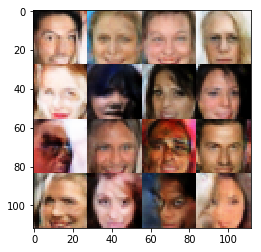

Epoch 6/8... Discriminator Loss: 1.4424 ... Generator Loss: 0.5447
Epoch 6/8... Discriminator Loss: 1.3893 ... Generator Loss: 1.0612
Epoch 6/8... Discriminator Loss: 1.2186 ... Generator Loss: 0.8161
Epoch 6/8... Discriminator Loss: 1.3377 ... Generator Loss: 0.6302
Epoch 6/8... Discriminator Loss: 1.1675 ... Generator Loss: 1.1018
Epoch 6/8... Discriminator Loss: 1.3693 ... Generator Loss: 0.6555
Epoch 6/8... Discriminator Loss: 1.3072 ... Generator Loss: 0.6665
Epoch 6/8... Discriminator Loss: 1.3831 ... Generator Loss: 0.8376
Epoch 6/8... Discriminator Loss: 1.3448 ... Generator Loss: 0.9792
Epoch 6/8... Discriminator Loss: 1.3770 ... Generator Loss: 1.0084


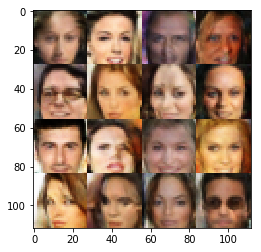

Epoch 6/8... Discriminator Loss: 1.1901 ... Generator Loss: 0.8554
Epoch 6/8... Discriminator Loss: 1.0549 ... Generator Loss: 0.9489
Epoch 6/8... Discriminator Loss: 1.2731 ... Generator Loss: 0.6614
Epoch 6/8... Discriminator Loss: 1.1381 ... Generator Loss: 1.0818
Epoch 6/8... Discriminator Loss: 1.2751 ... Generator Loss: 0.7089
Epoch 6/8... Discriminator Loss: 1.2389 ... Generator Loss: 0.6464
Epoch 6/8... Discriminator Loss: 1.2618 ... Generator Loss: 0.7532
Epoch 6/8... Discriminator Loss: 1.2947 ... Generator Loss: 0.7520
Epoch 6/8... Discriminator Loss: 1.3588 ... Generator Loss: 0.5380
Epoch 6/8... Discriminator Loss: 1.3540 ... Generator Loss: 0.5359


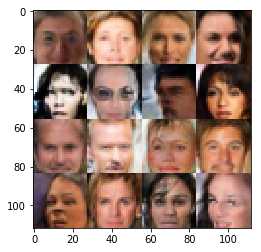

Epoch 6/8... Discriminator Loss: 1.3009 ... Generator Loss: 0.6346
Epoch 6/8... Discriminator Loss: 1.4950 ... Generator Loss: 0.4786
Epoch 6/8... Discriminator Loss: 1.4028 ... Generator Loss: 0.6045
Epoch 6/8... Discriminator Loss: 1.3018 ... Generator Loss: 0.8304
Epoch 6/8... Discriminator Loss: 1.3447 ... Generator Loss: 0.6365
Epoch 6/8... Discriminator Loss: 1.2479 ... Generator Loss: 0.6948
Epoch 6/8... Discriminator Loss: 1.2247 ... Generator Loss: 0.6896
Epoch 6/8... Discriminator Loss: 1.3553 ... Generator Loss: 0.7696
Epoch 6/8... Discriminator Loss: 1.3894 ... Generator Loss: 0.6095
Epoch 6/8... Discriminator Loss: 1.1493 ... Generator Loss: 0.7102


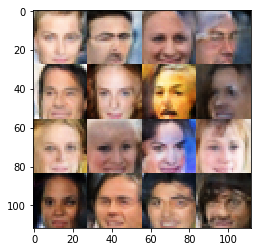

Epoch 6/8... Discriminator Loss: 1.4463 ... Generator Loss: 0.9218
Epoch 6/8... Discriminator Loss: 1.3306 ... Generator Loss: 0.6991
Epoch 6/8... Discriminator Loss: 1.1893 ... Generator Loss: 0.7934
Epoch 6/8... Discriminator Loss: 1.2599 ... Generator Loss: 0.8079
Epoch 6/8... Discriminator Loss: 1.2848 ... Generator Loss: 0.8651
Epoch 6/8... Discriminator Loss: 1.2942 ... Generator Loss: 0.6281
Epoch 6/8... Discriminator Loss: 1.3193 ... Generator Loss: 0.7908
Epoch 6/8... Discriminator Loss: 1.2536 ... Generator Loss: 0.7735
Epoch 6/8... Discriminator Loss: 1.1848 ... Generator Loss: 0.7419
Epoch 6/8... Discriminator Loss: 1.3757 ... Generator Loss: 0.8380


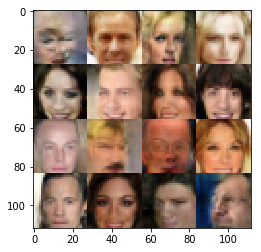

Epoch 6/8... Discriminator Loss: 1.3600 ... Generator Loss: 0.5316
Epoch 6/8... Discriminator Loss: 1.3748 ... Generator Loss: 0.5235
Epoch 6/8... Discriminator Loss: 1.3300 ... Generator Loss: 0.5836
Epoch 6/8... Discriminator Loss: 1.2151 ... Generator Loss: 0.6763
Epoch 6/8... Discriminator Loss: 1.2692 ... Generator Loss: 0.6520
Epoch 6/8... Discriminator Loss: 1.2378 ... Generator Loss: 0.7501
Epoch 6/8... Discriminator Loss: 1.2963 ... Generator Loss: 0.5891
Epoch 6/8... Discriminator Loss: 1.2158 ... Generator Loss: 0.8607
Epoch 6/8... Discriminator Loss: 1.1371 ... Generator Loss: 0.8202
Epoch 6/8... Discriminator Loss: 1.3577 ... Generator Loss: 0.5260


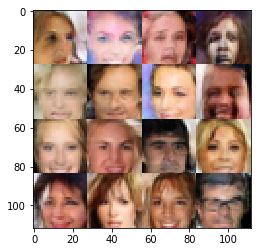

Epoch 6/8... Discriminator Loss: 1.2557 ... Generator Loss: 0.6739
Epoch 6/8... Discriminator Loss: 1.2849 ... Generator Loss: 0.7348
Epoch 6/8... Discriminator Loss: 1.1997 ... Generator Loss: 0.7290
Epoch 6/8... Discriminator Loss: 1.1937 ... Generator Loss: 0.7299
Epoch 6/8... Discriminator Loss: 1.2010 ... Generator Loss: 0.7943
Epoch 6/8... Discriminator Loss: 1.3599 ... Generator Loss: 0.5864
Epoch 6/8... Discriminator Loss: 1.3991 ... Generator Loss: 0.5044
Epoch 6/8... Discriminator Loss: 1.2202 ... Generator Loss: 0.7986
Epoch 6/8... Discriminator Loss: 1.3659 ... Generator Loss: 0.9436
Epoch 6/8... Discriminator Loss: 1.3934 ... Generator Loss: 0.5935


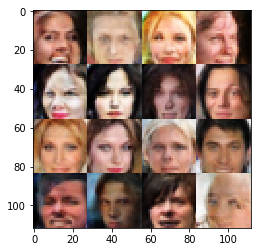

Epoch 6/8... Discriminator Loss: 1.3058 ... Generator Loss: 0.6591
Epoch 6/8... Discriminator Loss: 1.2458 ... Generator Loss: 0.6565
Epoch 6/8... Discriminator Loss: 1.3266 ... Generator Loss: 0.7655
Epoch 6/8... Discriminator Loss: 1.1872 ... Generator Loss: 0.7578
Epoch 6/8... Discriminator Loss: 1.2445 ... Generator Loss: 0.7116
Epoch 6/8... Discriminator Loss: 1.3052 ... Generator Loss: 0.7739
Epoch 6/8... Discriminator Loss: 1.2532 ... Generator Loss: 0.9524
Epoch 6/8... Discriminator Loss: 1.2064 ... Generator Loss: 0.6686
Epoch 6/8... Discriminator Loss: 1.3247 ... Generator Loss: 0.5337
Epoch 6/8... Discriminator Loss: 1.2525 ... Generator Loss: 0.6564


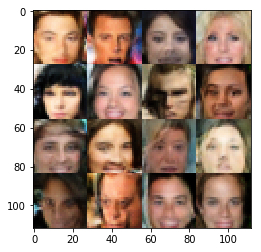

Epoch 6/8... Discriminator Loss: 1.2761 ... Generator Loss: 0.8510
Epoch 6/8... Discriminator Loss: 1.2193 ... Generator Loss: 0.9219
Epoch 6/8... Discriminator Loss: 1.3178 ... Generator Loss: 0.7724
Epoch 6/8... Discriminator Loss: 1.2348 ... Generator Loss: 0.8384
Epoch 6/8... Discriminator Loss: 1.4060 ... Generator Loss: 0.5642
Epoch 6/8... Discriminator Loss: 1.2820 ... Generator Loss: 0.6782
Epoch 6/8... Discriminator Loss: 1.0710 ... Generator Loss: 0.8508
Epoch 6/8... Discriminator Loss: 1.2322 ... Generator Loss: 0.8566
Epoch 6/8... Discriminator Loss: 1.2687 ... Generator Loss: 0.6387
Epoch 6/8... Discriminator Loss: 1.3151 ... Generator Loss: 0.9471


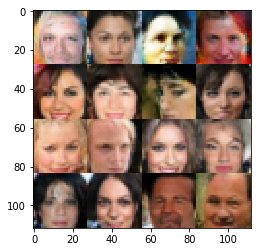

Epoch 6/8... Discriminator Loss: 1.2532 ... Generator Loss: 0.7464
Epoch 6/8... Discriminator Loss: 1.2989 ... Generator Loss: 0.6496
Epoch 6/8... Discriminator Loss: 1.2232 ... Generator Loss: 0.8272
Epoch 6/8... Discriminator Loss: 1.2863 ... Generator Loss: 0.7292
Epoch 6/8... Discriminator Loss: 1.3213 ... Generator Loss: 0.6810
Epoch 6/8... Discriminator Loss: 1.3558 ... Generator Loss: 0.9029
Epoch 6/8... Discriminator Loss: 1.2421 ... Generator Loss: 0.8037
Epoch 6/8... Discriminator Loss: 1.2895 ... Generator Loss: 0.8161
Epoch 6/8... Discriminator Loss: 1.1941 ... Generator Loss: 0.7386
Epoch 6/8... Discriminator Loss: 1.2032 ... Generator Loss: 0.9736


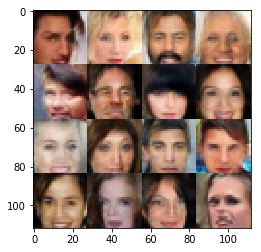

Epoch 6/8... Discriminator Loss: 1.4053 ... Generator Loss: 0.9510
Epoch 6/8... Discriminator Loss: 1.2796 ... Generator Loss: 0.8956
Epoch 6/8... Discriminator Loss: 1.3663 ... Generator Loss: 1.0847
Epoch 6/8... Discriminator Loss: 1.4812 ... Generator Loss: 0.6228
Epoch 6/8... Discriminator Loss: 1.2386 ... Generator Loss: 0.6656
Epoch 6/8... Discriminator Loss: 1.2852 ... Generator Loss: 0.9010
Epoch 6/8... Discriminator Loss: 1.2537 ... Generator Loss: 0.6871
Epoch 6/8... Discriminator Loss: 1.2940 ... Generator Loss: 1.0626
Epoch 6/8... Discriminator Loss: 1.3390 ... Generator Loss: 0.7271
Epoch 6/8... Discriminator Loss: 1.1382 ... Generator Loss: 0.7467


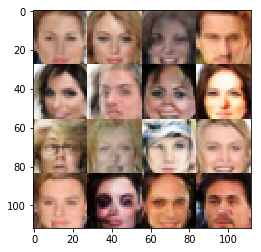

Epoch 6/8... Discriminator Loss: 1.2729 ... Generator Loss: 0.6999
Epoch 6/8... Discriminator Loss: 1.3291 ... Generator Loss: 0.5773
Epoch 6/8... Discriminator Loss: 1.3237 ... Generator Loss: 0.5524
Epoch 6/8... Discriminator Loss: 1.2552 ... Generator Loss: 0.7341
Epoch 6/8... Discriminator Loss: 1.3148 ... Generator Loss: 0.6759
Epoch 6/8... Discriminator Loss: 1.4261 ... Generator Loss: 0.5503
Epoch 6/8... Discriminator Loss: 1.2433 ... Generator Loss: 0.6756
Epoch 6/8... Discriminator Loss: 1.2878 ... Generator Loss: 1.1982
Epoch 6/8... Discriminator Loss: 1.2317 ... Generator Loss: 0.8069
Epoch 6/8... Discriminator Loss: 1.2309 ... Generator Loss: 0.6589


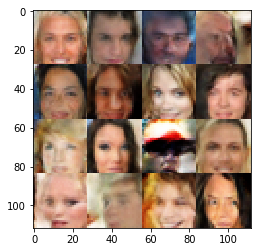

Epoch 6/8... Discriminator Loss: 1.3151 ... Generator Loss: 0.5954
Epoch 6/8... Discriminator Loss: 1.2661 ... Generator Loss: 0.7847
Epoch 6/8... Discriminator Loss: 1.3123 ... Generator Loss: 0.6313
Epoch 6/8... Discriminator Loss: 1.4159 ... Generator Loss: 0.4542
Epoch 6/8... Discriminator Loss: 1.1328 ... Generator Loss: 0.8607
Epoch 6/8... Discriminator Loss: 1.2526 ... Generator Loss: 0.6795
Epoch 6/8... Discriminator Loss: 1.3250 ... Generator Loss: 0.7823
Epoch 6/8... Discriminator Loss: 1.2638 ... Generator Loss: 0.8370
Epoch 6/8... Discriminator Loss: 1.2940 ... Generator Loss: 0.7266
Epoch 6/8... Discriminator Loss: 1.2308 ... Generator Loss: 0.8287


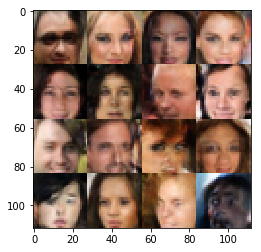

Epoch 6/8... Discriminator Loss: 1.2617 ... Generator Loss: 0.6182
Epoch 6/8... Discriminator Loss: 1.2476 ... Generator Loss: 1.0671
Epoch 6/8... Discriminator Loss: 1.1584 ... Generator Loss: 0.8048
Epoch 6/8... Discriminator Loss: 1.3077 ... Generator Loss: 0.7494
Epoch 6/8... Discriminator Loss: 1.2219 ... Generator Loss: 0.7736
Epoch 6/8... Discriminator Loss: 1.4004 ... Generator Loss: 0.5967
Epoch 6/8... Discriminator Loss: 1.2738 ... Generator Loss: 0.6417
Epoch 6/8... Discriminator Loss: 1.2960 ... Generator Loss: 0.7527
Epoch 6/8... Discriminator Loss: 1.3128 ... Generator Loss: 0.5808
Epoch 6/8... Discriminator Loss: 1.2542 ... Generator Loss: 0.8091


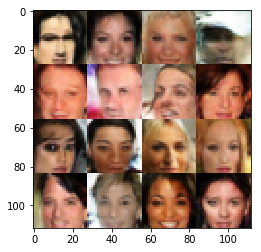

Epoch 6/8... Discriminator Loss: 1.3156 ... Generator Loss: 0.6234
Epoch 6/8... Discriminator Loss: 1.2034 ... Generator Loss: 0.9462
Epoch 6/8... Discriminator Loss: 1.2851 ... Generator Loss: 0.7261
Epoch 6/8... Discriminator Loss: 1.2760 ... Generator Loss: 0.8047
Epoch 6/8... Discriminator Loss: 1.2506 ... Generator Loss: 0.7871
Epoch 6/8... Discriminator Loss: 1.2417 ... Generator Loss: 0.5752
Epoch 6/8... Discriminator Loss: 1.3106 ... Generator Loss: 0.7624
Epoch 6/8... Discriminator Loss: 1.3629 ... Generator Loss: 0.7886
Epoch 6/8... Discriminator Loss: 1.3215 ... Generator Loss: 0.6303
Epoch 6/8... Discriminator Loss: 1.3122 ... Generator Loss: 0.7062


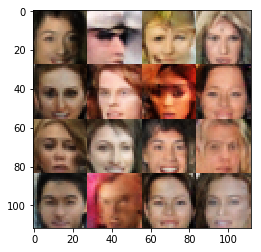

Epoch 6/8... Discriminator Loss: 1.2509 ... Generator Loss: 0.8702
Epoch 6/8... Discriminator Loss: 1.3833 ... Generator Loss: 0.7567
Epoch 6/8... Discriminator Loss: 1.1792 ... Generator Loss: 0.7247
Epoch 6/8... Discriminator Loss: 1.3848 ... Generator Loss: 0.7592
Epoch 6/8... Discriminator Loss: 1.3236 ... Generator Loss: 0.6510
Epoch 6/8... Discriminator Loss: 1.2187 ... Generator Loss: 0.7395
Epoch 6/8... Discriminator Loss: 1.3675 ... Generator Loss: 0.5874
Epoch 6/8... Discriminator Loss: 1.3777 ... Generator Loss: 0.6694
Epoch 6/8... Discriminator Loss: 1.2683 ... Generator Loss: 0.7502
Epoch 6/8... Discriminator Loss: 1.4092 ... Generator Loss: 0.6511


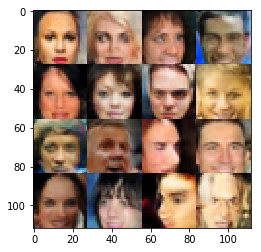

Epoch 6/8... Discriminator Loss: 1.3112 ... Generator Loss: 0.7404
Epoch 6/8... Discriminator Loss: 1.2534 ... Generator Loss: 0.7212
Epoch 6/8... Discriminator Loss: 1.2922 ... Generator Loss: 0.6526
Epoch 6/8... Discriminator Loss: 1.2259 ... Generator Loss: 0.6893
Epoch 6/8... Discriminator Loss: 1.2170 ... Generator Loss: 0.6332
Epoch 6/8... Discriminator Loss: 1.2116 ... Generator Loss: 0.8373
Epoch 6/8... Discriminator Loss: 1.2700 ... Generator Loss: 0.7367
Epoch 6/8... Discriminator Loss: 1.2748 ... Generator Loss: 0.6593
Epoch 6/8... Discriminator Loss: 1.2181 ... Generator Loss: 0.8004
Epoch 6/8... Discriminator Loss: 1.2691 ... Generator Loss: 0.6886


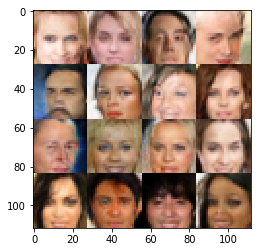

Epoch 6/8... Discriminator Loss: 1.1999 ... Generator Loss: 0.6307
Epoch 6/8... Discriminator Loss: 1.3177 ... Generator Loss: 0.7354
Epoch 6/8... Discriminator Loss: 1.2303 ... Generator Loss: 0.6622
Epoch 6/8... Discriminator Loss: 1.1969 ... Generator Loss: 0.7387
Epoch 6/8... Discriminator Loss: 1.2754 ... Generator Loss: 0.7238
Epoch 6/8... Discriminator Loss: 1.3906 ... Generator Loss: 1.0917
Epoch 6/8... Discriminator Loss: 1.2676 ... Generator Loss: 0.6420
Epoch 6/8... Discriminator Loss: 1.2648 ... Generator Loss: 0.8479
Epoch 6/8... Discriminator Loss: 1.3005 ... Generator Loss: 0.6251
Epoch 6/8... Discriminator Loss: 1.2604 ... Generator Loss: 0.8695


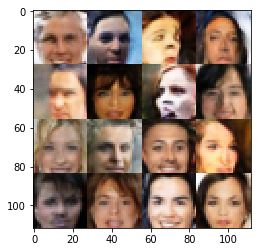

Epoch 6/8... Discriminator Loss: 1.2451 ... Generator Loss: 0.7148
Epoch 6/8... Discriminator Loss: 1.2297 ... Generator Loss: 0.7175
Epoch 6/8... Discriminator Loss: 1.2526 ... Generator Loss: 0.7660
Epoch 6/8... Discriminator Loss: 1.2702 ... Generator Loss: 0.7218
Epoch 6/8... Discriminator Loss: 1.2438 ... Generator Loss: 0.6855
Epoch 6/8... Discriminator Loss: 1.2975 ... Generator Loss: 0.7897
Epoch 6/8... Discriminator Loss: 1.2539 ... Generator Loss: 1.0930
Epoch 6/8... Discriminator Loss: 1.2590 ... Generator Loss: 0.7660
Epoch 6/8... Discriminator Loss: 1.3169 ... Generator Loss: 0.5793
Epoch 6/8... Discriminator Loss: 1.2857 ... Generator Loss: 0.6137


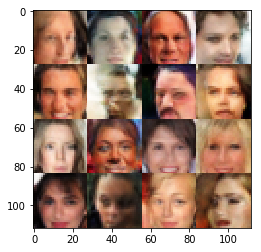

Epoch 6/8... Discriminator Loss: 1.4129 ... Generator Loss: 0.6034
Epoch 6/8... Discriminator Loss: 1.2921 ... Generator Loss: 0.6264
Epoch 6/8... Discriminator Loss: 1.2847 ... Generator Loss: 0.6715
Epoch 6/8... Discriminator Loss: 1.2665 ... Generator Loss: 0.6993
Epoch 6/8... Discriminator Loss: 1.3431 ... Generator Loss: 0.7479
Epoch 6/8... Discriminator Loss: 1.2645 ... Generator Loss: 0.7922
Epoch 6/8... Discriminator Loss: 1.3911 ... Generator Loss: 0.8758
Epoch 6/8... Discriminator Loss: 1.3122 ... Generator Loss: 0.6048
Epoch 6/8... Discriminator Loss: 1.2354 ... Generator Loss: 0.8598
Epoch 6/8... Discriminator Loss: 1.3372 ... Generator Loss: 0.9595


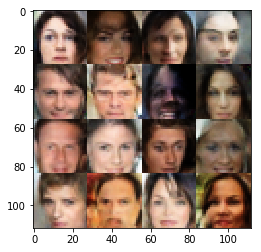

Epoch 6/8... Discriminator Loss: 1.1458 ... Generator Loss: 0.9963
Epoch 6/8... Discriminator Loss: 1.2363 ... Generator Loss: 0.8079
Epoch 6/8... Discriminator Loss: 1.2116 ... Generator Loss: 0.6700
Epoch 6/8... Discriminator Loss: 1.3097 ... Generator Loss: 0.7190
Epoch 6/8... Discriminator Loss: 1.3513 ... Generator Loss: 0.9428
Epoch 6/8... Discriminator Loss: 1.3645 ... Generator Loss: 0.9456
Epoch 6/8... Discriminator Loss: 1.2040 ... Generator Loss: 0.8224
Epoch 6/8... Discriminator Loss: 1.1508 ... Generator Loss: 0.9334
Epoch 6/8... Discriminator Loss: 1.2652 ... Generator Loss: 0.7931
Epoch 6/8... Discriminator Loss: 1.3131 ... Generator Loss: 0.6887


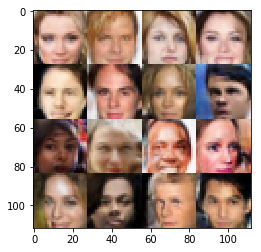

Epoch 6/8... Discriminator Loss: 1.3783 ... Generator Loss: 1.0545
Epoch 6/8... Discriminator Loss: 1.2790 ... Generator Loss: 0.7073
Epoch 6/8... Discriminator Loss: 1.5384 ... Generator Loss: 0.6478
Epoch 6/8... Discriminator Loss: 1.2799 ... Generator Loss: 0.9766
Epoch 6/8... Discriminator Loss: 1.3222 ... Generator Loss: 0.5199
Epoch 6/8... Discriminator Loss: 1.0957 ... Generator Loss: 1.5018
Epoch 6/8... Discriminator Loss: 1.3559 ... Generator Loss: 0.6118
Epoch 6/8... Discriminator Loss: 1.3129 ... Generator Loss: 0.6844
Epoch 6/8... Discriminator Loss: 1.2912 ... Generator Loss: 0.7019
Epoch 6/8... Discriminator Loss: 1.3929 ... Generator Loss: 0.9524


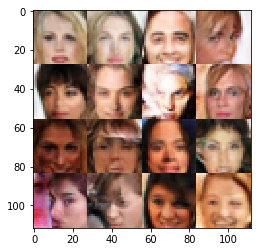

Epoch 6/8... Discriminator Loss: 1.2383 ... Generator Loss: 0.7381
Epoch 6/8... Discriminator Loss: 1.3991 ... Generator Loss: 0.6475
Epoch 6/8... Discriminator Loss: 1.3199 ... Generator Loss: 0.5905
Epoch 6/8... Discriminator Loss: 1.3725 ... Generator Loss: 0.5226
Epoch 6/8... Discriminator Loss: 1.3157 ... Generator Loss: 0.5905
Epoch 6/8... Discriminator Loss: 1.2275 ... Generator Loss: 0.8970
Epoch 6/8... Discriminator Loss: 1.3411 ... Generator Loss: 0.8079
Epoch 6/8... Discriminator Loss: 1.2515 ... Generator Loss: 0.7160
Epoch 6/8... Discriminator Loss: 1.2047 ... Generator Loss: 0.7158
Epoch 6/8... Discriminator Loss: 1.3000 ... Generator Loss: 0.7050


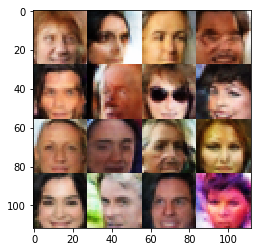

Epoch 6/8... Discriminator Loss: 1.3197 ... Generator Loss: 0.8707
Epoch 6/8... Discriminator Loss: 1.3370 ... Generator Loss: 0.5456
Epoch 6/8... Discriminator Loss: 1.4372 ... Generator Loss: 0.5071
Epoch 6/8... Discriminator Loss: 1.3396 ... Generator Loss: 0.6189
Epoch 6/8... Discriminator Loss: 1.1614 ... Generator Loss: 0.7900
Epoch 6/8... Discriminator Loss: 1.1248 ... Generator Loss: 1.0167
Epoch 6/8... Discriminator Loss: 1.2828 ... Generator Loss: 0.5166
Epoch 6/8... Discriminator Loss: 1.2906 ... Generator Loss: 0.7185
Epoch 6/8... Discriminator Loss: 1.3711 ... Generator Loss: 0.8065
Epoch 6/8... Discriminator Loss: 1.4272 ... Generator Loss: 0.5659


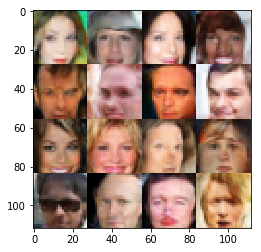

Epoch 6/8... Discriminator Loss: 1.2959 ... Generator Loss: 0.6979
Epoch 6/8... Discriminator Loss: 1.3072 ... Generator Loss: 0.8466
Epoch 6/8... Discriminator Loss: 1.2752 ... Generator Loss: 0.8383
Epoch 6/8... Discriminator Loss: 1.3089 ... Generator Loss: 0.5767
Epoch 6/8... Discriminator Loss: 1.2255 ... Generator Loss: 0.8728
Epoch 6/8... Discriminator Loss: 1.2942 ... Generator Loss: 0.6151
Epoch 6/8... Discriminator Loss: 1.2037 ... Generator Loss: 0.8013
Epoch 6/8... Discriminator Loss: 1.3389 ... Generator Loss: 0.5565
Epoch 6/8... Discriminator Loss: 1.2258 ... Generator Loss: 0.7218
Epoch 6/8... Discriminator Loss: 1.2985 ... Generator Loss: 0.6390


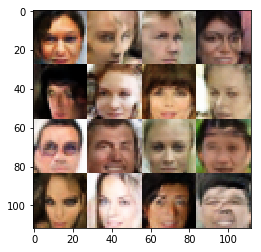

Epoch 6/8... Discriminator Loss: 1.2643 ... Generator Loss: 0.8793
Epoch 6/8... Discriminator Loss: 1.1653 ... Generator Loss: 0.6799
Epoch 6/8... Discriminator Loss: 1.4138 ... Generator Loss: 0.6383
Epoch 6/8... Discriminator Loss: 1.2982 ... Generator Loss: 0.6550
Epoch 6/8... Discriminator Loss: 1.3377 ... Generator Loss: 0.5876
Epoch 6/8... Discriminator Loss: 0.9997 ... Generator Loss: 1.0017
Epoch 6/8... Discriminator Loss: 1.3020 ... Generator Loss: 0.7164
Epoch 6/8... Discriminator Loss: 1.2770 ... Generator Loss: 0.7647
Epoch 6/8... Discriminator Loss: 1.3026 ... Generator Loss: 0.6715
Epoch 6/8... Discriminator Loss: 1.3389 ... Generator Loss: 0.9767


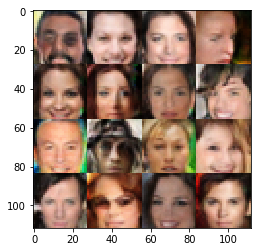

Epoch 6/8... Discriminator Loss: 1.4409 ... Generator Loss: 0.6226
Epoch 6/8... Discriminator Loss: 1.3065 ... Generator Loss: 0.6492
Epoch 6/8... Discriminator Loss: 1.2719 ... Generator Loss: 0.8700
Epoch 6/8... Discriminator Loss: 1.1647 ... Generator Loss: 0.8981
Epoch 6/8... Discriminator Loss: 1.3174 ... Generator Loss: 1.0033
Epoch 6/8... Discriminator Loss: 1.2648 ... Generator Loss: 0.9744
Epoch 6/8... Discriminator Loss: 1.2754 ... Generator Loss: 0.8116
Epoch 6/8... Discriminator Loss: 1.3435 ... Generator Loss: 0.5024
Epoch 6/8... Discriminator Loss: 1.2948 ... Generator Loss: 0.8345
Epoch 6/8... Discriminator Loss: 1.2890 ... Generator Loss: 0.7297


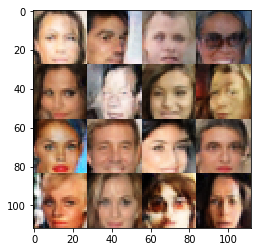

Epoch 6/8... Discriminator Loss: 1.3389 ... Generator Loss: 0.5674
Epoch 6/8... Discriminator Loss: 1.2372 ... Generator Loss: 0.7580
Epoch 6/8... Discriminator Loss: 1.2873 ... Generator Loss: 0.7461
Epoch 6/8... Discriminator Loss: 1.3629 ... Generator Loss: 0.8357
Epoch 6/8... Discriminator Loss: 1.3450 ... Generator Loss: 0.7116
Epoch 6/8... Discriminator Loss: 1.2724 ... Generator Loss: 0.6584
Epoch 6/8... Discriminator Loss: 1.2461 ... Generator Loss: 0.8496
Epoch 6/8... Discriminator Loss: 1.2459 ... Generator Loss: 0.9957
Epoch 6/8... Discriminator Loss: 1.2662 ... Generator Loss: 0.7475
Epoch 6/8... Discriminator Loss: 1.3038 ... Generator Loss: 0.6802


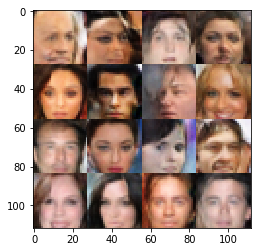

Epoch 6/8... Discriminator Loss: 1.3057 ... Generator Loss: 0.6163
Epoch 6/8... Discriminator Loss: 1.1976 ... Generator Loss: 0.9204
Epoch 6/8... Discriminator Loss: 1.2314 ... Generator Loss: 0.7419
Epoch 6/8... Discriminator Loss: 1.4022 ... Generator Loss: 0.5930
Epoch 6/8... Discriminator Loss: 1.1416 ... Generator Loss: 0.8620
Epoch 6/8... Discriminator Loss: 1.3570 ... Generator Loss: 0.8790
Epoch 6/8... Discriminator Loss: 1.3019 ... Generator Loss: 0.7912
Epoch 6/8... Discriminator Loss: 1.3077 ... Generator Loss: 0.5719
Epoch 6/8... Discriminator Loss: 1.2163 ... Generator Loss: 0.7177


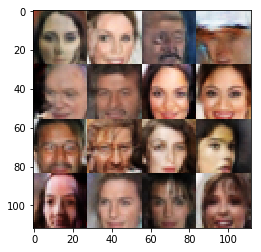

Epoch 7/8... Discriminator Loss: 1.4120 ... Generator Loss: 0.5723


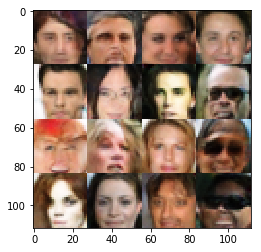

Epoch 7/8... Discriminator Loss: 1.2750 ... Generator Loss: 0.8339
Epoch 7/8... Discriminator Loss: 1.2076 ... Generator Loss: 0.7021
Epoch 7/8... Discriminator Loss: 1.3738 ... Generator Loss: 0.5840
Epoch 7/8... Discriminator Loss: 1.2673 ... Generator Loss: 0.8089
Epoch 7/8... Discriminator Loss: 1.2994 ... Generator Loss: 0.7126
Epoch 7/8... Discriminator Loss: 1.4104 ... Generator Loss: 0.5529
Epoch 7/8... Discriminator Loss: 1.2085 ... Generator Loss: 0.8031
Epoch 7/8... Discriminator Loss: 1.2744 ... Generator Loss: 0.7759
Epoch 7/8... Discriminator Loss: 1.3044 ... Generator Loss: 0.7781
Epoch 7/8... Discriminator Loss: 1.2758 ... Generator Loss: 0.5641


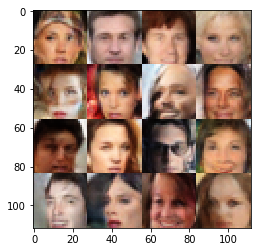

Epoch 7/8... Discriminator Loss: 1.3016 ... Generator Loss: 0.6982
Epoch 7/8... Discriminator Loss: 1.2224 ... Generator Loss: 0.7743
Epoch 7/8... Discriminator Loss: 1.3662 ... Generator Loss: 0.8139
Epoch 7/8... Discriminator Loss: 1.4429 ... Generator Loss: 1.1107
Epoch 7/8... Discriminator Loss: 1.4093 ... Generator Loss: 0.5317
Epoch 7/8... Discriminator Loss: 1.2182 ... Generator Loss: 0.9170
Epoch 7/8... Discriminator Loss: 1.2793 ... Generator Loss: 0.7729
Epoch 7/8... Discriminator Loss: 1.3232 ... Generator Loss: 0.7935
Epoch 7/8... Discriminator Loss: 1.3257 ... Generator Loss: 0.6831
Epoch 7/8... Discriminator Loss: 1.3732 ... Generator Loss: 0.5569


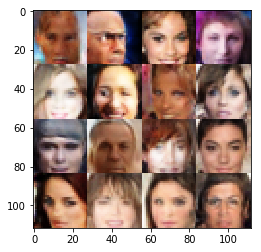

Epoch 7/8... Discriminator Loss: 1.3297 ... Generator Loss: 0.8756
Epoch 7/8... Discriminator Loss: 1.3022 ... Generator Loss: 0.6159
Epoch 7/8... Discriminator Loss: 1.2902 ... Generator Loss: 0.6068
Epoch 7/8... Discriminator Loss: 1.3003 ... Generator Loss: 0.6178
Epoch 7/8... Discriminator Loss: 1.2729 ... Generator Loss: 0.7187
Epoch 7/8... Discriminator Loss: 1.2131 ... Generator Loss: 0.7629
Epoch 7/8... Discriminator Loss: 1.3445 ... Generator Loss: 0.4962
Epoch 7/8... Discriminator Loss: 1.2718 ... Generator Loss: 0.8591
Epoch 7/8... Discriminator Loss: 1.1886 ... Generator Loss: 0.9385
Epoch 7/8... Discriminator Loss: 1.3016 ... Generator Loss: 0.6157


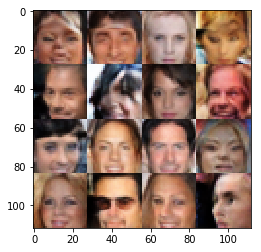

Epoch 7/8... Discriminator Loss: 1.2802 ... Generator Loss: 0.6661
Epoch 7/8... Discriminator Loss: 1.3645 ... Generator Loss: 0.6747
Epoch 7/8... Discriminator Loss: 1.2519 ... Generator Loss: 0.8732
Epoch 7/8... Discriminator Loss: 1.2148 ... Generator Loss: 0.8107
Epoch 7/8... Discriminator Loss: 1.2496 ... Generator Loss: 0.6822
Epoch 7/8... Discriminator Loss: 1.3905 ... Generator Loss: 0.5740
Epoch 7/8... Discriminator Loss: 1.2905 ... Generator Loss: 0.9220
Epoch 7/8... Discriminator Loss: 1.2163 ... Generator Loss: 0.8171
Epoch 7/8... Discriminator Loss: 1.2703 ... Generator Loss: 0.9966
Epoch 7/8... Discriminator Loss: 1.3801 ... Generator Loss: 0.6114


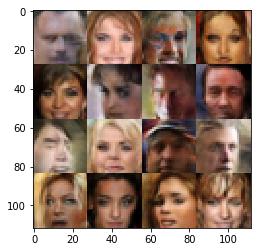

Epoch 7/8... Discriminator Loss: 1.4065 ... Generator Loss: 0.8718
Epoch 7/8... Discriminator Loss: 1.4137 ... Generator Loss: 0.4723
Epoch 7/8... Discriminator Loss: 1.2482 ... Generator Loss: 0.7516
Epoch 7/8... Discriminator Loss: 1.2946 ... Generator Loss: 0.8389
Epoch 7/8... Discriminator Loss: 1.4073 ... Generator Loss: 0.5569
Epoch 7/8... Discriminator Loss: 1.3223 ... Generator Loss: 0.8634
Epoch 7/8... Discriminator Loss: 1.2757 ... Generator Loss: 0.6756
Epoch 7/8... Discriminator Loss: 1.2876 ... Generator Loss: 0.6081
Epoch 7/8... Discriminator Loss: 1.2984 ... Generator Loss: 0.5179
Epoch 7/8... Discriminator Loss: 1.2536 ... Generator Loss: 0.8296


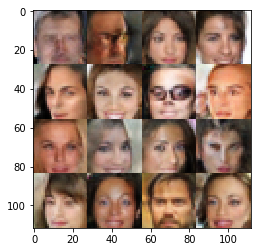

Epoch 7/8... Discriminator Loss: 1.2389 ... Generator Loss: 0.6727
Epoch 7/8... Discriminator Loss: 1.2228 ... Generator Loss: 0.9013
Epoch 7/8... Discriminator Loss: 1.2271 ... Generator Loss: 0.7099
Epoch 7/8... Discriminator Loss: 1.2412 ... Generator Loss: 0.6062
Epoch 7/8... Discriminator Loss: 1.2391 ... Generator Loss: 0.6718
Epoch 7/8... Discriminator Loss: 1.0456 ... Generator Loss: 0.9981
Epoch 7/8... Discriminator Loss: 1.2707 ... Generator Loss: 0.7272
Epoch 7/8... Discriminator Loss: 1.4248 ... Generator Loss: 0.6112
Epoch 7/8... Discriminator Loss: 1.2156 ... Generator Loss: 0.6952
Epoch 7/8... Discriminator Loss: 1.3229 ... Generator Loss: 0.6422


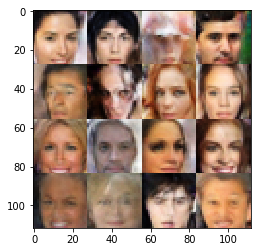

Epoch 7/8... Discriminator Loss: 1.4662 ... Generator Loss: 0.4353
Epoch 7/8... Discriminator Loss: 1.4545 ... Generator Loss: 0.5308
Epoch 7/8... Discriminator Loss: 1.2050 ... Generator Loss: 0.9472
Epoch 7/8... Discriminator Loss: 1.2607 ... Generator Loss: 0.8373
Epoch 7/8... Discriminator Loss: 1.2167 ... Generator Loss: 0.6771
Epoch 7/8... Discriminator Loss: 1.2620 ... Generator Loss: 0.5953
Epoch 7/8... Discriminator Loss: 1.3146 ... Generator Loss: 0.7868
Epoch 7/8... Discriminator Loss: 1.3236 ... Generator Loss: 0.7774
Epoch 7/8... Discriminator Loss: 1.3971 ... Generator Loss: 0.4791
Epoch 7/8... Discriminator Loss: 1.2619 ... Generator Loss: 0.5744


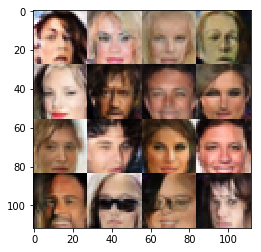

Epoch 7/8... Discriminator Loss: 1.2900 ... Generator Loss: 0.5755
Epoch 7/8... Discriminator Loss: 1.1365 ... Generator Loss: 0.8828
Epoch 7/8... Discriminator Loss: 1.2392 ... Generator Loss: 0.8493
Epoch 7/8... Discriminator Loss: 1.2986 ... Generator Loss: 0.7409
Epoch 7/8... Discriminator Loss: 1.2172 ... Generator Loss: 0.6691
Epoch 7/8... Discriminator Loss: 1.2204 ... Generator Loss: 0.7008
Epoch 7/8... Discriminator Loss: 1.3294 ... Generator Loss: 0.6667
Epoch 7/8... Discriminator Loss: 1.3791 ... Generator Loss: 0.5695
Epoch 7/8... Discriminator Loss: 1.3178 ... Generator Loss: 0.7341
Epoch 7/8... Discriminator Loss: 1.3098 ... Generator Loss: 1.0404


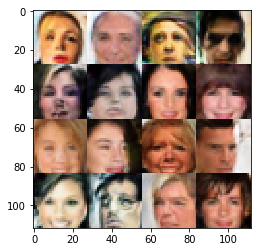

Epoch 7/8... Discriminator Loss: 1.2844 ... Generator Loss: 0.6383
Epoch 7/8... Discriminator Loss: 1.2244 ... Generator Loss: 0.8265
Epoch 7/8... Discriminator Loss: 1.3180 ... Generator Loss: 0.6916
Epoch 7/8... Discriminator Loss: 1.2859 ... Generator Loss: 0.8645
Epoch 7/8... Discriminator Loss: 1.0835 ... Generator Loss: 0.8628
Epoch 7/8... Discriminator Loss: 1.3790 ... Generator Loss: 0.4950
Epoch 7/8... Discriminator Loss: 1.4471 ... Generator Loss: 0.4948
Epoch 7/8... Discriminator Loss: 1.3462 ... Generator Loss: 0.6133
Epoch 7/8... Discriminator Loss: 1.0785 ... Generator Loss: 0.7975
Epoch 7/8... Discriminator Loss: 1.2900 ... Generator Loss: 0.7836


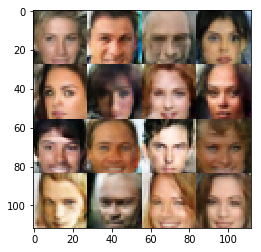

Epoch 7/8... Discriminator Loss: 1.3571 ... Generator Loss: 0.7584
Epoch 7/8... Discriminator Loss: 1.2956 ... Generator Loss: 1.0226
Epoch 7/8... Discriminator Loss: 1.2010 ... Generator Loss: 0.8554
Epoch 7/8... Discriminator Loss: 1.1184 ... Generator Loss: 0.8625
Epoch 7/8... Discriminator Loss: 1.2416 ... Generator Loss: 0.8972
Epoch 7/8... Discriminator Loss: 1.3320 ... Generator Loss: 0.9273
Epoch 7/8... Discriminator Loss: 1.2709 ... Generator Loss: 0.6677
Epoch 7/8... Discriminator Loss: 1.3215 ... Generator Loss: 0.8099
Epoch 7/8... Discriminator Loss: 1.2460 ... Generator Loss: 0.7238
Epoch 7/8... Discriminator Loss: 1.2844 ... Generator Loss: 0.7881


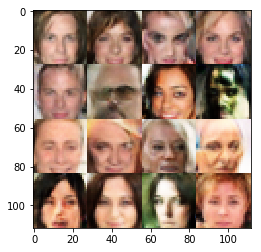

Epoch 7/8... Discriminator Loss: 1.3361 ... Generator Loss: 0.6036
Epoch 7/8... Discriminator Loss: 1.2706 ... Generator Loss: 0.7051
Epoch 7/8... Discriminator Loss: 1.2940 ... Generator Loss: 0.6097
Epoch 7/8... Discriminator Loss: 1.2920 ... Generator Loss: 0.8209
Epoch 7/8... Discriminator Loss: 1.2679 ... Generator Loss: 0.7054
Epoch 7/8... Discriminator Loss: 1.3417 ... Generator Loss: 0.7875
Epoch 7/8... Discriminator Loss: 1.2924 ... Generator Loss: 0.6949
Epoch 7/8... Discriminator Loss: 1.0925 ... Generator Loss: 0.8453
Epoch 7/8... Discriminator Loss: 1.2839 ... Generator Loss: 0.5980
Epoch 7/8... Discriminator Loss: 1.2781 ... Generator Loss: 1.0844


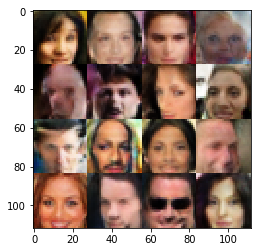

Epoch 7/8... Discriminator Loss: 1.4805 ... Generator Loss: 0.8321
Epoch 7/8... Discriminator Loss: 1.3052 ... Generator Loss: 0.6991
Epoch 7/8... Discriminator Loss: 1.4159 ... Generator Loss: 1.1280
Epoch 7/8... Discriminator Loss: 1.2355 ... Generator Loss: 0.8395
Epoch 7/8... Discriminator Loss: 1.2298 ... Generator Loss: 0.7401
Epoch 7/8... Discriminator Loss: 1.2118 ... Generator Loss: 0.6658
Epoch 7/8... Discriminator Loss: 1.3166 ... Generator Loss: 0.6744
Epoch 7/8... Discriminator Loss: 1.1383 ... Generator Loss: 0.6904
Epoch 7/8... Discriminator Loss: 1.3265 ... Generator Loss: 0.8452
Epoch 7/8... Discriminator Loss: 1.2546 ... Generator Loss: 0.6486


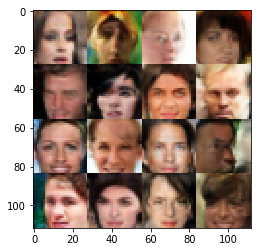

Epoch 7/8... Discriminator Loss: 1.3435 ... Generator Loss: 0.6179
Epoch 7/8... Discriminator Loss: 1.2658 ... Generator Loss: 0.7186
Epoch 7/8... Discriminator Loss: 1.2745 ... Generator Loss: 0.7134
Epoch 7/8... Discriminator Loss: 1.2333 ... Generator Loss: 0.7087
Epoch 7/8... Discriminator Loss: 1.1347 ... Generator Loss: 0.8003
Epoch 7/8... Discriminator Loss: 1.2046 ... Generator Loss: 0.9109
Epoch 7/8... Discriminator Loss: 1.3236 ... Generator Loss: 0.5405
Epoch 7/8... Discriminator Loss: 1.3815 ... Generator Loss: 0.7158
Epoch 7/8... Discriminator Loss: 1.1819 ... Generator Loss: 1.0219
Epoch 7/8... Discriminator Loss: 1.2081 ... Generator Loss: 0.8309


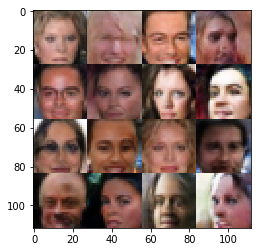

Epoch 7/8... Discriminator Loss: 1.3166 ... Generator Loss: 0.6696
Epoch 7/8... Discriminator Loss: 1.2670 ... Generator Loss: 0.7409
Epoch 7/8... Discriminator Loss: 1.2829 ... Generator Loss: 0.6913
Epoch 7/8... Discriminator Loss: 1.4722 ... Generator Loss: 0.4187
Epoch 7/8... Discriminator Loss: 1.3112 ... Generator Loss: 0.7078
Epoch 7/8... Discriminator Loss: 1.3613 ... Generator Loss: 0.7469
Epoch 7/8... Discriminator Loss: 1.4796 ... Generator Loss: 1.0407
Epoch 7/8... Discriminator Loss: 1.3886 ... Generator Loss: 0.6708
Epoch 7/8... Discriminator Loss: 1.3099 ... Generator Loss: 0.7700
Epoch 7/8... Discriminator Loss: 1.3022 ... Generator Loss: 1.0458


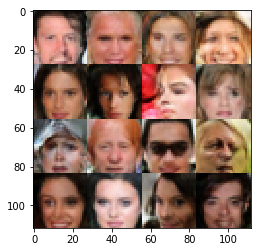

Epoch 7/8... Discriminator Loss: 1.2759 ... Generator Loss: 0.8112
Epoch 7/8... Discriminator Loss: 1.2406 ... Generator Loss: 0.7661
Epoch 7/8... Discriminator Loss: 1.2703 ... Generator Loss: 1.0532
Epoch 7/8... Discriminator Loss: 1.3254 ... Generator Loss: 0.6019
Epoch 7/8... Discriminator Loss: 1.2910 ... Generator Loss: 0.7511
Epoch 7/8... Discriminator Loss: 1.3654 ... Generator Loss: 0.6693
Epoch 7/8... Discriminator Loss: 1.2935 ... Generator Loss: 0.6200
Epoch 7/8... Discriminator Loss: 1.2806 ... Generator Loss: 0.5538
Epoch 7/8... Discriminator Loss: 1.2327 ... Generator Loss: 0.6406
Epoch 7/8... Discriminator Loss: 1.2505 ... Generator Loss: 0.9006


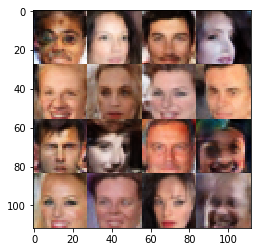

Epoch 7/8... Discriminator Loss: 1.3302 ... Generator Loss: 0.5270
Epoch 7/8... Discriminator Loss: 1.3211 ... Generator Loss: 0.7796
Epoch 7/8... Discriminator Loss: 1.4056 ... Generator Loss: 0.5149
Epoch 7/8... Discriminator Loss: 1.3351 ... Generator Loss: 0.8450
Epoch 7/8... Discriminator Loss: 1.2850 ... Generator Loss: 0.7000
Epoch 7/8... Discriminator Loss: 1.3581 ... Generator Loss: 0.6072
Epoch 7/8... Discriminator Loss: 1.2896 ... Generator Loss: 0.6606
Epoch 7/8... Discriminator Loss: 1.2854 ... Generator Loss: 0.6448
Epoch 7/8... Discriminator Loss: 1.2084 ... Generator Loss: 0.7008
Epoch 7/8... Discriminator Loss: 1.2708 ... Generator Loss: 0.6646


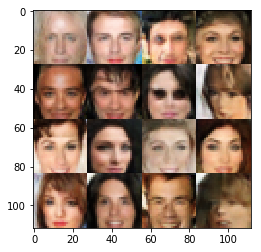

Epoch 7/8... Discriminator Loss: 1.2599 ... Generator Loss: 0.8366
Epoch 7/8... Discriminator Loss: 1.1015 ... Generator Loss: 0.7082
Epoch 7/8... Discriminator Loss: 1.3220 ... Generator Loss: 0.9131
Epoch 7/8... Discriminator Loss: 1.3575 ... Generator Loss: 0.6254
Epoch 7/8... Discriminator Loss: 1.3979 ... Generator Loss: 0.5826
Epoch 7/8... Discriminator Loss: 1.3259 ... Generator Loss: 0.7056
Epoch 7/8... Discriminator Loss: 1.4030 ... Generator Loss: 0.6791
Epoch 7/8... Discriminator Loss: 1.1312 ... Generator Loss: 0.6816
Epoch 7/8... Discriminator Loss: 1.3607 ... Generator Loss: 0.5627
Epoch 7/8... Discriminator Loss: 1.3560 ... Generator Loss: 0.5754


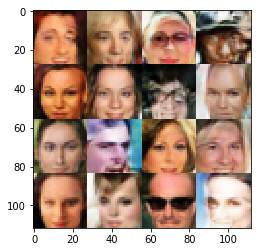

Epoch 7/8... Discriminator Loss: 1.2679 ... Generator Loss: 0.6968
Epoch 7/8... Discriminator Loss: 1.3228 ... Generator Loss: 0.6102
Epoch 7/8... Discriminator Loss: 1.3068 ... Generator Loss: 0.7916
Epoch 7/8... Discriminator Loss: 1.3258 ... Generator Loss: 0.7011
Epoch 7/8... Discriminator Loss: 1.3025 ... Generator Loss: 0.7060
Epoch 7/8... Discriminator Loss: 1.2399 ... Generator Loss: 0.6620
Epoch 7/8... Discriminator Loss: 1.2680 ... Generator Loss: 0.7288
Epoch 7/8... Discriminator Loss: 1.2710 ... Generator Loss: 0.8034
Epoch 7/8... Discriminator Loss: 1.2904 ... Generator Loss: 0.6430
Epoch 7/8... Discriminator Loss: 1.2674 ... Generator Loss: 0.8961


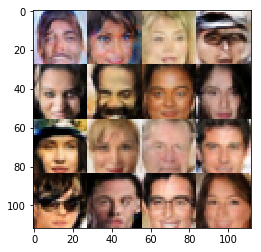

Epoch 7/8... Discriminator Loss: 1.1882 ... Generator Loss: 0.6535
Epoch 7/8... Discriminator Loss: 1.3928 ... Generator Loss: 0.6102
Epoch 7/8... Discriminator Loss: 1.2896 ... Generator Loss: 0.5609
Epoch 7/8... Discriminator Loss: 1.2814 ... Generator Loss: 0.7143
Epoch 7/8... Discriminator Loss: 1.3209 ... Generator Loss: 0.7619
Epoch 7/8... Discriminator Loss: 1.2264 ... Generator Loss: 0.7032
Epoch 7/8... Discriminator Loss: 1.2160 ... Generator Loss: 0.6754
Epoch 7/8... Discriminator Loss: 1.3208 ... Generator Loss: 0.6746
Epoch 7/8... Discriminator Loss: 1.3901 ... Generator Loss: 0.6618
Epoch 7/8... Discriminator Loss: 1.4020 ... Generator Loss: 0.4863


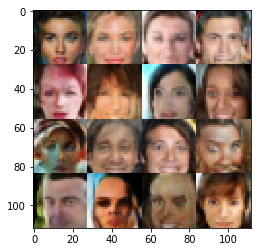

Epoch 7/8... Discriminator Loss: 1.3448 ... Generator Loss: 0.5132
Epoch 7/8... Discriminator Loss: 1.3424 ... Generator Loss: 0.7614
Epoch 7/8... Discriminator Loss: 1.2400 ... Generator Loss: 1.0113
Epoch 7/8... Discriminator Loss: 1.2700 ... Generator Loss: 0.6501
Epoch 7/8... Discriminator Loss: 1.3069 ... Generator Loss: 1.0098
Epoch 7/8... Discriminator Loss: 1.4252 ... Generator Loss: 0.4465
Epoch 7/8... Discriminator Loss: 1.4023 ... Generator Loss: 0.6510
Epoch 7/8... Discriminator Loss: 1.2857 ... Generator Loss: 0.6072
Epoch 7/8... Discriminator Loss: 1.3173 ... Generator Loss: 0.5566
Epoch 7/8... Discriminator Loss: 1.2595 ... Generator Loss: 0.7637


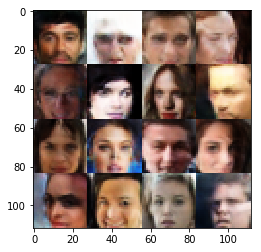

Epoch 7/8... Discriminator Loss: 1.3402 ... Generator Loss: 0.8510
Epoch 7/8... Discriminator Loss: 1.2810 ... Generator Loss: 0.6286
Epoch 7/8... Discriminator Loss: 1.3247 ... Generator Loss: 0.8584
Epoch 7/8... Discriminator Loss: 1.3814 ... Generator Loss: 0.6522
Epoch 7/8... Discriminator Loss: 1.2989 ... Generator Loss: 0.7395
Epoch 7/8... Discriminator Loss: 1.2501 ... Generator Loss: 0.8381
Epoch 7/8... Discriminator Loss: 1.3104 ... Generator Loss: 0.8045
Epoch 7/8... Discriminator Loss: 1.2633 ... Generator Loss: 0.8923
Epoch 7/8... Discriminator Loss: 1.2940 ... Generator Loss: 0.7215
Epoch 7/8... Discriminator Loss: 1.2345 ... Generator Loss: 0.8098


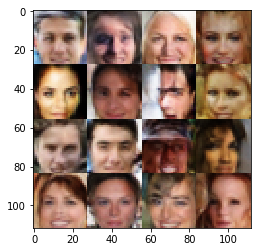

Epoch 7/8... Discriminator Loss: 1.3991 ... Generator Loss: 0.5367
Epoch 7/8... Discriminator Loss: 1.1906 ... Generator Loss: 0.7256
Epoch 7/8... Discriminator Loss: 1.4490 ... Generator Loss: 0.5208
Epoch 7/8... Discriminator Loss: 1.2484 ... Generator Loss: 0.9424
Epoch 7/8... Discriminator Loss: 1.3111 ... Generator Loss: 0.5995
Epoch 7/8... Discriminator Loss: 1.3829 ... Generator Loss: 0.6547
Epoch 7/8... Discriminator Loss: 1.2794 ... Generator Loss: 0.9253
Epoch 7/8... Discriminator Loss: 1.1856 ... Generator Loss: 1.4180
Epoch 7/8... Discriminator Loss: 1.1866 ... Generator Loss: 0.8985
Epoch 7/8... Discriminator Loss: 1.3193 ... Generator Loss: 1.0516


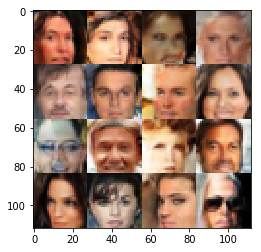

Epoch 7/8... Discriminator Loss: 1.3344 ... Generator Loss: 0.7445
Epoch 7/8... Discriminator Loss: 1.2895 ... Generator Loss: 0.6600
Epoch 7/8... Discriminator Loss: 1.2609 ... Generator Loss: 0.7477
Epoch 7/8... Discriminator Loss: 1.2267 ... Generator Loss: 0.6926
Epoch 7/8... Discriminator Loss: 1.2169 ... Generator Loss: 0.7419
Epoch 7/8... Discriminator Loss: 1.2760 ... Generator Loss: 0.9230
Epoch 7/8... Discriminator Loss: 1.1091 ... Generator Loss: 0.8687
Epoch 7/8... Discriminator Loss: 1.3029 ... Generator Loss: 0.6673
Epoch 7/8... Discriminator Loss: 1.2900 ... Generator Loss: 0.7323
Epoch 7/8... Discriminator Loss: 1.3387 ... Generator Loss: 0.6082


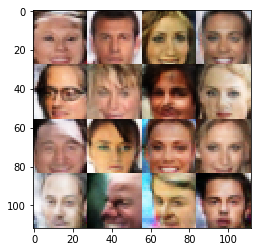

Epoch 7/8... Discriminator Loss: 1.2901 ... Generator Loss: 0.6361
Epoch 7/8... Discriminator Loss: 1.3341 ... Generator Loss: 0.8840
Epoch 7/8... Discriminator Loss: 1.3175 ... Generator Loss: 0.6169
Epoch 7/8... Discriminator Loss: 1.2583 ... Generator Loss: 0.7253
Epoch 7/8... Discriminator Loss: 1.2225 ... Generator Loss: 0.6471
Epoch 7/8... Discriminator Loss: 1.3408 ... Generator Loss: 1.0042
Epoch 7/8... Discriminator Loss: 1.2483 ... Generator Loss: 0.8142
Epoch 7/8... Discriminator Loss: 1.5819 ... Generator Loss: 0.3784
Epoch 7/8... Discriminator Loss: 1.2308 ... Generator Loss: 0.7190
Epoch 7/8... Discriminator Loss: 1.3458 ... Generator Loss: 0.6197


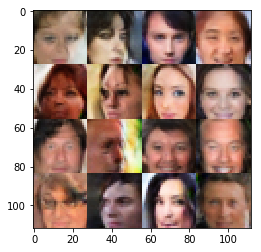

Epoch 7/8... Discriminator Loss: 1.2745 ... Generator Loss: 0.6851
Epoch 7/8... Discriminator Loss: 1.4572 ... Generator Loss: 0.5222
Epoch 7/8... Discriminator Loss: 1.4645 ... Generator Loss: 0.4955
Epoch 7/8... Discriminator Loss: 1.2940 ... Generator Loss: 0.8316
Epoch 7/8... Discriminator Loss: 1.2286 ... Generator Loss: 0.7015
Epoch 7/8... Discriminator Loss: 1.4214 ... Generator Loss: 0.7419
Epoch 7/8... Discriminator Loss: 1.1563 ... Generator Loss: 0.8030
Epoch 7/8... Discriminator Loss: 1.2445 ... Generator Loss: 0.7899
Epoch 7/8... Discriminator Loss: 1.2645 ... Generator Loss: 0.7853
Epoch 7/8... Discriminator Loss: 1.3174 ... Generator Loss: 0.6168


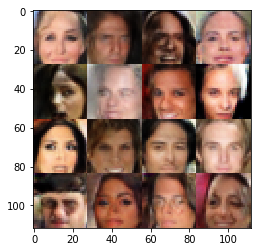

Epoch 7/8... Discriminator Loss: 1.2697 ... Generator Loss: 0.6146
Epoch 7/8... Discriminator Loss: 1.2648 ... Generator Loss: 0.7434
Epoch 7/8... Discriminator Loss: 1.1496 ... Generator Loss: 0.7151
Epoch 7/8... Discriminator Loss: 1.2661 ... Generator Loss: 0.6377
Epoch 7/8... Discriminator Loss: 1.2977 ... Generator Loss: 0.8987
Epoch 7/8... Discriminator Loss: 1.3155 ... Generator Loss: 0.5613
Epoch 7/8... Discriminator Loss: 1.2726 ... Generator Loss: 1.0187
Epoch 7/8... Discriminator Loss: 1.1905 ... Generator Loss: 0.8417
Epoch 7/8... Discriminator Loss: 1.2242 ... Generator Loss: 0.6329
Epoch 7/8... Discriminator Loss: 1.3450 ... Generator Loss: 0.6103


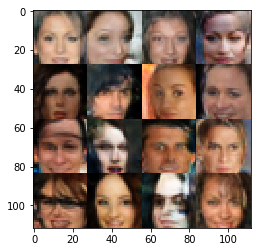

Epoch 7/8... Discriminator Loss: 1.2905 ... Generator Loss: 1.1324
Epoch 7/8... Discriminator Loss: 1.3789 ... Generator Loss: 0.7059
Epoch 7/8... Discriminator Loss: 1.2687 ... Generator Loss: 1.0173
Epoch 7/8... Discriminator Loss: 1.3677 ... Generator Loss: 0.6968
Epoch 7/8... Discriminator Loss: 1.2513 ... Generator Loss: 0.7599
Epoch 7/8... Discriminator Loss: 1.3144 ... Generator Loss: 0.9880
Epoch 7/8... Discriminator Loss: 1.2401 ... Generator Loss: 0.9197
Epoch 7/8... Discriminator Loss: 1.2208 ... Generator Loss: 0.8767
Epoch 7/8... Discriminator Loss: 1.2577 ... Generator Loss: 0.6631
Epoch 7/8... Discriminator Loss: 1.3637 ... Generator Loss: 0.6101


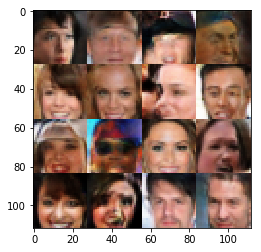

Epoch 7/8... Discriminator Loss: 1.1745 ... Generator Loss: 0.6340
Epoch 7/8... Discriminator Loss: 1.0919 ... Generator Loss: 1.1469
Epoch 7/8... Discriminator Loss: 1.2399 ... Generator Loss: 0.7343
Epoch 7/8... Discriminator Loss: 1.2495 ... Generator Loss: 0.8326
Epoch 7/8... Discriminator Loss: 1.1258 ... Generator Loss: 0.8526
Epoch 7/8... Discriminator Loss: 1.4352 ... Generator Loss: 1.0385
Epoch 7/8... Discriminator Loss: 1.3027 ... Generator Loss: 0.9516
Epoch 7/8... Discriminator Loss: 1.2438 ... Generator Loss: 0.9493
Epoch 7/8... Discriminator Loss: 1.3103 ... Generator Loss: 0.8046
Epoch 7/8... Discriminator Loss: 1.2979 ... Generator Loss: 0.6648


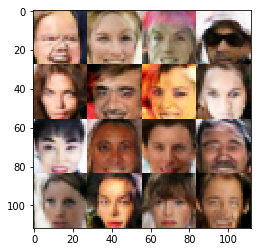

Epoch 7/8... Discriminator Loss: 1.3364 ... Generator Loss: 0.5241
Epoch 7/8... Discriminator Loss: 1.1808 ... Generator Loss: 0.8996
Epoch 7/8... Discriminator Loss: 1.3357 ... Generator Loss: 0.7768
Epoch 7/8... Discriminator Loss: 1.2904 ... Generator Loss: 0.5626
Epoch 7/8... Discriminator Loss: 1.1757 ... Generator Loss: 0.6989
Epoch 7/8... Discriminator Loss: 1.2964 ... Generator Loss: 0.6219
Epoch 7/8... Discriminator Loss: 1.3879 ... Generator Loss: 0.9252
Epoch 7/8... Discriminator Loss: 1.3153 ... Generator Loss: 0.5669
Epoch 7/8... Discriminator Loss: 1.3124 ... Generator Loss: 0.8689
Epoch 7/8... Discriminator Loss: 1.3115 ... Generator Loss: 0.8476


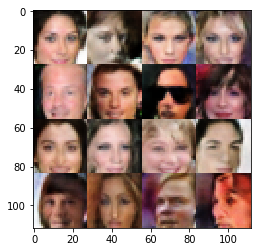

Epoch 7/8... Discriminator Loss: 1.3862 ... Generator Loss: 0.4963
Epoch 7/8... Discriminator Loss: 1.2845 ... Generator Loss: 0.5837
Epoch 7/8... Discriminator Loss: 1.3406 ... Generator Loss: 0.6238
Epoch 7/8... Discriminator Loss: 1.2630 ... Generator Loss: 0.7132
Epoch 7/8... Discriminator Loss: 1.2848 ... Generator Loss: 0.8267
Epoch 7/8... Discriminator Loss: 1.3737 ... Generator Loss: 0.6618
Epoch 7/8... Discriminator Loss: 1.3111 ... Generator Loss: 0.8140
Epoch 7/8... Discriminator Loss: 1.2748 ... Generator Loss: 0.6367
Epoch 7/8... Discriminator Loss: 1.3082 ... Generator Loss: 1.0473
Epoch 7/8... Discriminator Loss: 1.3334 ... Generator Loss: 0.6572


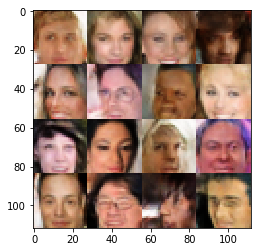

Epoch 7/8... Discriminator Loss: 1.2269 ... Generator Loss: 0.8351
Epoch 7/8... Discriminator Loss: 1.3672 ... Generator Loss: 0.7471
Epoch 7/8... Discriminator Loss: 1.3999 ... Generator Loss: 0.6133
Epoch 7/8... Discriminator Loss: 1.2357 ... Generator Loss: 0.7276
Epoch 7/8... Discriminator Loss: 1.2063 ... Generator Loss: 0.7075
Epoch 7/8... Discriminator Loss: 1.3035 ... Generator Loss: 0.7524
Epoch 7/8... Discriminator Loss: 1.2990 ... Generator Loss: 0.6571
Epoch 7/8... Discriminator Loss: 1.2580 ... Generator Loss: 0.8623
Epoch 7/8... Discriminator Loss: 1.3444 ... Generator Loss: 0.6049
Epoch 7/8... Discriminator Loss: 1.4320 ... Generator Loss: 1.1008


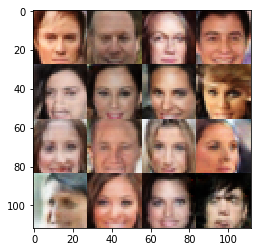

Epoch 7/8... Discriminator Loss: 1.2140 ... Generator Loss: 1.0207
Epoch 7/8... Discriminator Loss: 1.3722 ... Generator Loss: 0.5855
Epoch 7/8... Discriminator Loss: 1.3301 ... Generator Loss: 0.8055
Epoch 7/8... Discriminator Loss: 1.3752 ... Generator Loss: 0.6837
Epoch 7/8... Discriminator Loss: 1.3634 ... Generator Loss: 0.6315


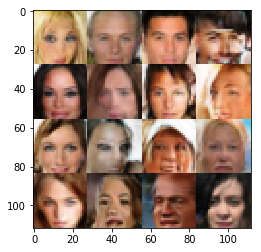

Epoch 8/8... Discriminator Loss: 1.4146 ... Generator Loss: 0.4742
Epoch 8/8... Discriminator Loss: 1.3326 ... Generator Loss: 0.6722
Epoch 8/8... Discriminator Loss: 1.2811 ... Generator Loss: 0.6877
Epoch 8/8... Discriminator Loss: 1.3360 ... Generator Loss: 1.0497
Epoch 8/8... Discriminator Loss: 1.3589 ... Generator Loss: 0.8564


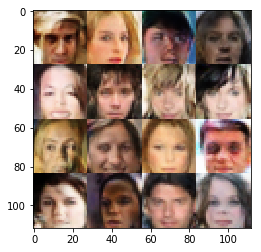

Epoch 8/8... Discriminator Loss: 1.2912 ... Generator Loss: 0.6969
Epoch 8/8... Discriminator Loss: 1.2067 ... Generator Loss: 0.7738
Epoch 8/8... Discriminator Loss: 1.2560 ... Generator Loss: 0.9783
Epoch 8/8... Discriminator Loss: 1.3742 ... Generator Loss: 0.6726
Epoch 8/8... Discriminator Loss: 1.2125 ... Generator Loss: 0.6622
Epoch 8/8... Discriminator Loss: 1.4310 ... Generator Loss: 0.5847
Epoch 8/8... Discriminator Loss: 1.3677 ... Generator Loss: 0.7892
Epoch 8/8... Discriminator Loss: 1.2974 ... Generator Loss: 0.7430
Epoch 8/8... Discriminator Loss: 1.3709 ... Generator Loss: 0.5632
Epoch 8/8... Discriminator Loss: 1.3135 ... Generator Loss: 0.7378


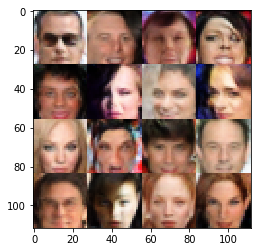

Epoch 8/8... Discriminator Loss: 1.5061 ... Generator Loss: 0.4653
Epoch 8/8... Discriminator Loss: 1.3259 ... Generator Loss: 0.6010
Epoch 8/8... Discriminator Loss: 1.3352 ... Generator Loss: 0.6030
Epoch 8/8... Discriminator Loss: 1.2210 ... Generator Loss: 0.7851
Epoch 8/8... Discriminator Loss: 1.3720 ... Generator Loss: 0.6919
Epoch 8/8... Discriminator Loss: 1.3069 ... Generator Loss: 0.6971
Epoch 8/8... Discriminator Loss: 1.3042 ... Generator Loss: 0.9831
Epoch 8/8... Discriminator Loss: 1.3738 ... Generator Loss: 0.5761
Epoch 8/8... Discriminator Loss: 1.2725 ... Generator Loss: 0.5825
Epoch 8/8... Discriminator Loss: 1.2809 ... Generator Loss: 0.7556


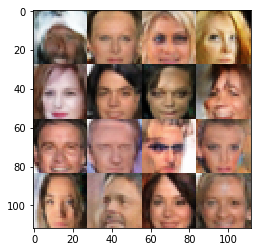

Epoch 8/8... Discriminator Loss: 1.2474 ... Generator Loss: 0.7088
Epoch 8/8... Discriminator Loss: 1.2793 ... Generator Loss: 0.7781
Epoch 8/8... Discriminator Loss: 1.2863 ... Generator Loss: 0.7828
Epoch 8/8... Discriminator Loss: 1.3046 ... Generator Loss: 0.6548
Epoch 8/8... Discriminator Loss: 1.3498 ... Generator Loss: 0.6372
Epoch 8/8... Discriminator Loss: 1.3181 ... Generator Loss: 0.6787
Epoch 8/8... Discriminator Loss: 1.2319 ... Generator Loss: 0.7766
Epoch 8/8... Discriminator Loss: 1.2328 ... Generator Loss: 0.6721
Epoch 8/8... Discriminator Loss: 1.4149 ... Generator Loss: 0.5371
Epoch 8/8... Discriminator Loss: 1.2279 ... Generator Loss: 0.7897


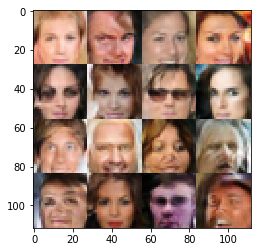

Epoch 8/8... Discriminator Loss: 1.3375 ... Generator Loss: 0.5744
Epoch 8/8... Discriminator Loss: 1.2929 ... Generator Loss: 0.6920
Epoch 8/8... Discriminator Loss: 1.3066 ... Generator Loss: 0.8315
Epoch 8/8... Discriminator Loss: 1.2513 ... Generator Loss: 0.8309
Epoch 8/8... Discriminator Loss: 1.2220 ... Generator Loss: 0.9783
Epoch 8/8... Discriminator Loss: 1.2499 ... Generator Loss: 0.7739
Epoch 8/8... Discriminator Loss: 1.2792 ... Generator Loss: 0.8549
Epoch 8/8... Discriminator Loss: 1.1048 ... Generator Loss: 0.8857
Epoch 8/8... Discriminator Loss: 1.3325 ... Generator Loss: 0.6526
Epoch 8/8... Discriminator Loss: 1.2902 ... Generator Loss: 0.7563


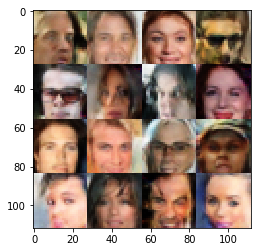

Epoch 8/8... Discriminator Loss: 1.1808 ... Generator Loss: 0.8121
Epoch 8/8... Discriminator Loss: 1.2818 ... Generator Loss: 0.6648
Epoch 8/8... Discriminator Loss: 1.2142 ... Generator Loss: 0.6980
Epoch 8/8... Discriminator Loss: 1.1831 ... Generator Loss: 0.6973
Epoch 8/8... Discriminator Loss: 1.0491 ... Generator Loss: 0.8608
Epoch 8/8... Discriminator Loss: 1.3302 ... Generator Loss: 0.7701
Epoch 8/8... Discriminator Loss: 1.1815 ... Generator Loss: 0.9661
Epoch 8/8... Discriminator Loss: 1.3033 ... Generator Loss: 0.9687
Epoch 8/8... Discriminator Loss: 1.3703 ... Generator Loss: 0.7202
Epoch 8/8... Discriminator Loss: 1.3579 ... Generator Loss: 0.6475


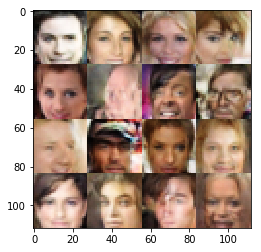

Epoch 8/8... Discriminator Loss: 1.3395 ... Generator Loss: 0.5034
Epoch 8/8... Discriminator Loss: 1.2648 ... Generator Loss: 0.7226
Epoch 8/8... Discriminator Loss: 1.2811 ... Generator Loss: 0.6129
Epoch 8/8... Discriminator Loss: 1.3819 ... Generator Loss: 0.8015
Epoch 8/8... Discriminator Loss: 1.2674 ... Generator Loss: 0.5869
Epoch 8/8... Discriminator Loss: 1.3601 ... Generator Loss: 0.5949
Epoch 8/8... Discriminator Loss: 1.3930 ... Generator Loss: 0.8254
Epoch 8/8... Discriminator Loss: 1.2949 ... Generator Loss: 0.7670
Epoch 8/8... Discriminator Loss: 1.4187 ... Generator Loss: 0.4445
Epoch 8/8... Discriminator Loss: 1.3194 ... Generator Loss: 0.5317


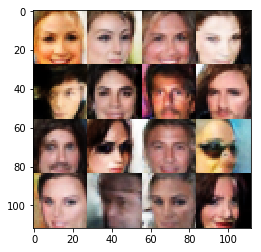

Epoch 8/8... Discriminator Loss: 1.2525 ... Generator Loss: 0.7904
Epoch 8/8... Discriminator Loss: 1.3238 ... Generator Loss: 0.8339
Epoch 8/8... Discriminator Loss: 1.2897 ... Generator Loss: 0.7286
Epoch 8/8... Discriminator Loss: 1.3828 ... Generator Loss: 0.5704
Epoch 8/8... Discriminator Loss: 1.2523 ... Generator Loss: 0.6505
Epoch 8/8... Discriminator Loss: 1.3360 ... Generator Loss: 0.6326
Epoch 8/8... Discriminator Loss: 1.3243 ... Generator Loss: 0.6643
Epoch 8/8... Discriminator Loss: 1.2418 ... Generator Loss: 0.7508
Epoch 8/8... Discriminator Loss: 1.3046 ... Generator Loss: 0.6300
Epoch 8/8... Discriminator Loss: 1.3030 ... Generator Loss: 0.6250


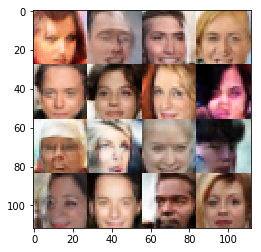

Epoch 8/8... Discriminator Loss: 1.3568 ... Generator Loss: 0.8068
Epoch 8/8... Discriminator Loss: 1.2618 ... Generator Loss: 0.7197
Epoch 8/8... Discriminator Loss: 1.3048 ... Generator Loss: 0.9059
Epoch 8/8... Discriminator Loss: 1.2362 ... Generator Loss: 0.8586
Epoch 8/8... Discriminator Loss: 1.2352 ... Generator Loss: 0.6911
Epoch 8/8... Discriminator Loss: 1.3800 ... Generator Loss: 0.4628
Epoch 8/8... Discriminator Loss: 1.3960 ... Generator Loss: 0.5292
Epoch 8/8... Discriminator Loss: 1.3426 ... Generator Loss: 0.7288
Epoch 8/8... Discriminator Loss: 1.2708 ... Generator Loss: 0.9578
Epoch 8/8... Discriminator Loss: 1.2807 ... Generator Loss: 0.6371


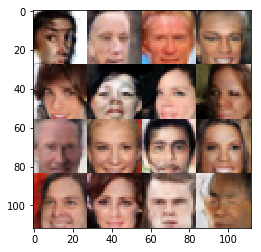

Epoch 8/8... Discriminator Loss: 1.3086 ... Generator Loss: 0.7635
Epoch 8/8... Discriminator Loss: 1.0700 ... Generator Loss: 0.9193
Epoch 8/8... Discriminator Loss: 1.2557 ... Generator Loss: 0.7842
Epoch 8/8... Discriminator Loss: 1.1494 ... Generator Loss: 0.7724
Epoch 8/8... Discriminator Loss: 1.3526 ... Generator Loss: 0.6616
Epoch 8/8... Discriminator Loss: 1.2066 ... Generator Loss: 0.6759
Epoch 8/8... Discriminator Loss: 1.2156 ... Generator Loss: 0.7035
Epoch 8/8... Discriminator Loss: 1.2994 ... Generator Loss: 0.6756
Epoch 8/8... Discriminator Loss: 1.3121 ... Generator Loss: 0.7855
Epoch 8/8... Discriminator Loss: 1.3521 ... Generator Loss: 0.5746


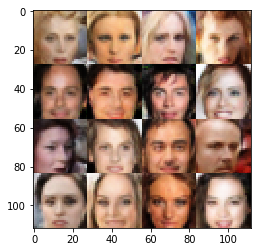

Epoch 8/8... Discriminator Loss: 1.1931 ... Generator Loss: 0.8750
Epoch 8/8... Discriminator Loss: 1.3846 ... Generator Loss: 1.1707
Epoch 8/8... Discriminator Loss: 1.2069 ... Generator Loss: 0.7273
Epoch 8/8... Discriminator Loss: 1.2427 ... Generator Loss: 0.8028
Epoch 8/8... Discriminator Loss: 1.2285 ... Generator Loss: 0.5899
Epoch 8/8... Discriminator Loss: 1.2375 ... Generator Loss: 0.7671
Epoch 8/8... Discriminator Loss: 1.2190 ... Generator Loss: 0.8377
Epoch 8/8... Discriminator Loss: 1.2580 ... Generator Loss: 0.6643
Epoch 8/8... Discriminator Loss: 1.1986 ... Generator Loss: 0.7746
Epoch 8/8... Discriminator Loss: 1.2153 ... Generator Loss: 0.8940


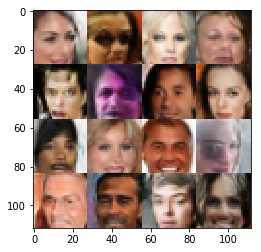

Epoch 8/8... Discriminator Loss: 1.3452 ... Generator Loss: 0.8064
Epoch 8/8... Discriminator Loss: 1.3092 ... Generator Loss: 0.6183
Epoch 8/8... Discriminator Loss: 1.2614 ... Generator Loss: 0.7620
Epoch 8/8... Discriminator Loss: 1.2816 ... Generator Loss: 0.8047
Epoch 8/8... Discriminator Loss: 1.2961 ... Generator Loss: 0.6933
Epoch 8/8... Discriminator Loss: 1.2386 ... Generator Loss: 0.7596
Epoch 8/8... Discriminator Loss: 1.4130 ... Generator Loss: 0.5015
Epoch 8/8... Discriminator Loss: 1.3631 ... Generator Loss: 0.5129
Epoch 8/8... Discriminator Loss: 1.2345 ... Generator Loss: 0.8114
Epoch 8/8... Discriminator Loss: 1.1482 ... Generator Loss: 0.7983


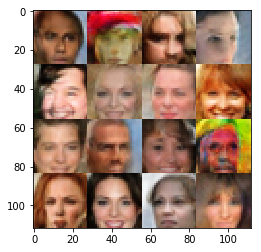

Epoch 8/8... Discriminator Loss: 1.1549 ... Generator Loss: 0.8823
Epoch 8/8... Discriminator Loss: 1.3116 ... Generator Loss: 0.8914
Epoch 8/8... Discriminator Loss: 1.3504 ... Generator Loss: 0.6970
Epoch 8/8... Discriminator Loss: 1.2250 ... Generator Loss: 0.7577
Epoch 8/8... Discriminator Loss: 1.2650 ... Generator Loss: 0.9854
Epoch 8/8... Discriminator Loss: 1.3490 ... Generator Loss: 0.7977
Epoch 8/8... Discriminator Loss: 1.4556 ... Generator Loss: 0.4845
Epoch 8/8... Discriminator Loss: 1.3753 ... Generator Loss: 0.8164
Epoch 8/8... Discriminator Loss: 1.2494 ... Generator Loss: 0.7634
Epoch 8/8... Discriminator Loss: 1.3457 ... Generator Loss: 0.9712


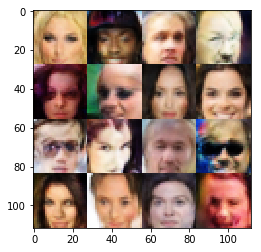

Epoch 8/8... Discriminator Loss: 1.1656 ... Generator Loss: 0.8228
Epoch 8/8... Discriminator Loss: 1.2843 ... Generator Loss: 0.6636
Epoch 8/8... Discriminator Loss: 1.2514 ... Generator Loss: 0.9256
Epoch 8/8... Discriminator Loss: 1.2657 ... Generator Loss: 0.7950
Epoch 8/8... Discriminator Loss: 1.2128 ... Generator Loss: 0.7406
Epoch 8/8... Discriminator Loss: 1.2310 ... Generator Loss: 0.7920
Epoch 8/8... Discriminator Loss: 1.3622 ... Generator Loss: 0.5450
Epoch 8/8... Discriminator Loss: 1.2238 ... Generator Loss: 0.7302
Epoch 8/8... Discriminator Loss: 1.2776 ... Generator Loss: 0.8333
Epoch 8/8... Discriminator Loss: 1.2763 ... Generator Loss: 0.9250


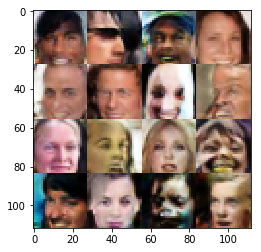

Epoch 8/8... Discriminator Loss: 1.2541 ... Generator Loss: 0.8005
Epoch 8/8... Discriminator Loss: 1.2507 ... Generator Loss: 0.7799
Epoch 8/8... Discriminator Loss: 1.2898 ... Generator Loss: 0.6547
Epoch 8/8... Discriminator Loss: 1.2951 ... Generator Loss: 0.7394
Epoch 8/8... Discriminator Loss: 1.3314 ... Generator Loss: 0.5675
Epoch 8/8... Discriminator Loss: 1.1588 ... Generator Loss: 0.7462
Epoch 8/8... Discriminator Loss: 1.2475 ... Generator Loss: 0.8252
Epoch 8/8... Discriminator Loss: 1.3125 ... Generator Loss: 0.7286
Epoch 8/8... Discriminator Loss: 1.2747 ... Generator Loss: 0.7993
Epoch 8/8... Discriminator Loss: 1.1753 ... Generator Loss: 0.9006


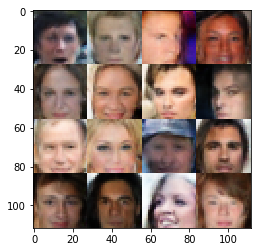

Epoch 8/8... Discriminator Loss: 1.3123 ... Generator Loss: 0.9536
Epoch 8/8... Discriminator Loss: 1.2424 ... Generator Loss: 0.7970
Epoch 8/8... Discriminator Loss: 1.3277 ... Generator Loss: 1.1265
Epoch 8/8... Discriminator Loss: 1.4991 ... Generator Loss: 0.5711
Epoch 8/8... Discriminator Loss: 1.4131 ... Generator Loss: 0.9198
Epoch 8/8... Discriminator Loss: 1.3532 ... Generator Loss: 0.5270
Epoch 8/8... Discriminator Loss: 1.4758 ... Generator Loss: 0.5121
Epoch 8/8... Discriminator Loss: 1.2124 ... Generator Loss: 0.8267
Epoch 8/8... Discriminator Loss: 1.1845 ... Generator Loss: 0.7758
Epoch 8/8... Discriminator Loss: 1.3005 ... Generator Loss: 0.6896


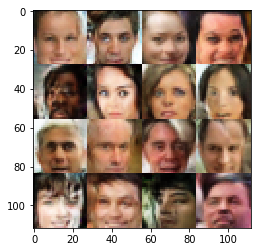

Epoch 8/8... Discriminator Loss: 1.2189 ... Generator Loss: 0.6998
Epoch 8/8... Discriminator Loss: 1.2773 ... Generator Loss: 0.7083
Epoch 8/8... Discriminator Loss: 1.2920 ... Generator Loss: 0.6528
Epoch 8/8... Discriminator Loss: 1.4026 ... Generator Loss: 0.5355
Epoch 8/8... Discriminator Loss: 1.2197 ... Generator Loss: 0.8379
Epoch 8/8... Discriminator Loss: 1.0870 ... Generator Loss: 0.9059
Epoch 8/8... Discriminator Loss: 1.2589 ... Generator Loss: 0.6804
Epoch 8/8... Discriminator Loss: 1.1544 ... Generator Loss: 0.7928
Epoch 8/8... Discriminator Loss: 1.2913 ... Generator Loss: 0.7069
Epoch 8/8... Discriminator Loss: 1.2703 ... Generator Loss: 0.6938


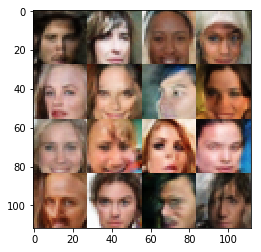

Epoch 8/8... Discriminator Loss: 1.3808 ... Generator Loss: 0.8488
Epoch 8/8... Discriminator Loss: 1.3494 ... Generator Loss: 0.5933
Epoch 8/8... Discriminator Loss: 1.1846 ... Generator Loss: 1.0923
Epoch 8/8... Discriminator Loss: 1.2326 ... Generator Loss: 0.6926
Epoch 8/8... Discriminator Loss: 1.1246 ... Generator Loss: 0.8486
Epoch 8/8... Discriminator Loss: 1.2354 ... Generator Loss: 0.8302
Epoch 8/8... Discriminator Loss: 1.2107 ... Generator Loss: 0.6006
Epoch 8/8... Discriminator Loss: 1.2607 ... Generator Loss: 0.8016
Epoch 8/8... Discriminator Loss: 1.2506 ... Generator Loss: 0.8838
Epoch 8/8... Discriminator Loss: 1.2996 ... Generator Loss: 0.7709


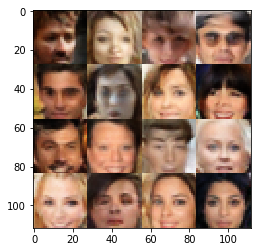

Epoch 8/8... Discriminator Loss: 1.2525 ... Generator Loss: 0.9437
Epoch 8/8... Discriminator Loss: 1.2986 ... Generator Loss: 0.6769
Epoch 8/8... Discriminator Loss: 1.3828 ... Generator Loss: 0.5333
Epoch 8/8... Discriminator Loss: 1.1701 ... Generator Loss: 0.8427
Epoch 8/8... Discriminator Loss: 1.3021 ... Generator Loss: 0.6793
Epoch 8/8... Discriminator Loss: 1.2249 ... Generator Loss: 0.8841
Epoch 8/8... Discriminator Loss: 1.3970 ... Generator Loss: 0.5719
Epoch 8/8... Discriminator Loss: 1.2749 ... Generator Loss: 0.7003
Epoch 8/8... Discriminator Loss: 1.3253 ... Generator Loss: 0.9848
Epoch 8/8... Discriminator Loss: 1.3210 ... Generator Loss: 0.6334


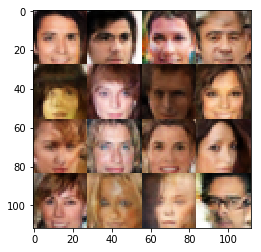

Epoch 8/8... Discriminator Loss: 1.2857 ... Generator Loss: 0.6282
Epoch 8/8... Discriminator Loss: 1.1698 ... Generator Loss: 0.7924
Epoch 8/8... Discriminator Loss: 1.2787 ... Generator Loss: 0.7154
Epoch 8/8... Discriminator Loss: 1.2227 ... Generator Loss: 0.7660
Epoch 8/8... Discriminator Loss: 1.1179 ... Generator Loss: 0.8717
Epoch 8/8... Discriminator Loss: 1.2439 ... Generator Loss: 0.6655
Epoch 8/8... Discriminator Loss: 1.1871 ... Generator Loss: 0.9944
Epoch 8/8... Discriminator Loss: 1.1846 ... Generator Loss: 0.6806
Epoch 8/8... Discriminator Loss: 1.2324 ... Generator Loss: 0.8720
Epoch 8/8... Discriminator Loss: 1.2406 ... Generator Loss: 0.7986


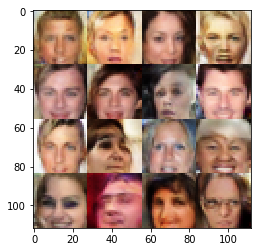

Epoch 8/8... Discriminator Loss: 1.2894 ... Generator Loss: 0.7330
Epoch 8/8... Discriminator Loss: 1.2240 ... Generator Loss: 0.7197
Epoch 8/8... Discriminator Loss: 1.2626 ... Generator Loss: 0.7760
Epoch 8/8... Discriminator Loss: 1.2216 ... Generator Loss: 0.5898
Epoch 8/8... Discriminator Loss: 1.3933 ... Generator Loss: 0.6238
Epoch 8/8... Discriminator Loss: 1.3430 ... Generator Loss: 0.4948
Epoch 8/8... Discriminator Loss: 1.3622 ... Generator Loss: 0.8005
Epoch 8/8... Discriminator Loss: 1.1746 ... Generator Loss: 0.7819
Epoch 8/8... Discriminator Loss: 1.1877 ... Generator Loss: 0.7280
Epoch 8/8... Discriminator Loss: 1.2982 ... Generator Loss: 0.9035


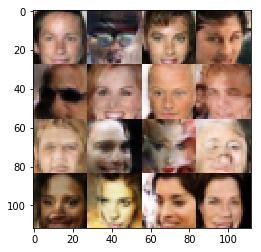

Epoch 8/8... Discriminator Loss: 1.3115 ... Generator Loss: 0.8291
Epoch 8/8... Discriminator Loss: 1.2148 ... Generator Loss: 0.6659
Epoch 8/8... Discriminator Loss: 1.3182 ... Generator Loss: 0.8222
Epoch 8/8... Discriminator Loss: 1.2608 ... Generator Loss: 0.7555
Epoch 8/8... Discriminator Loss: 1.1187 ... Generator Loss: 0.7691
Epoch 8/8... Discriminator Loss: 1.2386 ... Generator Loss: 0.7916
Epoch 8/8... Discriminator Loss: 1.2760 ... Generator Loss: 0.6686
Epoch 8/8... Discriminator Loss: 1.3002 ... Generator Loss: 0.5907
Epoch 8/8... Discriminator Loss: 1.3129 ... Generator Loss: 1.0520
Epoch 8/8... Discriminator Loss: 1.1767 ... Generator Loss: 0.9668


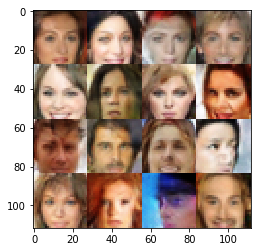

Epoch 8/8... Discriminator Loss: 1.3142 ... Generator Loss: 1.0146
Epoch 8/8... Discriminator Loss: 1.2781 ... Generator Loss: 0.8542
Epoch 8/8... Discriminator Loss: 1.3034 ... Generator Loss: 0.8158
Epoch 8/8... Discriminator Loss: 1.3731 ... Generator Loss: 0.4854
Epoch 8/8... Discriminator Loss: 1.2743 ... Generator Loss: 0.7431
Epoch 8/8... Discriminator Loss: 1.2812 ... Generator Loss: 0.6973
Epoch 8/8... Discriminator Loss: 1.3379 ... Generator Loss: 0.7507
Epoch 8/8... Discriminator Loss: 1.1620 ... Generator Loss: 0.7676
Epoch 8/8... Discriminator Loss: 1.4257 ... Generator Loss: 0.6110
Epoch 8/8... Discriminator Loss: 1.1636 ... Generator Loss: 0.6627


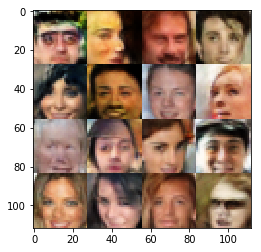

Epoch 8/8... Discriminator Loss: 1.4642 ... Generator Loss: 0.4618
Epoch 8/8... Discriminator Loss: 1.3051 ... Generator Loss: 0.5135
Epoch 8/8... Discriminator Loss: 1.2852 ... Generator Loss: 0.9131
Epoch 8/8... Discriminator Loss: 1.2977 ... Generator Loss: 0.6010
Epoch 8/8... Discriminator Loss: 1.3427 ... Generator Loss: 0.8325
Epoch 8/8... Discriminator Loss: 1.1628 ... Generator Loss: 0.8816
Epoch 8/8... Discriminator Loss: 1.2957 ... Generator Loss: 0.5694
Epoch 8/8... Discriminator Loss: 1.1923 ... Generator Loss: 0.8212
Epoch 8/8... Discriminator Loss: 1.3182 ... Generator Loss: 0.8724
Epoch 8/8... Discriminator Loss: 1.1667 ... Generator Loss: 0.9369


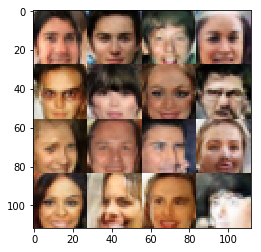

Epoch 8/8... Discriminator Loss: 1.3081 ... Generator Loss: 0.5470
Epoch 8/8... Discriminator Loss: 1.3827 ... Generator Loss: 0.6262
Epoch 8/8... Discriminator Loss: 1.2397 ... Generator Loss: 0.5850
Epoch 8/8... Discriminator Loss: 1.1890 ... Generator Loss: 1.0056
Epoch 8/8... Discriminator Loss: 1.2783 ... Generator Loss: 0.6570
Epoch 8/8... Discriminator Loss: 1.3263 ... Generator Loss: 0.8438
Epoch 8/8... Discriminator Loss: 1.3403 ... Generator Loss: 0.5737
Epoch 8/8... Discriminator Loss: 1.3714 ... Generator Loss: 0.5672
Epoch 8/8... Discriminator Loss: 1.2006 ... Generator Loss: 1.0098
Epoch 8/8... Discriminator Loss: 1.2109 ... Generator Loss: 0.9320


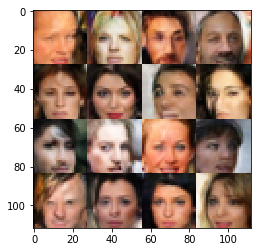

Epoch 8/8... Discriminator Loss: 1.2761 ... Generator Loss: 0.5891
Epoch 8/8... Discriminator Loss: 1.1999 ... Generator Loss: 0.7403
Epoch 8/8... Discriminator Loss: 1.2391 ... Generator Loss: 0.7864
Epoch 8/8... Discriminator Loss: 1.1910 ... Generator Loss: 0.8337
Epoch 8/8... Discriminator Loss: 1.3593 ... Generator Loss: 0.6188
Epoch 8/8... Discriminator Loss: 1.2625 ... Generator Loss: 0.6368
Epoch 8/8... Discriminator Loss: 1.3553 ... Generator Loss: 0.6249
Epoch 8/8... Discriminator Loss: 1.2977 ... Generator Loss: 0.6544
Epoch 8/8... Discriminator Loss: 1.2347 ... Generator Loss: 0.6475
Epoch 8/8... Discriminator Loss: 1.2244 ... Generator Loss: 0.9752


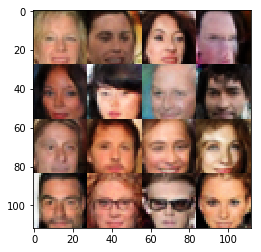

Epoch 8/8... Discriminator Loss: 1.2464 ... Generator Loss: 0.7284
Epoch 8/8... Discriminator Loss: 1.1250 ... Generator Loss: 0.8533
Epoch 8/8... Discriminator Loss: 1.3273 ... Generator Loss: 0.6538
Epoch 8/8... Discriminator Loss: 1.2270 ... Generator Loss: 0.6830
Epoch 8/8... Discriminator Loss: 1.2440 ... Generator Loss: 0.6895
Epoch 8/8... Discriminator Loss: 1.3761 ... Generator Loss: 0.5998
Epoch 8/8... Discriminator Loss: 1.2583 ... Generator Loss: 0.7595
Epoch 8/8... Discriminator Loss: 1.2327 ... Generator Loss: 0.8408
Epoch 8/8... Discriminator Loss: 1.1349 ... Generator Loss: 0.9576
Epoch 8/8... Discriminator Loss: 1.2018 ... Generator Loss: 0.6996


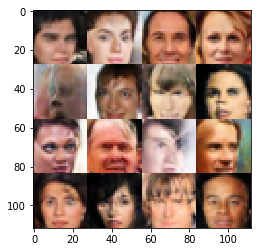

Epoch 8/8... Discriminator Loss: 1.3315 ... Generator Loss: 0.6797
Epoch 8/8... Discriminator Loss: 1.3082 ... Generator Loss: 0.6317
Epoch 8/8... Discriminator Loss: 1.1736 ... Generator Loss: 0.8906
Epoch 8/8... Discriminator Loss: 1.3915 ... Generator Loss: 0.6343
Epoch 8/8... Discriminator Loss: 1.3021 ... Generator Loss: 0.5977
Epoch 8/8... Discriminator Loss: 1.2168 ... Generator Loss: 0.8357
Epoch 8/8... Discriminator Loss: 1.4047 ... Generator Loss: 1.0971
Epoch 8/8... Discriminator Loss: 1.2809 ... Generator Loss: 0.8342
Epoch 8/8... Discriminator Loss: 1.4548 ... Generator Loss: 0.5525
Epoch 8/8... Discriminator Loss: 1.2526 ... Generator Loss: 0.7574


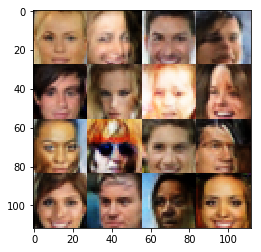

Epoch 8/8... Discriminator Loss: 1.2403 ... Generator Loss: 1.0521
Epoch 8/8... Discriminator Loss: 1.1912 ... Generator Loss: 0.8292
Epoch 8/8... Discriminator Loss: 1.3011 ... Generator Loss: 0.7041
Epoch 8/8... Discriminator Loss: 1.2012 ... Generator Loss: 0.9377
Epoch 8/8... Discriminator Loss: 1.1518 ... Generator Loss: 0.8824
Epoch 8/8... Discriminator Loss: 1.2389 ... Generator Loss: 0.6455
Epoch 8/8... Discriminator Loss: 1.2003 ... Generator Loss: 0.9435
Epoch 8/8... Discriminator Loss: 1.2427 ... Generator Loss: 0.7125
Epoch 8/8... Discriminator Loss: 1.0315 ... Generator Loss: 0.9829
Epoch 8/8... Discriminator Loss: 1.4195 ... Generator Loss: 0.5756


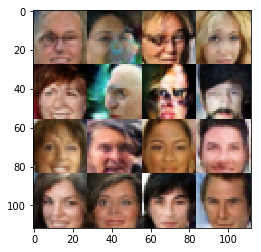

Epoch 8/8... Discriminator Loss: 1.2338 ... Generator Loss: 0.8106
Epoch 8/8... Discriminator Loss: 1.2730 ... Generator Loss: 0.7473
Epoch 8/8... Discriminator Loss: 1.2852 ... Generator Loss: 0.6426
Epoch 8/8... Discriminator Loss: 1.2845 ... Generator Loss: 0.7725
Epoch 8/8... Discriminator Loss: 1.2418 ... Generator Loss: 0.7709
Epoch 8/8... Discriminator Loss: 1.3499 ... Generator Loss: 0.8129
Epoch 8/8... Discriminator Loss: 1.1249 ... Generator Loss: 0.6223
Epoch 8/8... Discriminator Loss: 1.2638 ... Generator Loss: 0.6904
Epoch 8/8... Discriminator Loss: 1.2211 ... Generator Loss: 0.8508
Epoch 8/8... Discriminator Loss: 1.2929 ... Generator Loss: 1.0734


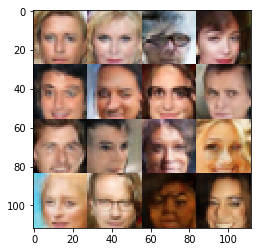

Epoch 8/8... Discriminator Loss: 1.2961 ... Generator Loss: 0.6477
Epoch 8/8... Discriminator Loss: 1.2817 ... Generator Loss: 0.8089
Epoch 8/8... Discriminator Loss: 1.1562 ... Generator Loss: 0.7469
Epoch 8/8... Discriminator Loss: 1.2103 ... Generator Loss: 0.7031
Epoch 8/8... Discriminator Loss: 1.1666 ... Generator Loss: 0.6794
Epoch 8/8... Discriminator Loss: 1.3273 ... Generator Loss: 0.6762
Epoch 8/8... Discriminator Loss: 1.3317 ... Generator Loss: 0.6578
Epoch 8/8... Discriminator Loss: 1.2394 ... Generator Loss: 0.8239
Epoch 8/8... Discriminator Loss: 1.2640 ... Generator Loss: 0.9595
Epoch 8/8... Discriminator Loss: 1.2196 ... Generator Loss: 0.7421


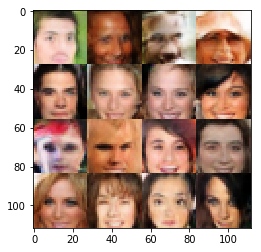

Epoch 8/8... Discriminator Loss: 1.1227 ... Generator Loss: 0.8975
Epoch 8/8... Discriminator Loss: 1.2839 ... Generator Loss: 0.7087
Epoch 8/8... Discriminator Loss: 1.2693 ... Generator Loss: 0.7778
Epoch 8/8... Discriminator Loss: 1.2238 ... Generator Loss: 0.7207
Epoch 8/8... Discriminator Loss: 1.1155 ... Generator Loss: 0.9161
Epoch 8/8... Discriminator Loss: 1.5154 ... Generator Loss: 1.2526
Epoch 8/8... Discriminator Loss: 1.3713 ... Generator Loss: 0.5897
Epoch 8/8... Discriminator Loss: 0.9815 ... Generator Loss: 0.9242
Epoch 8/8... Discriminator Loss: 1.3940 ... Generator Loss: 0.6601
Epoch 8/8... Discriminator Loss: 1.1911 ... Generator Loss: 0.8746


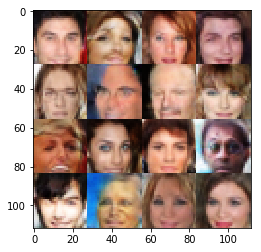

Epoch 8/8... Discriminator Loss: 1.2526 ... Generator Loss: 0.6143
Epoch 8/8... Discriminator Loss: 1.2026 ... Generator Loss: 0.7566


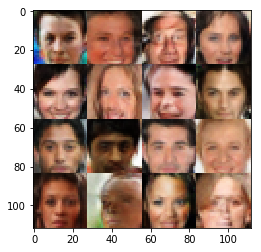

In [16]:
batch_size  = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 8

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.